#### PROJECT GOAL: THE GOAL OF THE PROJECT IS TO TEST THE DEGREE OF EFFECTIVENESS OF SELECTED MACHINE LEARNING MODELS/ALGORITHMS TO PREDICT VALUE OF "SALE_PRICE" FEATURE OF HOUSE PRICES - ADVANCED REGRESSION TECHNIQUES KAGGLE CASE

In [1]:
import pandas as pd

import matplotlib.pyplot as plt

import seaborn as sns

from scipy import stats
from scipy.stats import norm, skew
from scipy.special import boxcox1p

from sklearn import model_selection
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.impute import KNNImputer
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from sklearn.model_selection import KFold, cross_val_score, cross_validate
from sklearn.metrics import mean_squared_error

import xgboost as xgb
import lightgbm as lgb

#### LOADING TRAINING, TEST, ORIGINAL TRAIN AND ORIGINAL TEST DATA

In [2]:
data_train= pd.read_csv('C:/Users/Krzysiek/Desktop/Kaggle competitions/House Prices - Advanced Regression Techniques/train.csv')
data_test= pd.read_csv('C:/Users/Krzysiek/Desktop/Kaggle competitions/House Prices - Advanced Regression Techniques/test.csv')

original_data_train= pd.read_csv('C:/Users/Krzysiek/Desktop/Kaggle competitions/House Prices - Advanced Regression Techniques/train.csv')
original_data_test= pd.read_csv('C:/Users/Krzysiek/Desktop/Kaggle competitions/House Prices - Advanced Regression Techniques/test.csv')

#### PRINTING DATA_TRAIN DATAFRAME

In [3]:
data_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


#### PRINTING DATA_TEST DATAFRAME

In [4]:
data_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal


#### CREATING DATASETS WHICH WILL KEEP WORKING DATA AND ORIGINAL DATA IN ORDER

In [5]:
dataset = [data_train, data_test]

original_dataset = [original_data_train, original_data_test]

#### PRINTING INFORMATION OF DATA TRAIN - WE WANT TO KNOW HOW MANY CELLS OF DATA TRAIN ARE NOT-NULL AND WHAT TYPE OF DATA IS DEFINED FOR DIFFERENT FEATURES (COLUMNS)

In [6]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

#### DATASET DUPLICATES CHECKING

In [7]:
amount_duplicated_values_train = data_train.duplicated().sum()
amount_duplicated_values_test = data_test.duplicated().sum()

percentage_duplicated_values_train = amount_duplicated_values_train/len(data_train)
percentage_duplicated_values_test = amount_duplicated_values_test/len(data_test)

print("Amount of duplicated observations in train dataset: {}".format(amount_duplicated_values_train))
print("Amount of duplicated observations in test dataset: {}".format(amount_duplicated_values_test))

print("% of duplicated observations in train dataset: {}".format(percentage_duplicated_values_train))
print("% of duplicated observations in test dataset: {}".format(percentage_duplicated_values_test))

Amount of duplicated observations in train dataset: 0
Amount of duplicated observations in test dataset: 0
% of duplicated observations in train dataset: 0.0
% of duplicated observations in test dataset: 0.0


#### SELECTING CATEGORICAL FEATURES TO LABEL ENCODE

In [8]:
data_train_label_encoder = data_train[['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']]

data_test_label_encoder = data_test[['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']]

#### CREATING MASK TO PRESERVE NON VALUES AFTER ENCODING

In [9]:
original_train = data_train_label_encoder
original_test = data_test_label_encoder

mask_train = data_train_label_encoder.isnull()
mask_test = data_test_label_encoder.isnull()

#### CREATING DATA_TRAIN AND DATA_TEST AS STRINGS

In [10]:
data_train_str = data_train_label_encoder.astype(str)
data_test_str = data_test_label_encoder.astype(str)

#### APPLYING LABEL ENCODING ON STRING DATASET

In [11]:
data_train_mod = data_train_str.apply(LabelEncoder().fit_transform)
data_test_mod = data_test_str.apply(LabelEncoder().fit_transform)

#### APPLYING MASK TO PRESERVE NULL VALUES IN DATASET

In [12]:
data_train_mod2 = data_train_mod.where(~mask_train, original_train)
data_test_mod2 = data_test_mod.where(~mask_test, original_test)

#### DELETING ENCODED FEATURES

In [13]:
for data in dataset:
    del data['MSZoning']
    del data['Street']
    del data['Alley']
    del data['LotShape']
    del data['LandContour']
    del data['Utilities']
    del data['LotConfig']
    del data['LandSlope']
    del data['Neighborhood']
    del data['Condition1']
    del data['Condition2']
    del data['BldgType']
    del data['HouseStyle']
    del data['RoofStyle']
    del data['RoofMatl']   
    del data['Exterior1st']
    del data['Exterior2nd']
    del data['MasVnrType']
    del data['ExterQual']
    del data['ExterCond']
    del data['Foundation']
    del data['BsmtQual']
    del data['BsmtCond']
    del data['BsmtExposure']
    del data['BsmtFinType1']
    del data['BsmtFinType2']
    del data['Heating']
    del data['HeatingQC']    
    del data['CentralAir']
    del data['Electrical']
    del data['KitchenQual']
    del data['Functional']
    del data['FireplaceQu']
    del data['GarageType']
    del data['GarageFinish']
    del data['GarageQual']
    del data['GarageCond']
    del data['PavedDrive']
    del data['PoolQC']    
    del data['Fence']
    del data['MiscFeature']
    del data['SaleType']
    del data['SaleCondition']

#### MERGING ENCODED FEATURES  WITH NON-CATEGORICAL FEATURES FROM ORIGINAL DATASET

In [14]:
data_train = pd.concat([data_train_mod2, data_train], axis=1)
data_test = pd.concat([data_test_mod2, data_test], axis=1)

dataset = [data_train, data_test]

#### DEFINING FUNCTION FOR BAR-PLOTTING MISSING VALUES IN DATASET

In [15]:
def Percentage_Missing_Values(df, missing_data_treshold):
    
    features_to_drop = []
            
    if df.isnull().sum().sum() != 0:
        
        na_df = (df.isnull().sum() / len(df)) * 100
        na_df = na_df.drop(na_df[na_df == 0].index).sort_values(ascending=False)
                      
        missing_data = pd.DataFrame({'Missing Ratio %' :na_df})
        
        f, ax = plt.subplots(figsize=(15, 12))
        plt.xticks(rotation='vertical')
        sns.barplot(x=na_df.index, y=na_df)
        
        ax.bar_label(ax.containers[0], fontsize=10, labels= round(na_df, 2))
        
        plt.xlabel('Features', fontsize=15)
        plt.ylabel('Percent of missing values', fontsize=15)
        plt.title('Percent missing data by feature', fontsize=15)
        
        for missing_index, missing_value in zip(missing_data['Missing Ratio %'].index, missing_data['Missing Ratio %'].values):
            if missing_value > missing_data_treshold:
                features_to_drop.append(missing_index)
                        
        return features_to_drop
        
    else:
        print('No NAs found')

#### BAR-PLOTTING MISSING VALUES IN DATA_TRAIN

['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'LotFrontage']

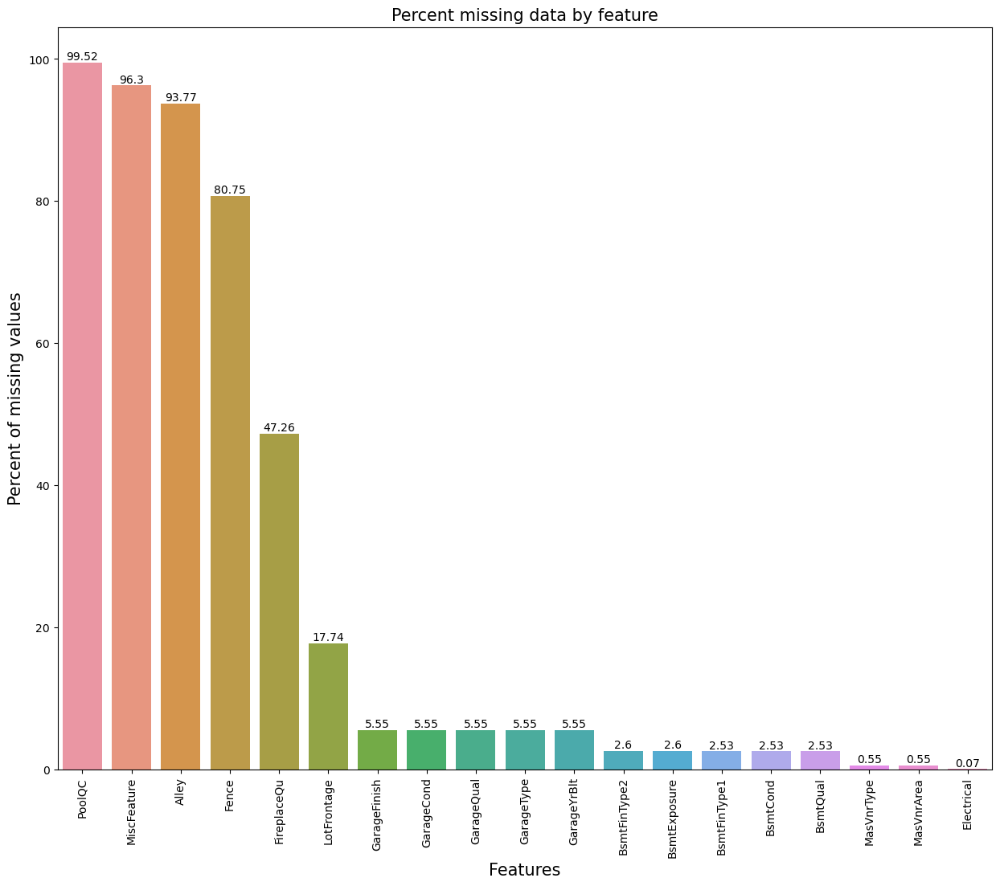

In [16]:
Percentage_Missing_Values(data_train, 10)

#### BAR-PLOTTING MISSING VALUES IN DATA_TEST

['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'LotFrontage']

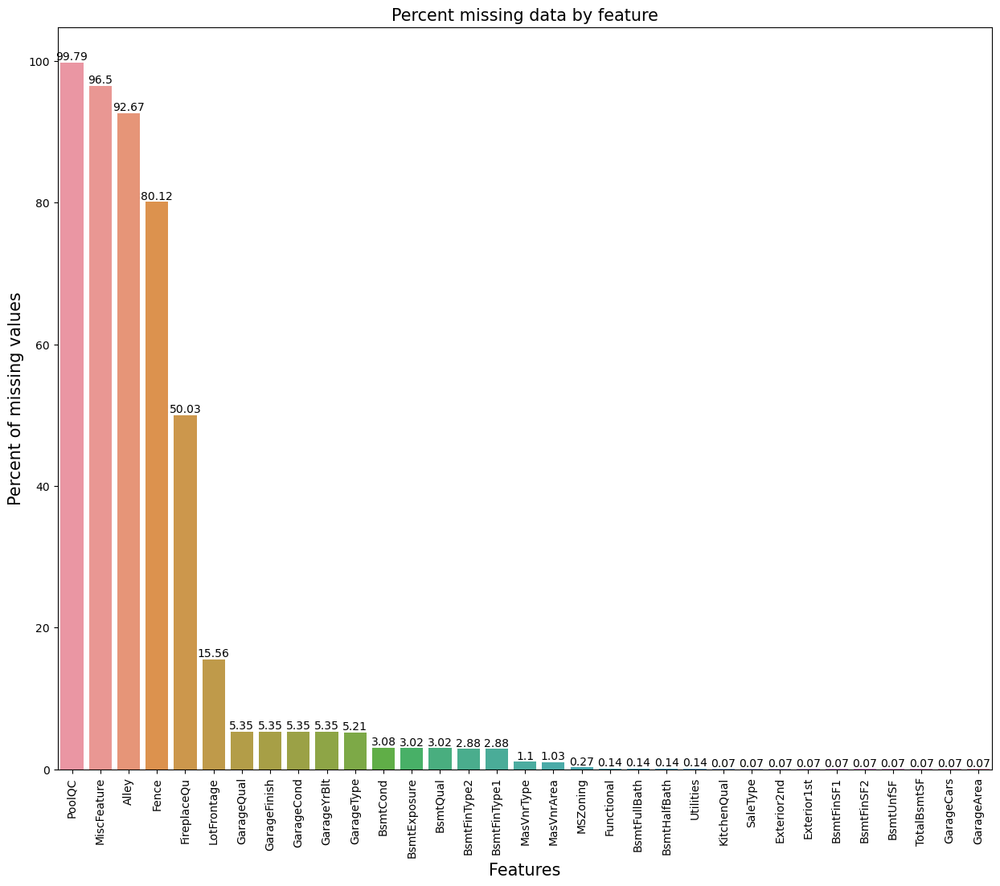

In [17]:
Percentage_Missing_Values(data_test, 10)

#### DELETING FEATURES FOR WHICH MISSING VALUES PERCENTAGE IS ABOVE DEFINED TRESHOLD

In [18]:
for data in dataset:
    del data['PoolQC']
    del data['MiscFeature']
    del data['Alley']
    del data['Fence']
    del data['FireplaceQu']
    del data['LotFrontage']

for original_data in original_dataset:
    del original_data['PoolQC']
    del original_data['MiscFeature']
    del original_data['Alley']
    del original_data['Fence']
    del original_data['FireplaceQu']
    del original_data['LotFrontage']

#### 2ND PLOT FOR DATA_TRAIN MISSING VALUES

[]

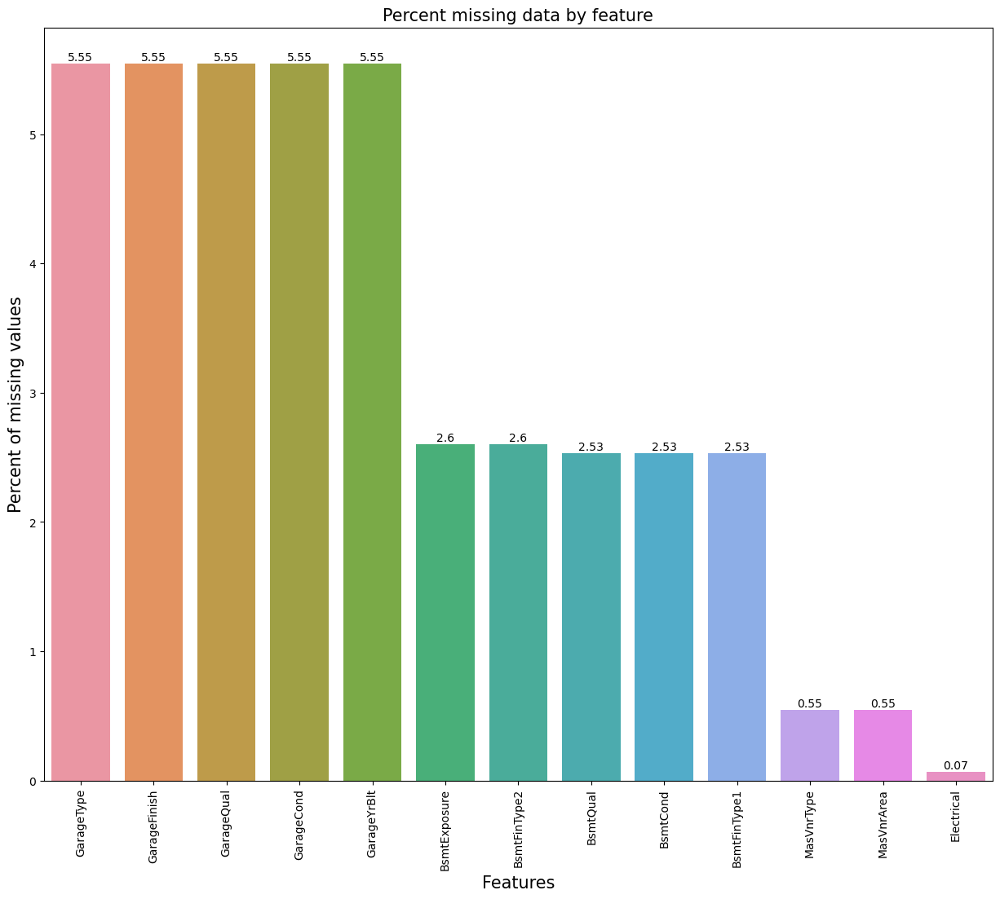

In [19]:
Percentage_Missing_Values(data_train, 10)

#### 2ND PLOT FOR DATA_TEST MISSING VALUES

[]

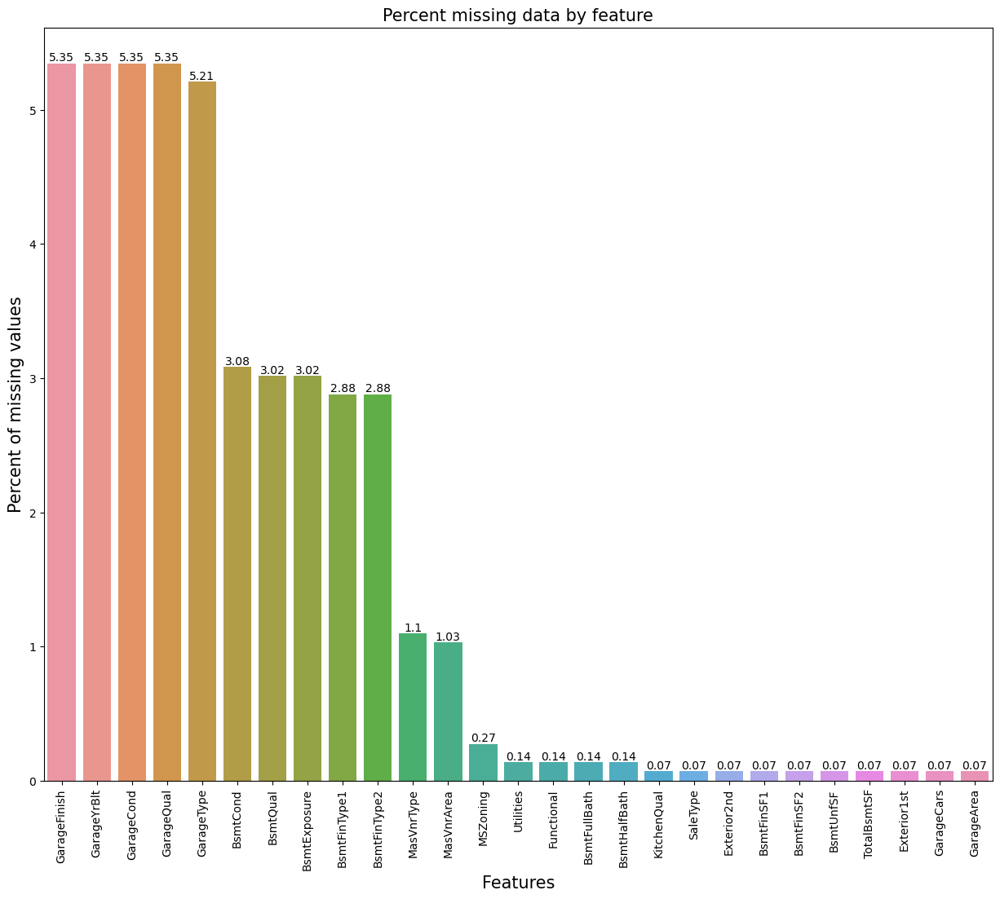

In [20]:
Percentage_Missing_Values(data_test, 10)

#### DEFINING DATA_TRAIN AND DATA_TEST AS FLOATS TO PERFORM MISSING VALUES IMPUTATION

In [21]:
data_train_float = data_train.astype(float)
data_test_float = data_test.astype(float)

#### APPLYING KNN IMPUTER ON DATASET

In [22]:
imputer = KNNImputer(n_neighbors=2)

data_train = pd.DataFrame(imputer.fit_transform(data_train_float), columns= data_train_float.columns)
data_test = pd.DataFrame(imputer.fit_transform(data_test_float), columns= data_test_float.columns)

dataset = [data_train, data_test]

####  CHECK FOR MISSING VALUES IN DATA_TRAIN AFTER IMPUTATION

In [23]:
Percentage_Missing_Values(data_train, 10)

No NAs found


####  CHECK FOR MISSING VALUES IN DATA_TEST AFTER IMPUTATION

In [24]:
Percentage_Missing_Values(data_test, 10)

No NAs found


#### CORRELATION PLOT OF ALL FEATURES

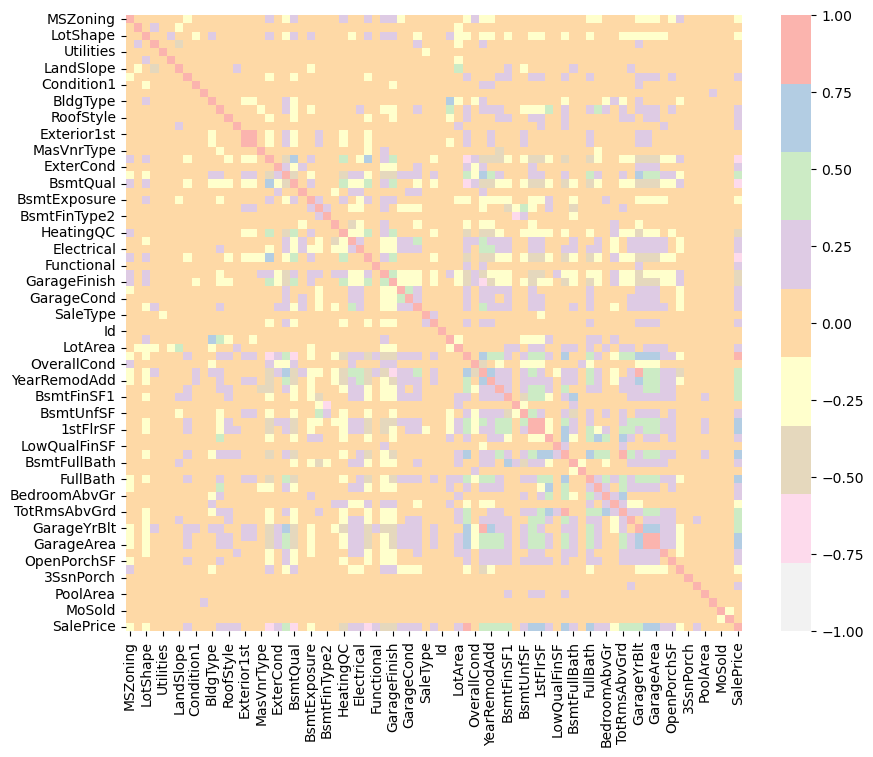

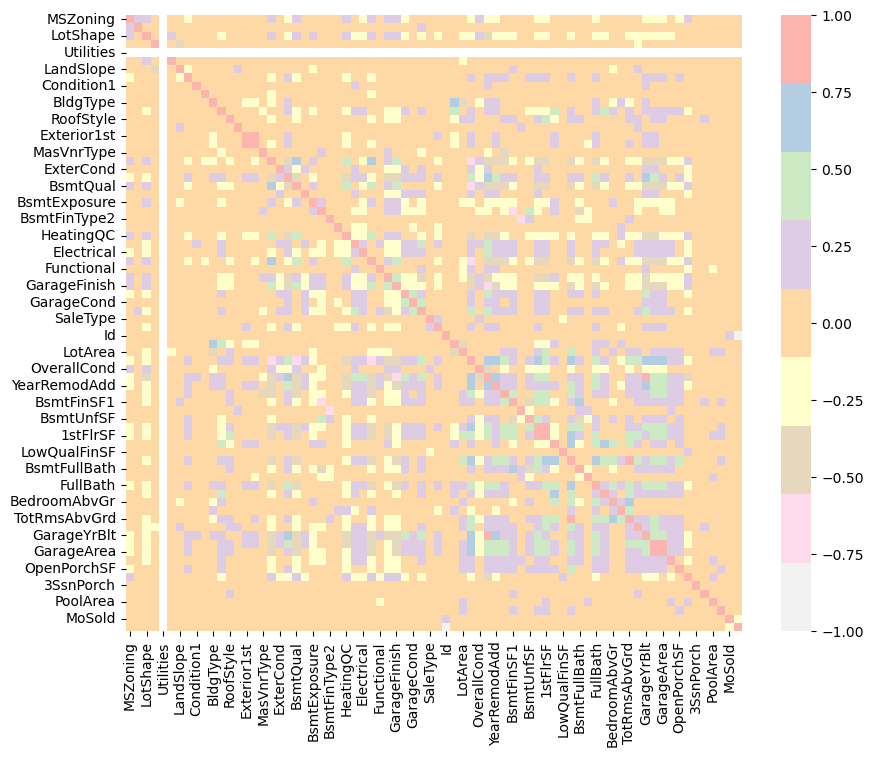

In [25]:
for data in dataset:
    f, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(data.corr(),
                cmap='Pastel1_r',
                #annot= True,
                #fmt='.1g',
                vmin=-1.0,
                vmax=1.0,
                square=True,
                ax=ax)

#### DEFINING FUNCTIONS TO CHECK FOR MULTICOLLINEARITY OF FEATURES IN DATASET

In [26]:
def corr_v1(df, cut) :
        
    # Get correlation matrix and upper triagle
    corr_mtx = df.corr().abs()
    avg_corr = corr_mtx.mean(axis = 1)
    up = corr_mtx.where(np.triu(np.ones(corr_mtx.shape), k=1).astype(bool))
    
    drop = []

        
    # For loop implements this pseudocode
    # For every cell in the upper triangle: 
        # If cell.value > 0.6: 
                # If mean(row_correlation) > mean(column_correlation):drop(column)
		# Else: drop(row)
    for row in range(len(up)-1):
        col_idx = row + 1
        for col in range (col_idx, len(up)):
            if(corr_mtx.iloc[row, col] > cut):
                if(avg_corr.iloc[row] > avg_corr.iloc[col]): 
                    drop.append(row)
                else: 
                    drop.append(col)
    
    drop_set = list(set(drop))
    # dropcols_idx = drop_set
    dropcols_names = list(df.columns[[item for item in drop_set]])
    
    return(dropcols_names)

def calcDrop(res):
    # All variables with correlation > cutoff
    all_corr_vars = list(set(res['v1'].tolist() + res['v2'].tolist()))
    
    # All unique variables in drop column
    poss_drop = list(set(res['drop'].tolist()))

    # Keep any variable not in drop column
    keep = list(set(all_corr_vars).difference(set(poss_drop)))
     
    # Drop any variables in same row as a keep variable
    p = res[ res['v1'].isin(keep)  | res['v2'].isin(keep) ][['v1', 'v2']]
    q = list(set(p['v1'].tolist() + p['v2'].tolist()))
    drop = (list(set(q).difference(set(keep))))

    # Remove drop variables from possible drop 
    poss_drop = list(set(poss_drop).difference(set(drop)))
    
    # subset res dataframe to include possible drop pairs
    m = res[ res['v1'].isin(poss_drop)  | res['v2'].isin(poss_drop) ][['v1', 'v2','drop']]
        
    # remove rows that are decided (drop), take set and add to drops
    more_drop = set(list(m[~m['v1'].isin(drop) & ~m['v2'].isin(drop)]['drop']))
    for item in more_drop:
        drop.append(item)
         
    return drop

def corr_v2(df, cut) :
       
    # Get correlation matrix and upper triagle
    corr_mtx = df.corr().abs()
    avg_corr = corr_mtx.mean(axis = 1)
    up = corr_mtx.where(np.triu(np.ones(corr_mtx.shape), k=1).astype(bool))
    
    dropcols = []
    
    res = pd.DataFrame(columns=(['v1', 'v2', 'v1.target', 
                                 'v2.target','corr', 'drop' ]))
    
    for row in range(len(up)-1):
        col_idx = row + 1
        for col in range (col_idx, len(up)):
            if(corr_mtx.iloc[row, col] > cut):
                if(avg_corr.iloc[row] > avg_corr.iloc[col]): 
                    dropcols.append(row)
                    drop = corr_mtx.columns[row]
                else: 
                    dropcols.append(col)
                    drop = corr_mtx.columns[col]
                
                s = pd.Series([ corr_mtx.index[row],
                up.columns[col],
                avg_corr[row],
                avg_corr[col],
                up.iloc[row,col],
                drop],
                index = res.columns)
        
                res = res.append(s, ignore_index = True)
    
    dropcols_names = calcDrop(res)
    
    return(dropcols_names)

#### PRINTING FEATURES WHICH CAUSES MULTICOLLINEARITY IN DATA_TRAIN

In [27]:
drop = corr_v1(data_train, 0.75)
print(drop)

drop_new = corr_v2(data_train, 0.75)
print(drop_new)
      
print(list(set(drop).difference(set(drop_new)))) 

['SalePrice', 'YearBuilt', 'Exterior1st', 'TotalBsmtSF', 'GrLivArea', 'GarageCars']
['GarageCars', 'Exterior1st', 'TotalBsmtSF', 'GrLivArea', 'YearBuilt', 'SalePrice']
[]


C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)
C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)
C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)
C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)
C:\Users\Krzysie

#### PRINTING FEATURES WHICH CAUSES MULTICOLLINEARITY IN DATA_TEST

In [28]:
drop = corr_v1(data_test, 0.75)
print(drop)

drop_new = corr_v2(data_test, 0.75)
print(drop_new)
      
print(list(set(drop).difference(set(drop_new))))      

['Id', 'YearBuilt', 'Exterior1st', 'TotalBsmtSF', 'GrLivArea', 'GarageCars']


C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)
C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)
C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)
C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)
C:\Users\Krzysie

['GarageCars', 'Exterior1st', 'TotalBsmtSF', 'GrLivArea', 'YearBuilt', 'Id']
[]


C:\Users\Krzysiek\AppData\Local\Temp\ipykernel_7552\1307838832.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res = res.append(s, ignore_index = True)


#### DELETING FEATURES WHICH CAUSES MULTICOLLINEARITY

In [29]:
for data in dataset:
    del data['Id']
    del data['YearBuilt'],
    del data['Exterior1st'],
    del data['TotalBsmtSF'],
    del data['GrLivArea'], 
    del data['GarageCars']

for original_data in original_dataset:
    del original_data['Id']
    del original_data['YearBuilt'],
    del original_data['Exterior1st'],
    del original_data['TotalBsmtSF'],
    del original_data['GrLivArea'], 
    del original_data['GarageCars']

#### PLOTTING CORRELATION MATRIX AFTER MULTICOLLINEAR-FEATURES REMOVAL

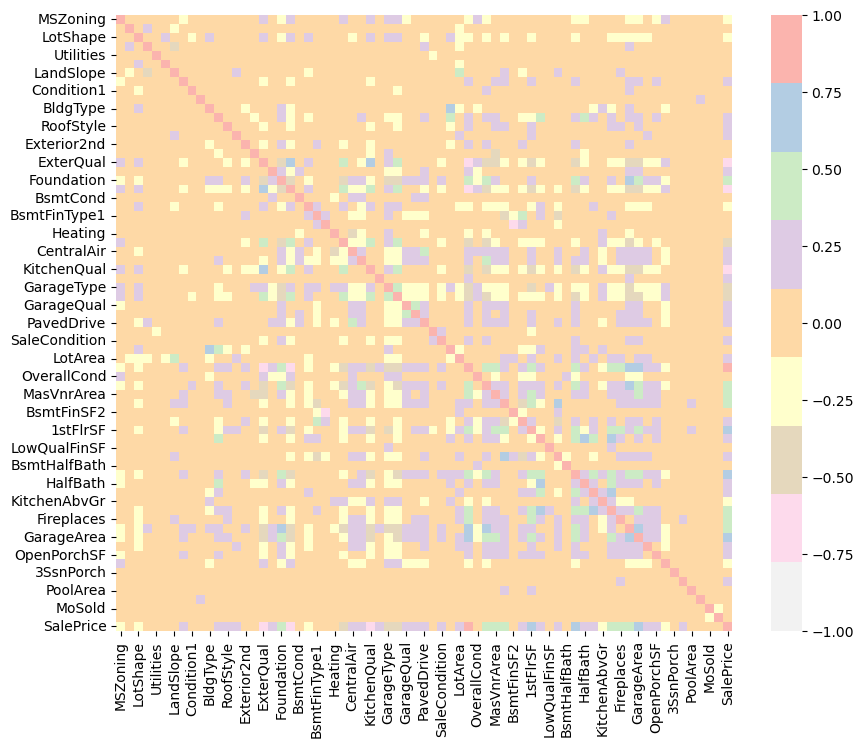

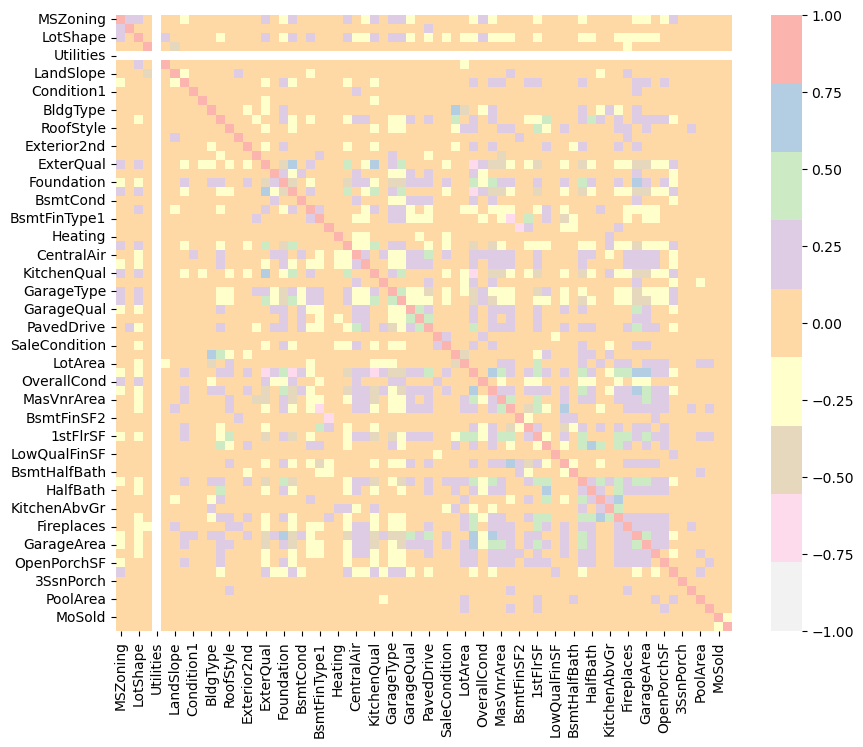

In [30]:
for data in dataset:
    f, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(data.corr(),
                cmap='Pastel1_r',
                #annot= True,
                #fmt='.1g',
                vmin=-1.0,
                vmax=1.0,
                square=True,
                ax=ax)

#### SKEWNESS CHECKING OF NUMERICAL DATA

In [31]:
original_numerical_features_train = original_data_train.dtypes[original_data_train.dtypes != 'object'].index
original_numerical_features_test = original_data_test.dtypes[original_data_test.dtypes != 'object'].index

skewed_feats1_train = data_train[original_numerical_features_train].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
skewed_feats1_test = data_test[original_numerical_features_test].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)

pd.DataFrame(skewed_feats1_train, columns = ['Skewness'])

,Skewness
MiscVal,24.451640
PoolArea,14.813135
LotArea,12.195142
3SsnPorch,10.293752
LowQualFinSF,9.002080
KitchenAbvGr,4.483784
BsmtFinSF2,4.250888
ScreenPorch,4.117977
BsmtHalfBath,4.099186
EnclosedPorch,3.086696


#### DEFINING SKEWNESS TRESHOLD

In [32]:
skewness_treshold = .25

#### DEFINING COLUMNS TO APPLY BOX-COX TRANSFORMATION

In [33]:
skewed_feats2_train = skewed_feats1_train[abs(skewed_feats1_train) > skewness_treshold].index
skewed_feats2_test = skewed_feats1_test[abs(skewed_feats1_test) > skewness_treshold].index

pd.DataFrame(skewed_feats2_train, columns = ['Features to Box-Cox transformation'])

,Features to Box-Cox transformation
0,MiscVal
1,PoolArea
2,LotArea
3,3SsnPorch
4,LowQualFinSF
5,KitchenAbvGr
6,BsmtFinSF2
7,ScreenPorch
8,BsmtHalfBath
9,EnclosedPorch


#### PERFORMING BOX-COX TRANSFORMATION FOR DATA SKEWED ABOVE DEFINED TRESHOLD

In [34]:
lam = 0.15

box_cox_transform_train = boxcox1p(data_train[skewed_feats2_train], lam)
box_cox_transform_test = boxcox1p(data_test[skewed_feats2_test], lam)

box_cox_transform_train

,MiscVal,PoolArea,LotArea,3SsnPorch,LowQualFinSF,KitchenAbvGr,BsmtFinSF2,ScreenPorch,BsmtHalfBath,EnclosedPorch,...,1stFlrSF,BsmtUnfSF,2ndFlrSF,OverallCond,TotRmsAbvGrd,HalfBath,Fireplaces,BsmtFullBath,YearRemodAdd,GarageYrBlt
0,0.000000,0.0,19.212182,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,11.692623,7.483296,11.686189,2.055642,2.602594,0.730463,0.000000,0.730463,14.187527,14.187527
1,0.000000,0.0,19.712205,0.0,0.0,0.730463,0.000000,0.0,0.730463,0.000000,...,12.792276,8.897844,0.000000,2.602594,2.259674,0.000000,0.730463,0.000000,14.145138,14.145138
2,0.000000,0.0,20.347241,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,11.892039,9.917060,11.724598,2.055642,2.259674,0.730463,0.730463,0.730463,14.185966,14.184404
3,0.000000,0.0,19.691553,0.0,0.0,0.730463,0.000000,0.0,0.000000,8.797736,...,12.013683,10.468500,11.354094,2.055642,2.440268,0.000000,0.730463,0.730463,14.135652,14.179714
4,0.000000,0.0,21.325160,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,12.510588,10.221051,12.271365,2.055642,2.750250,0.730463,0.730463,0.730463,14.182841,14.182841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.000000,0.0,18.960528,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,11.990298,11.990298,11.124583,2.055642,2.440268,0.730463,0.730463,0.000000,14.182841,14.181278
1456,0.000000,0.0,20.994868,0.0,0.0,0.730463,7.659675,0.0,0.000000,0.000000,...,14.295205,10.692807,0.000000,2.259674,2.440268,0.000000,1.194318,0.730463,14.164038,14.148295
1457,14.892193,0.0,19.476345,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,12.616840,11.759412,12.528113,2.750250,2.750250,0.000000,1.194318,0.000000,14.192207,14.089451
1458,0.000000,0.0,19.760176,0.0,0.0,0.730463,12.206046,0.0,0.000000,6.881187,...,12.338074,0.000000,0.000000,2.259674,2.055642,0.000000,0.000000,0.730463,14.176584,14.103852


#### DEFINING ISOLATION FOREST MODEL TO CHECK FOR OUTLIERS

In [35]:
outlier1 = IsolationForest(n_estimators=100, max_samples=256, contamination=0.2)
outlier2 = outlier1.fit_predict(box_cox_transform_train.to_numpy())

print("Number of outliers detected: {}".format(-outlier2[outlier2 < 0].sum()))
print("Number of normal samples detected: {}".format(outlier2[outlier2 > 0].sum()))

Number of outliers detected: 292
Number of normal samples detected: 1168


#### CREATING DATAFRAME WITH OUTLIERS

In [36]:
outlier = pd.DataFrame(outlier2)

#### JOINING OUTLIERS COLUMN WITH DATA_TRAIN DATAFRAME

In [37]:
data_train = pd.concat([data_train, outlier.rename(columns={outlier.columns[0]: 'Outlier'})], axis=1)

#### RE-DEFINING DATASET

In [38]:
dataset = [data_train, data_test]

#### DEFINING PIECE OF DATA BEFORE BOX-COX TRANSFORMATION FOR PLOTTING PURPOSES

In [39]:
data_train_before_box_cox = data_train[skewed_feats2_train]
data_test_before_box_cox = data_test[skewed_feats2_test]

data_train_before_box_cox

,MiscVal,PoolArea,LotArea,3SsnPorch,LowQualFinSF,KitchenAbvGr,BsmtFinSF2,ScreenPorch,BsmtHalfBath,EnclosedPorch,...,1stFlrSF,BsmtUnfSF,2ndFlrSF,OverallCond,TotRmsAbvGrd,HalfBath,Fireplaces,BsmtFullBath,YearRemodAdd,GarageYrBlt
0,0.0,0.0,8450.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,856.0,150.0,854.0,5.0,8.0,1.0,0.0,1.0,2003.0,2003.0
1,0.0,0.0,9600.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1262.0,284.0,0.0,8.0,6.0,0.0,1.0,0.0,1976.0,1976.0
2,0.0,0.0,11250.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,920.0,434.0,866.0,5.0,6.0,1.0,1.0,1.0,2002.0,2001.0
3,0.0,0.0,9550.0,0.0,0.0,1.0,0.0,0.0,0.0,272.0,...,961.0,540.0,756.0,5.0,7.0,0.0,1.0,1.0,1970.0,1998.0
4,0.0,0.0,14260.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1145.0,490.0,1053.0,5.0,9.0,1.0,1.0,1.0,2000.0,2000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.0,0.0,7917.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,953.0,953.0,694.0,5.0,7.0,1.0,1.0,0.0,2000.0,1999.0
1456,0.0,0.0,13175.0,0.0,0.0,1.0,163.0,0.0,0.0,0.0,...,2073.0,589.0,0.0,6.0,7.0,0.0,2.0,1.0,1988.0,1978.0
1457,2500.0,0.0,9042.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1188.0,877.0,1152.0,9.0,9.0,0.0,2.0,0.0,2006.0,1941.0
1458,0.0,0.0,9717.0,0.0,0.0,1.0,1029.0,0.0,0.0,112.0,...,1078.0,0.0,0.0,6.0,5.0,0.0,0.0,1.0,1996.0,1950.0


#### DELETING PIECE OF DATA WHICH HAS BEEN BOX-COX TRANSFORMED

In [40]:
data_train = data_train.drop(data_train[box_cox_transform_train.columns], axis=1)
data_test = data_test.drop(data_test[box_cox_transform_test.columns], axis=1)

data_train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,PavedDrive,SaleType,SaleCondition,OverallQual,FullBath,BedroomAbvGr,GarageArea,MoSold,YrSold,Outlier
0,3.0,1.0,3.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,...,2.0,8.0,4.0,7.0,2.0,3.0,548.0,2.0,2008.0,1
1,3.0,1.0,3.0,3.0,0.0,2.0,0.0,24.0,1.0,2.0,...,2.0,8.0,4.0,6.0,2.0,3.0,460.0,5.0,2007.0,1
2,3.0,1.0,0.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,...,2.0,8.0,4.0,7.0,2.0,3.0,608.0,9.0,2008.0,1
3,3.0,1.0,0.0,3.0,0.0,0.0,0.0,6.0,2.0,2.0,...,2.0,8.0,0.0,7.0,1.0,3.0,642.0,2.0,2006.0,1
4,3.0,1.0,0.0,3.0,0.0,2.0,0.0,15.0,2.0,2.0,...,2.0,8.0,4.0,8.0,2.0,4.0,836.0,12.0,2008.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,3.0,1.0,3.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,...,2.0,8.0,4.0,6.0,2.0,3.0,460.0,8.0,2007.0,1
1456,3.0,1.0,3.0,3.0,0.0,4.0,0.0,14.0,2.0,2.0,...,2.0,8.0,4.0,6.0,2.0,3.0,500.0,2.0,2010.0,1
1457,3.0,1.0,3.0,3.0,0.0,4.0,0.0,6.0,2.0,2.0,...,2.0,8.0,4.0,7.0,2.0,4.0,252.0,5.0,2010.0,-1
1458,3.0,1.0,3.0,3.0,0.0,4.0,0.0,12.0,2.0,2.0,...,2.0,8.0,4.0,5.0,1.0,2.0,240.0,4.0,2010.0,-1


#### JOINING BOX-COX TRANSFEROMED DATA WITH REMAINING DATA_TRAIN AND DATA_TEST DATAFRAMES, RE-DEFINING DATASET

In [41]:
data_train = pd.concat([box_cox_transform_train, data_train], axis=1)
data_test = pd.concat([box_cox_transform_test, data_test], axis=1)

dataset = [data_train, data_test]

data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 70 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MiscVal        1460 non-null   float64
 1   PoolArea       1460 non-null   float64
 2   LotArea        1460 non-null   float64
 3   3SsnPorch      1460 non-null   float64
 4   LowQualFinSF   1460 non-null   float64
 5   KitchenAbvGr   1460 non-null   float64
 6   BsmtFinSF2     1460 non-null   float64
 7   ScreenPorch    1460 non-null   float64
 8   BsmtHalfBath   1460 non-null   float64
 9   EnclosedPorch  1460 non-null   float64
 10  MasVnrArea     1460 non-null   float64
 11  OpenPorchSF    1460 non-null   float64
 12  SalePrice      1460 non-null   float64
 13  BsmtFinSF1     1460 non-null   float64
 14  WoodDeckSF     1460 non-null   float64
 15  MSSubClass     1460 non-null   float64
 16  1stFlrSF       1460 non-null   float64
 17  BsmtUnfSF      1460 non-null   float64
 18  2ndFlrSF

#### FILTERING DATA WHICH HAS BEEN IDENTIFIED AS OUTLIERS

In [42]:
normal_data = data_train[data_train['Outlier'].values > 0]
outliers = data_train[data_train['Outlier'].values < 0]

normal_data

,MiscVal,PoolArea,LotArea,3SsnPorch,LowQualFinSF,KitchenAbvGr,BsmtFinSF2,ScreenPorch,BsmtHalfBath,EnclosedPorch,...,PavedDrive,SaleType,SaleCondition,OverallQual,FullBath,BedroomAbvGr,GarageArea,MoSold,YrSold,Outlier
0,0.0,0.0,19.212182,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,2.0,8.0,4.0,7.0,2.0,3.0,548.0,2.0,2008.0,1
1,0.0,0.0,19.712205,0.0,0.0,0.730463,0.000000,0.0,0.730463,0.000000,...,2.0,8.0,4.0,6.0,2.0,3.0,460.0,5.0,2007.0,1
2,0.0,0.0,20.347241,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,2.0,8.0,4.0,7.0,2.0,3.0,608.0,9.0,2008.0,1
3,0.0,0.0,19.691553,0.0,0.0,0.730463,0.000000,0.0,0.000000,8.797736,...,2.0,8.0,0.0,7.0,1.0,3.0,642.0,2.0,2006.0,1
4,0.0,0.0,21.325160,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,2.0,8.0,4.0,8.0,2.0,4.0,836.0,12.0,2008.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,0.0,0.0,22.127608,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,2.0,8.0,0.0,5.0,1.0,3.0,0.0,7.0,2006.0,1
1454,0.0,0.0,18.753396,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,2.0,8.0,4.0,7.0,2.0,2.0,400.0,10.0,2009.0,1
1455,0.0,0.0,18.960528,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,2.0,8.0,4.0,6.0,2.0,3.0,460.0,8.0,2007.0,1
1456,0.0,0.0,20.994868,0.0,0.0,0.730463,7.659675,0.0,0.000000,0.000000,...,2.0,8.0,4.0,6.0,2.0,3.0,500.0,2.0,2010.0,1


#### SCATTER-PLOTTING OUTLIERS AND NORMAL DATA FOR ALL FEATURES IN RELATION TO SALE_PRICE FEATURE

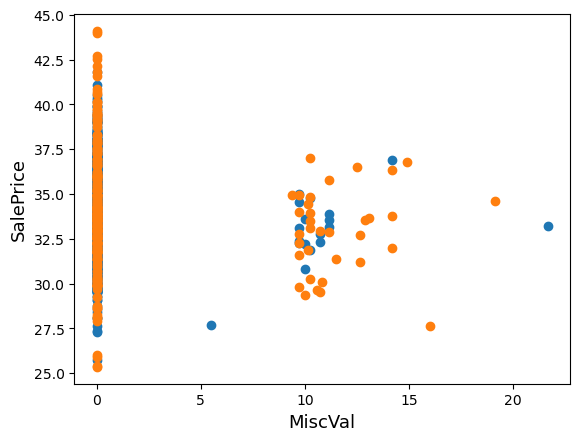

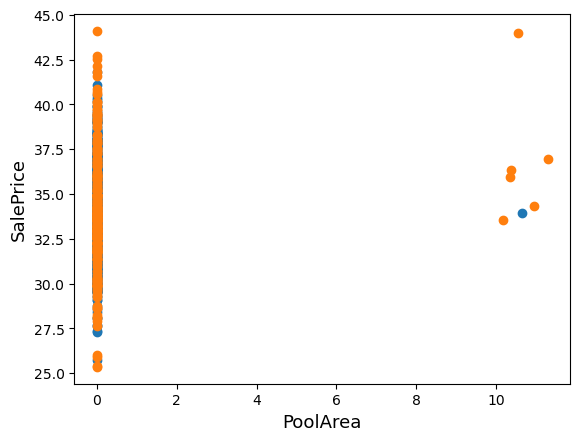

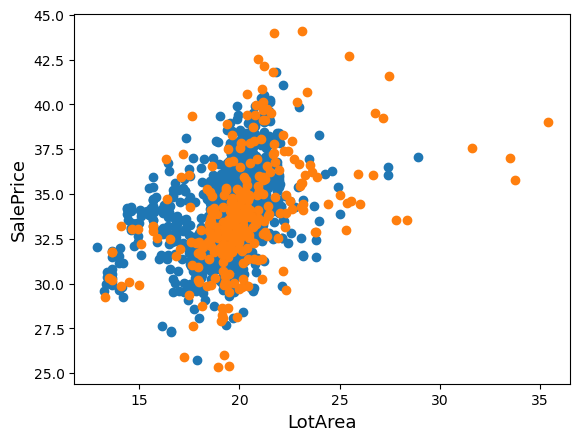

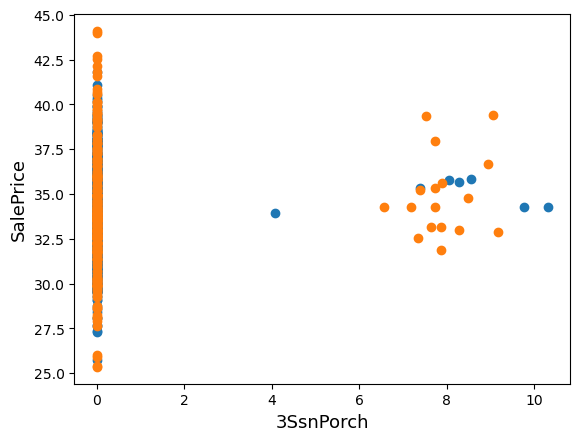

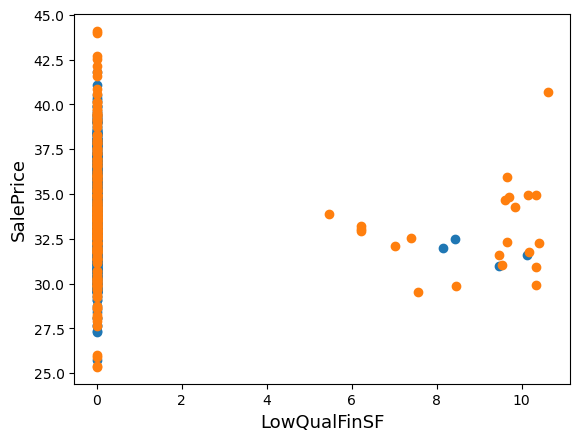

...

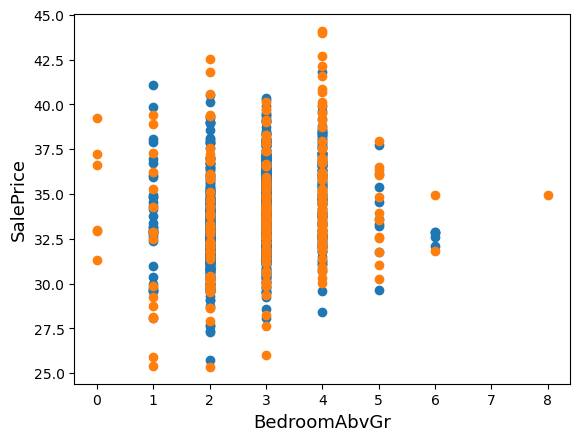

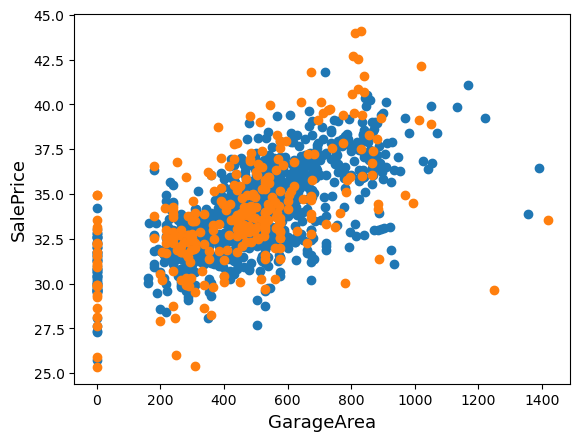

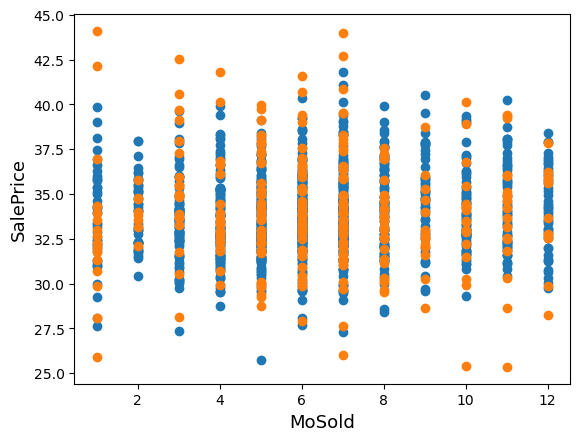

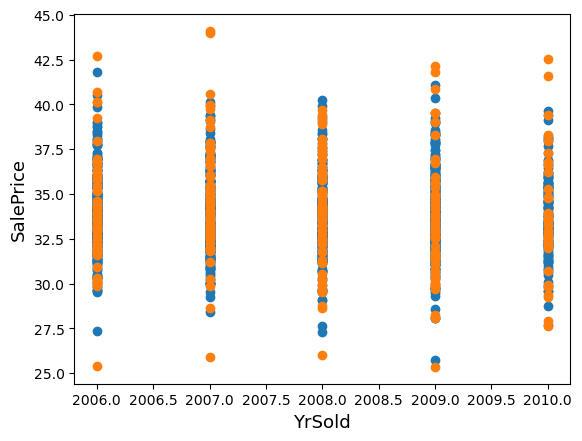

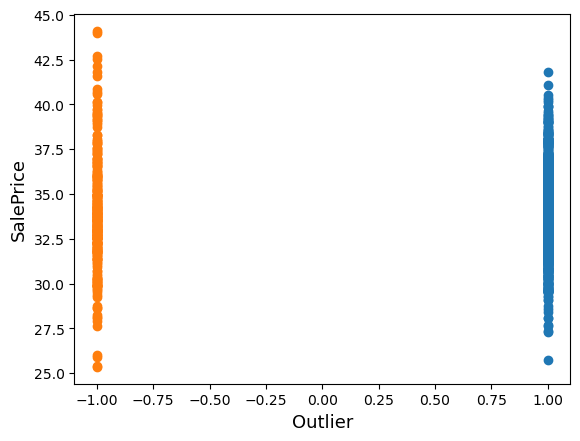

In [43]:
for i, col in enumerate(data_train.columns):
    plt.figure(i)
    plt.scatter(normal_data[col], normal_data['SalePrice'])
    plt.scatter(outliers[col], outliers['SalePrice'])
    plt.ylabel('SalePrice', fontsize=13)
    plt.xlabel('{}'.format(data_train.columns[i]), fontsize=13)
    plt.show()

#### PLOTTING DISTRIBUTION OF FEATURES AND QQ GRAPH BEFORE AND AFTER BOX-COX TRANSFORMATION FOR TRAINING DATA WITH REMOVED OUTLIERS

<Figure size 640x480 with 0 Axes>

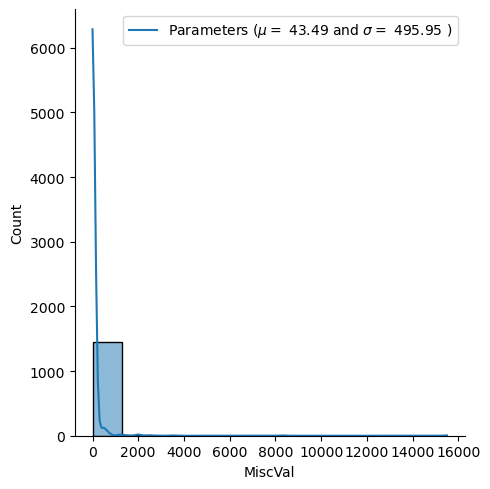

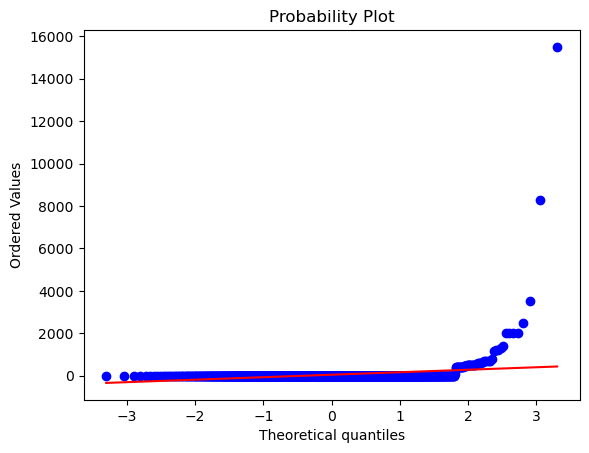

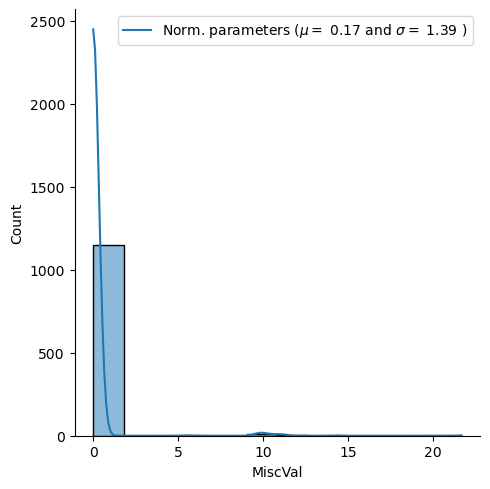

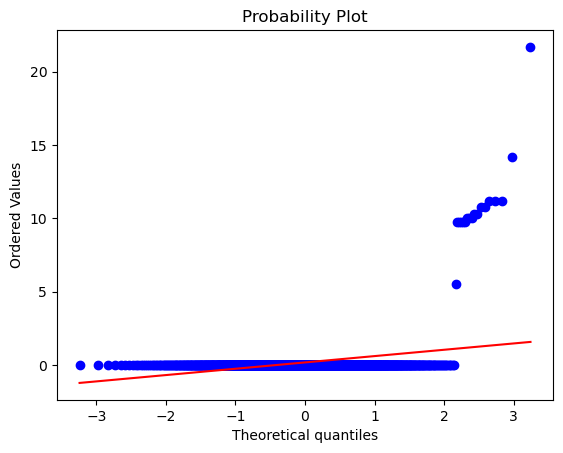

<Figure size 640x480 with 0 Axes>

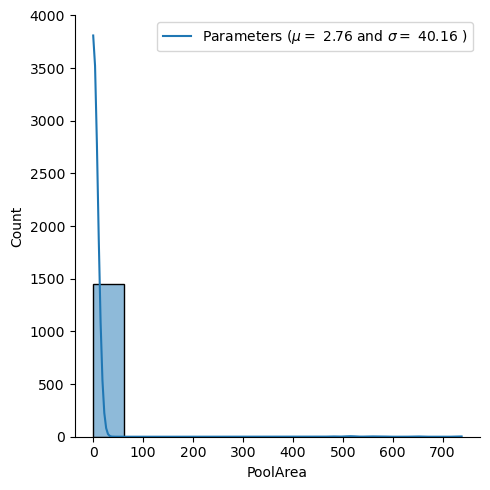

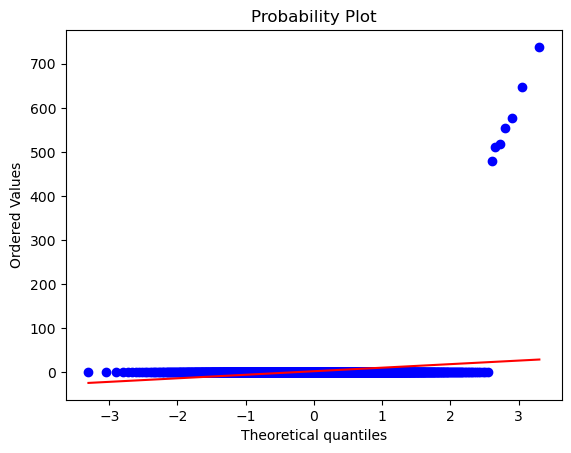

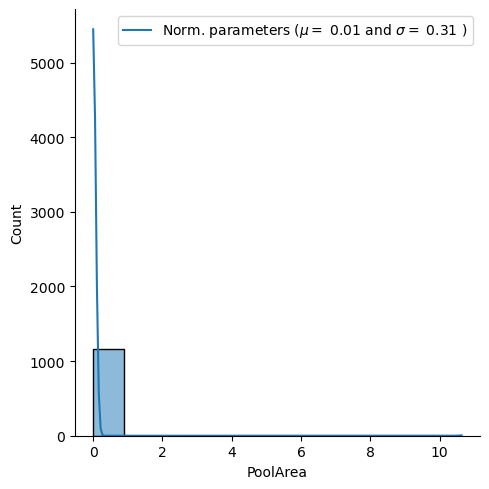

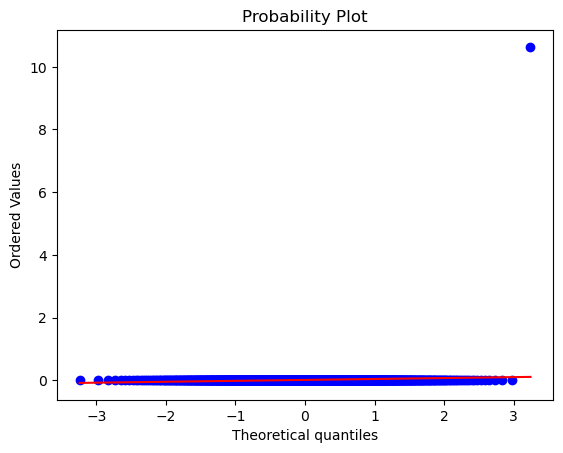

<Figure size 640x480 with 0 Axes>

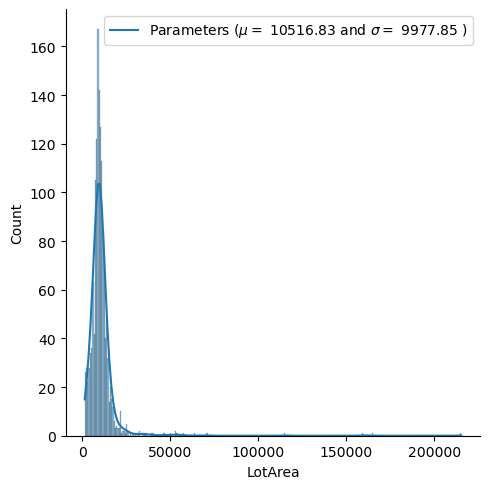

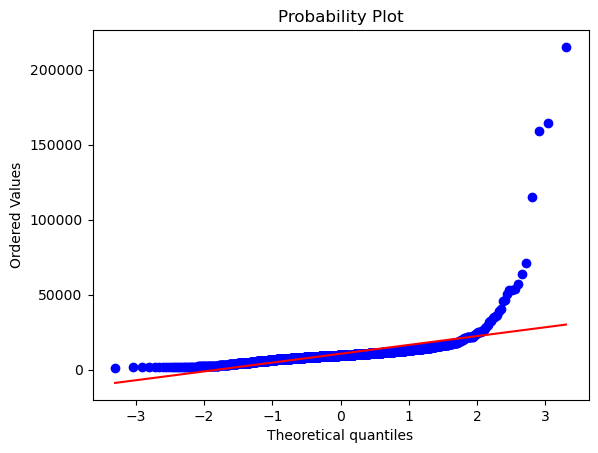

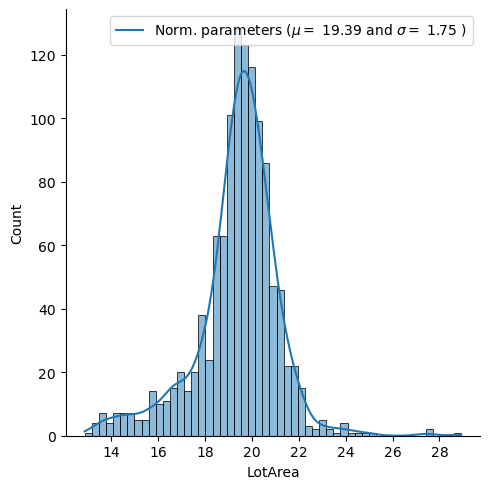

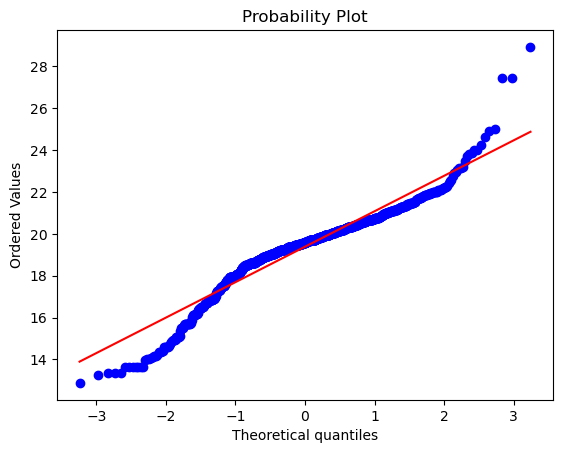

<Figure size 640x480 with 0 Axes>

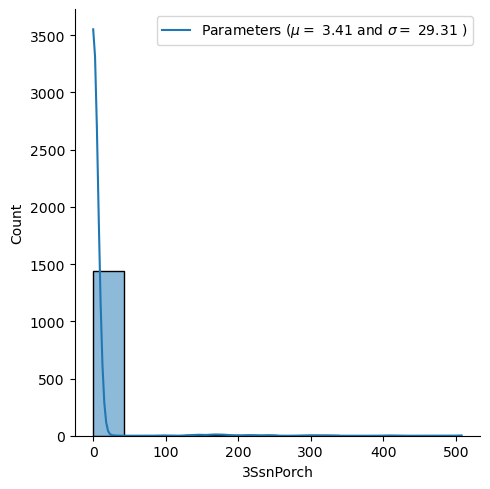

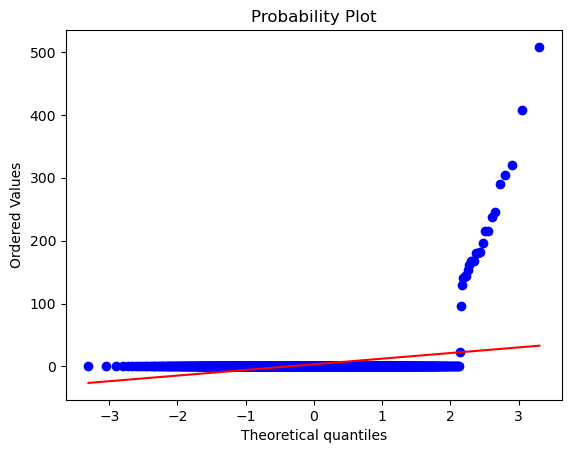

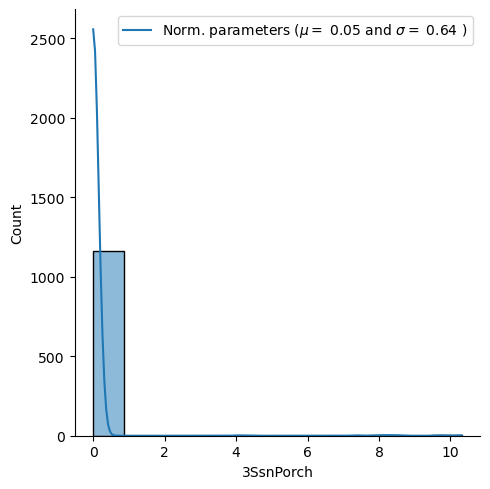

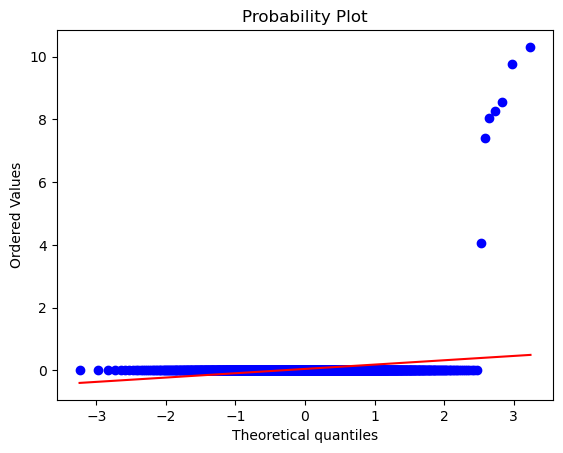

<Figure size 640x480 with 0 Axes>

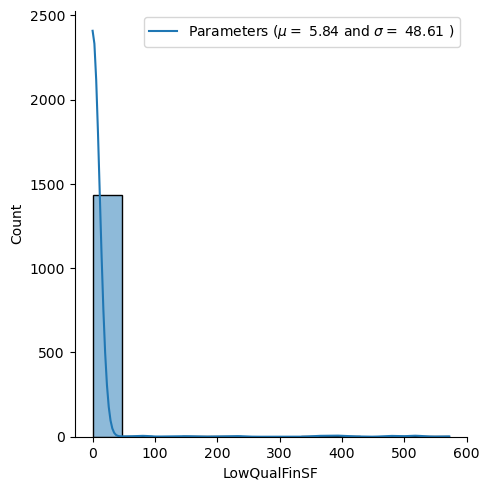

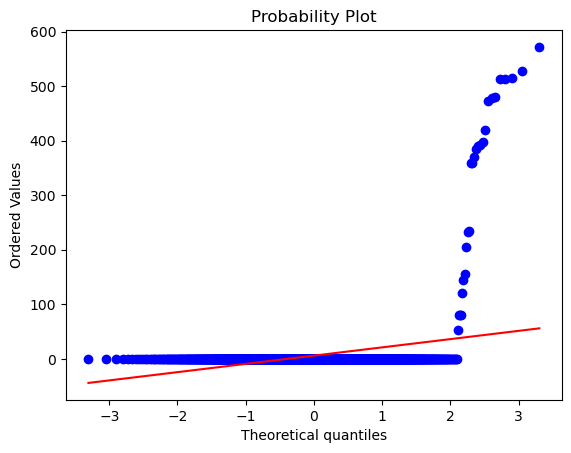

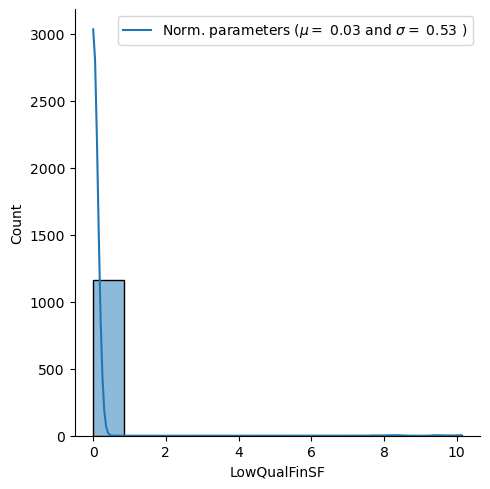

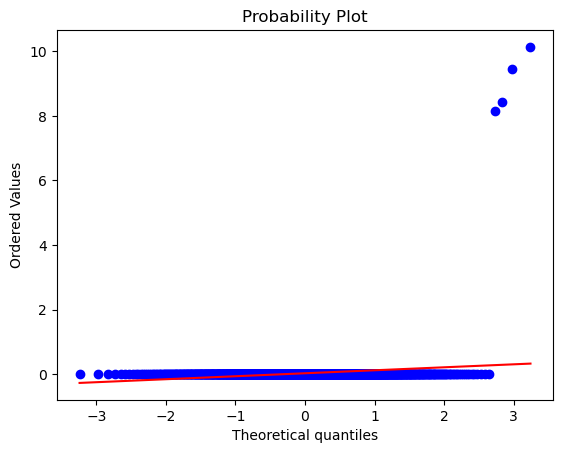

<Figure size 640x480 with 0 Axes>

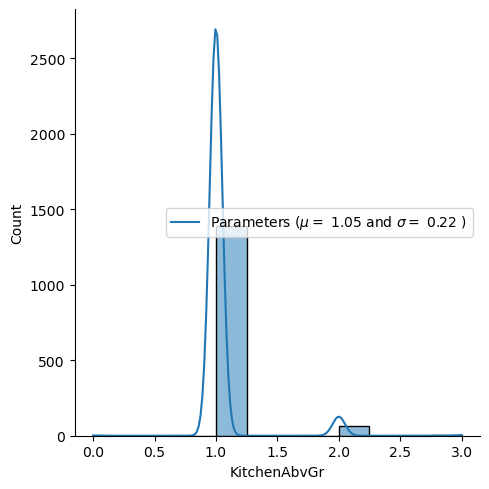

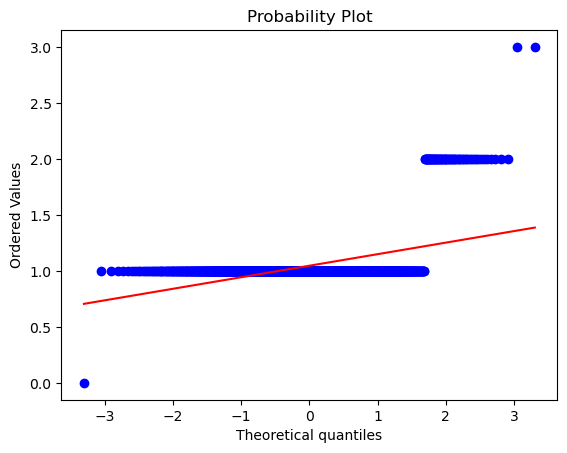

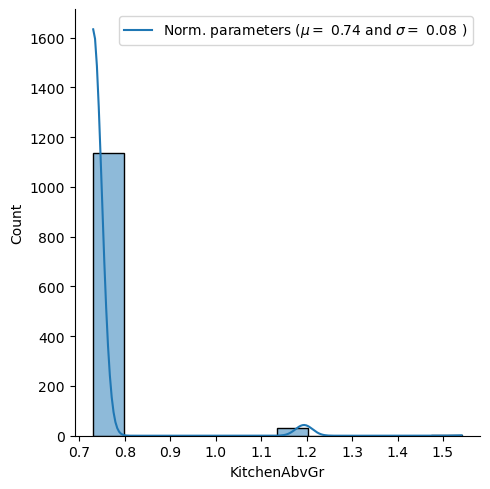

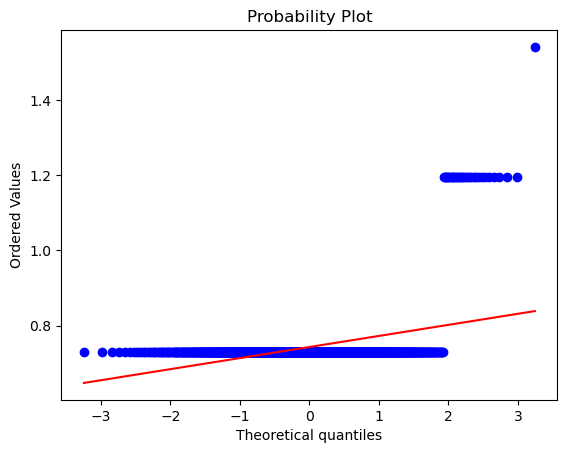

<Figure size 640x480 with 0 Axes>

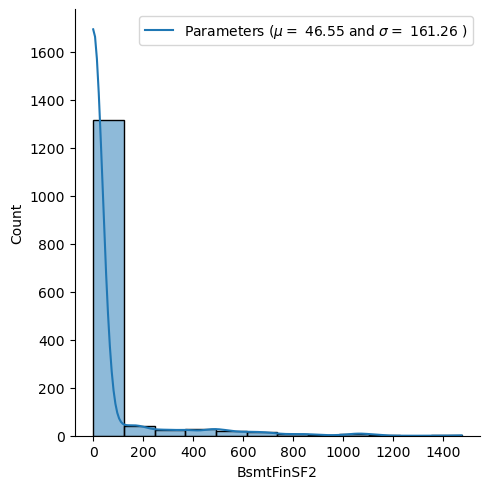

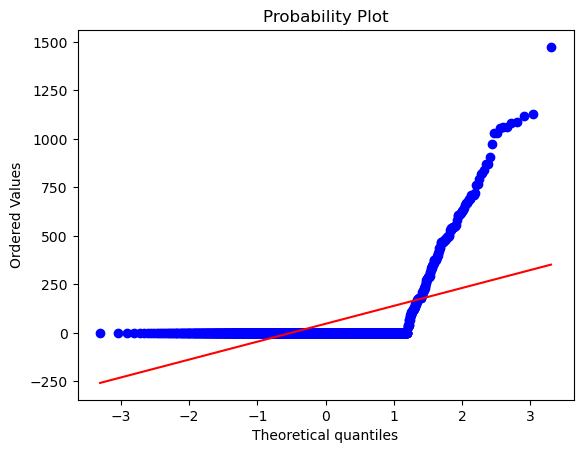

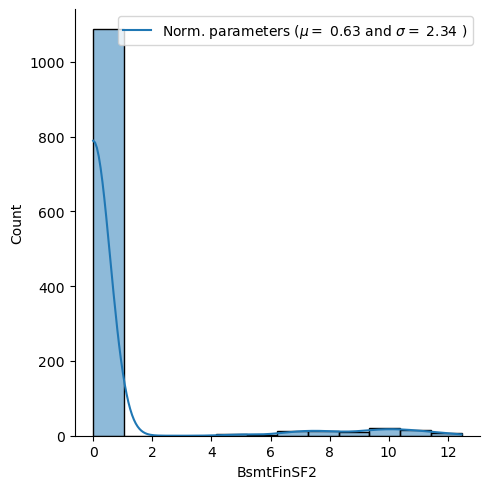

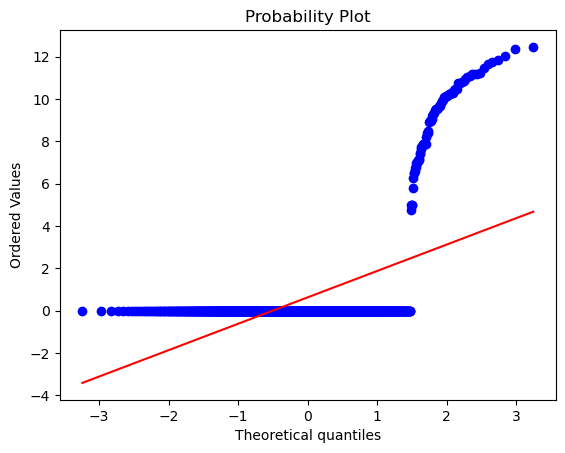

<Figure size 640x480 with 0 Axes>

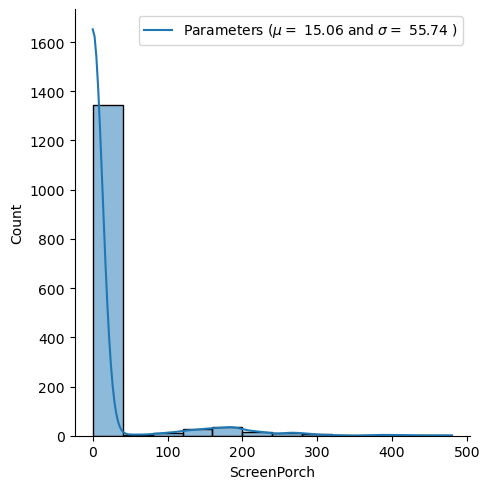

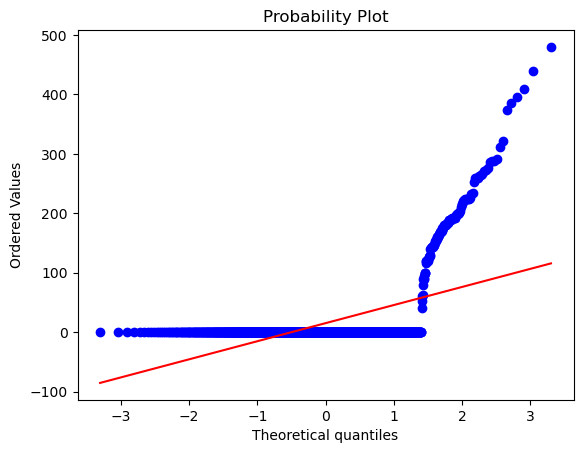

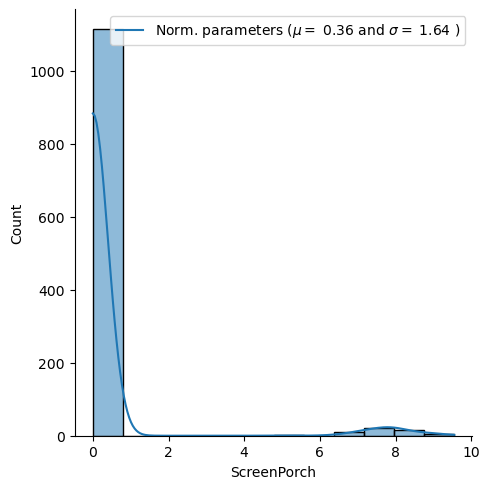

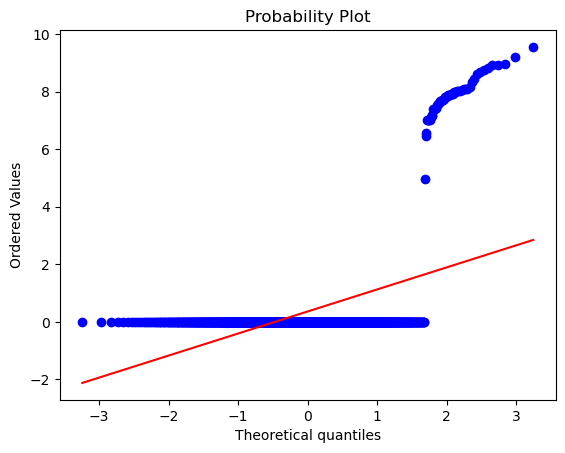

<Figure size 640x480 with 0 Axes>

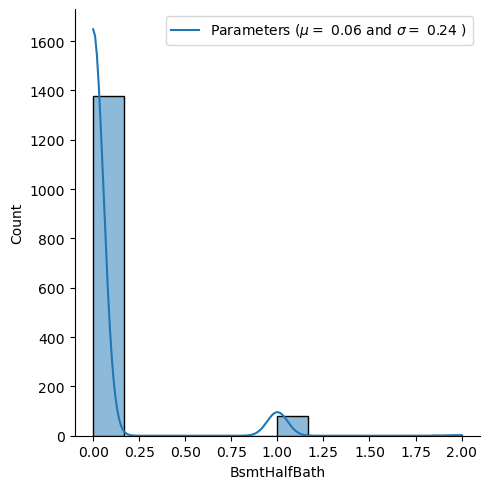

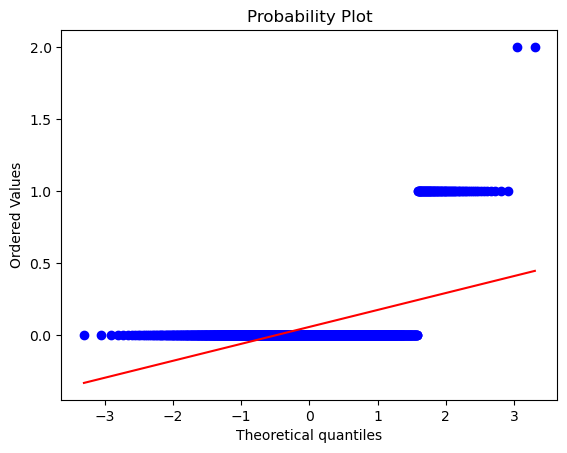

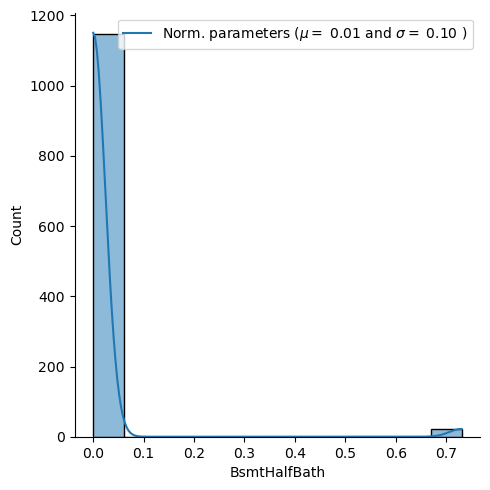

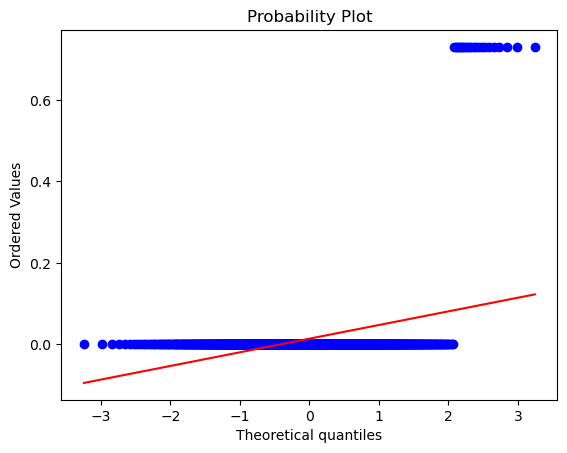

<Figure size 640x480 with 0 Axes>

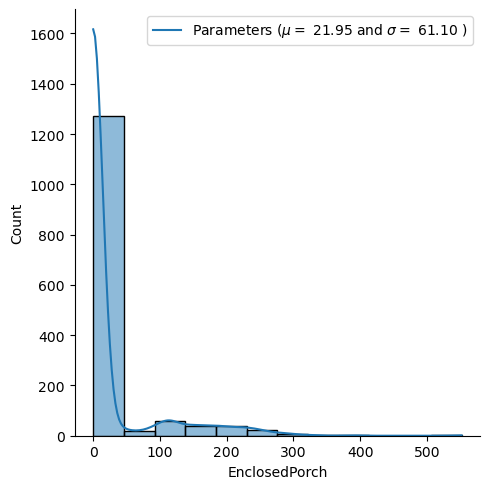

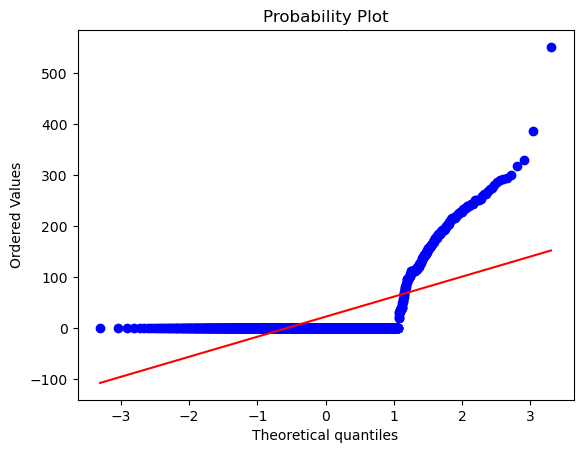

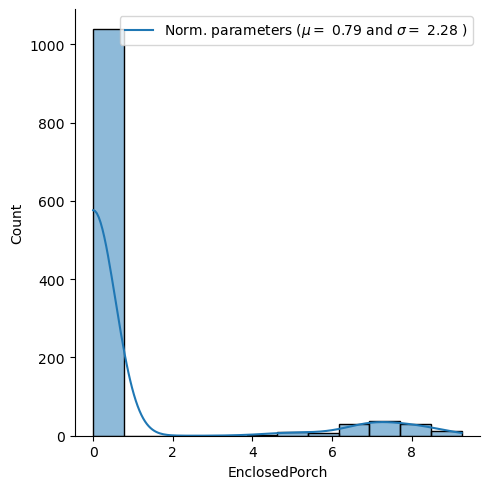

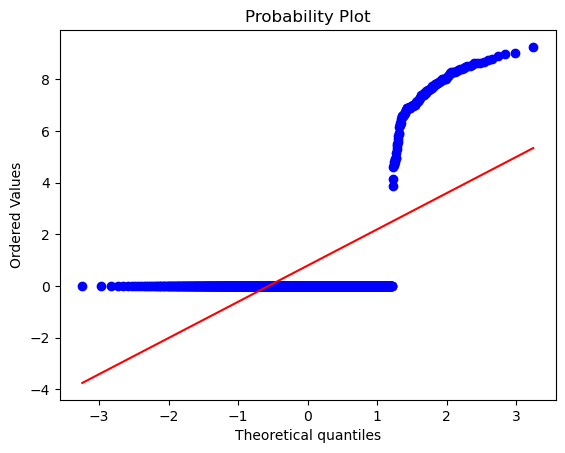

<Figure size 640x480 with 0 Axes>

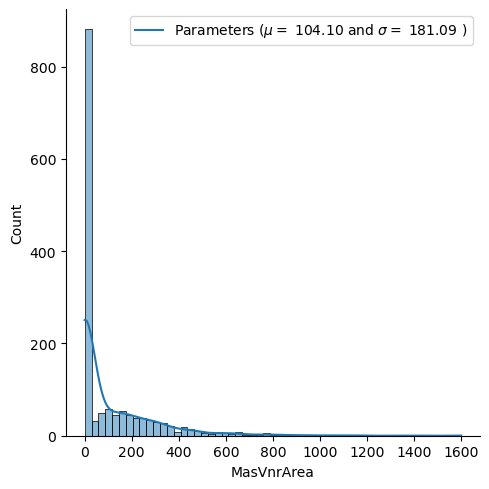

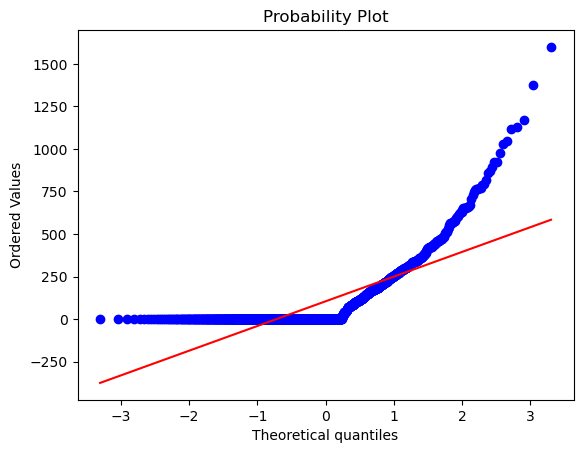

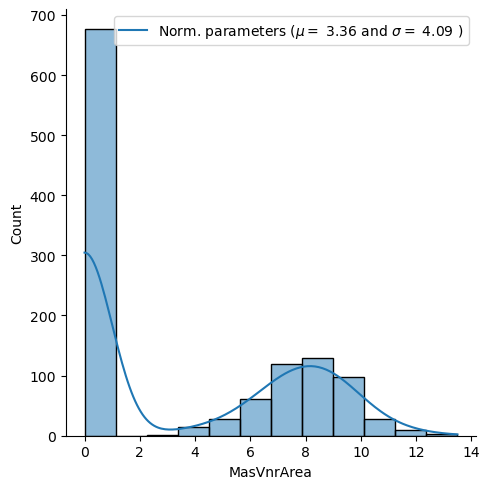

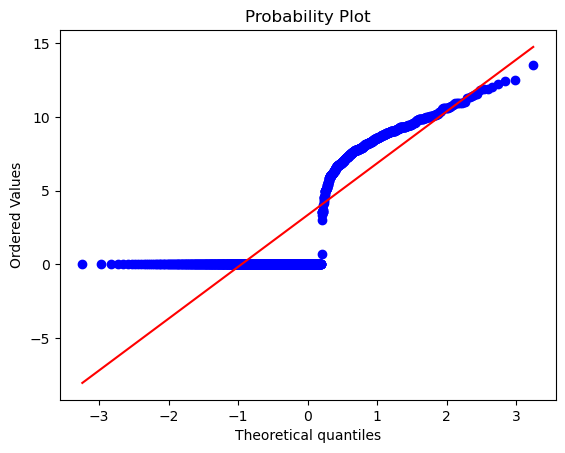

<Figure size 640x480 with 0 Axes>

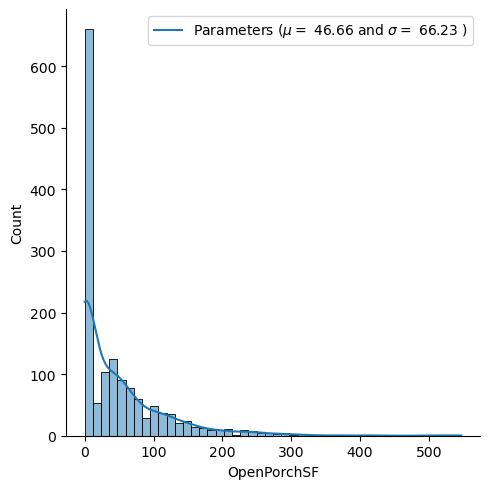

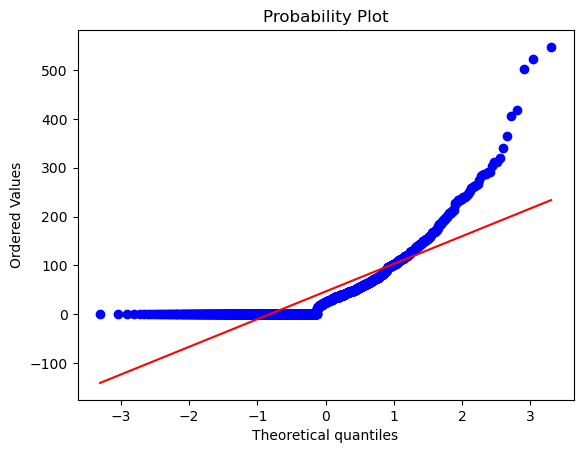

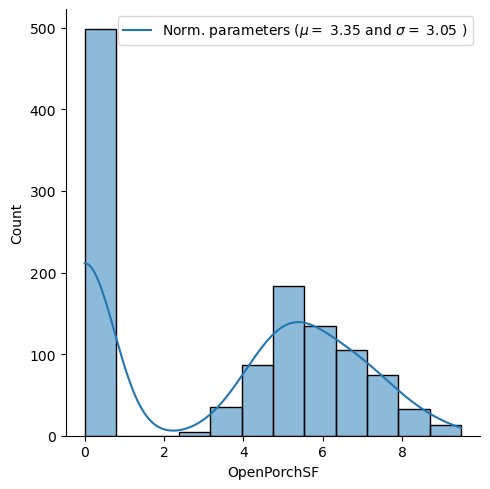

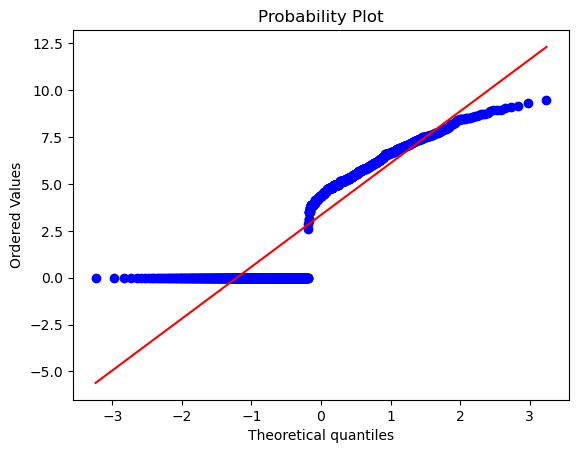

<Figure size 640x480 with 0 Axes>

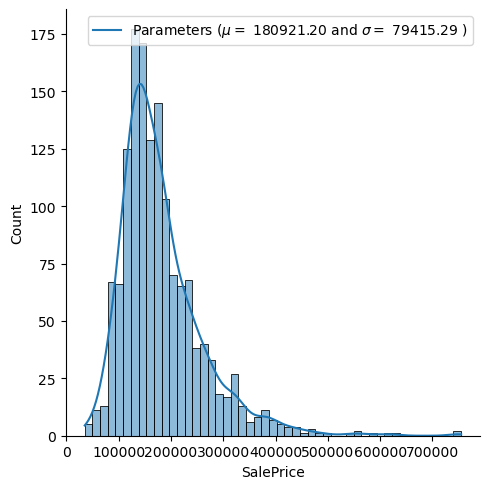

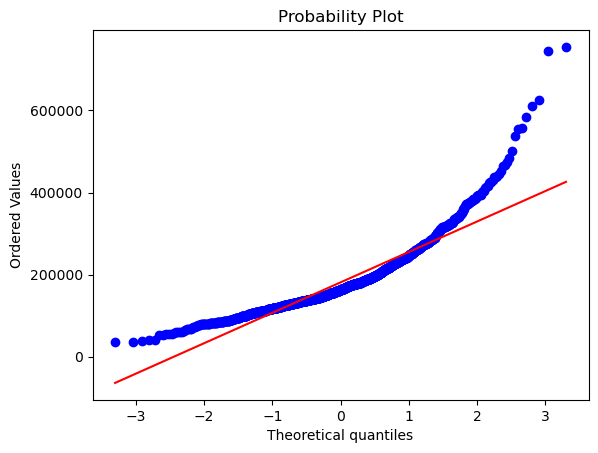

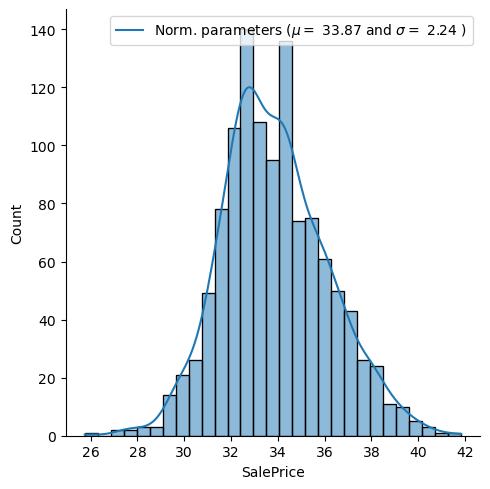

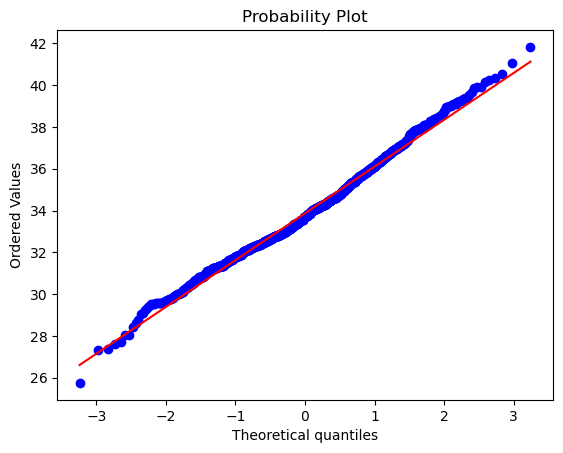

<Figure size 640x480 with 0 Axes>

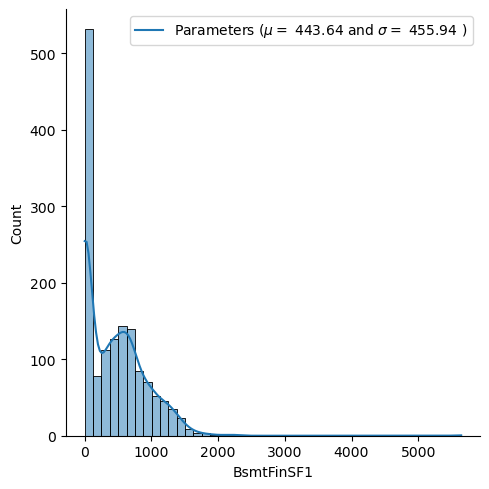

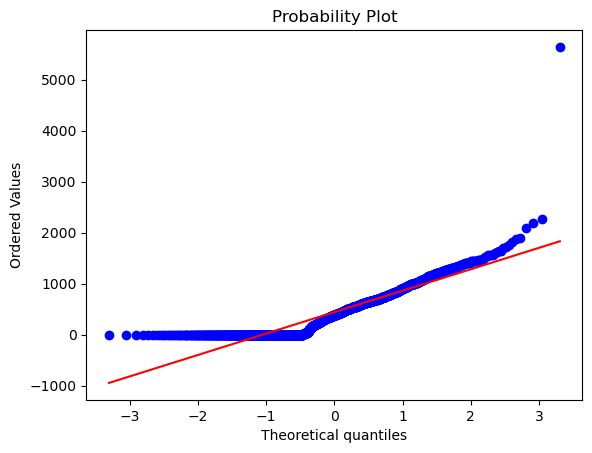

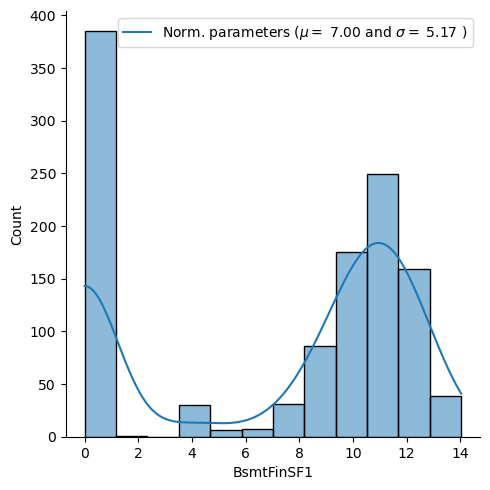

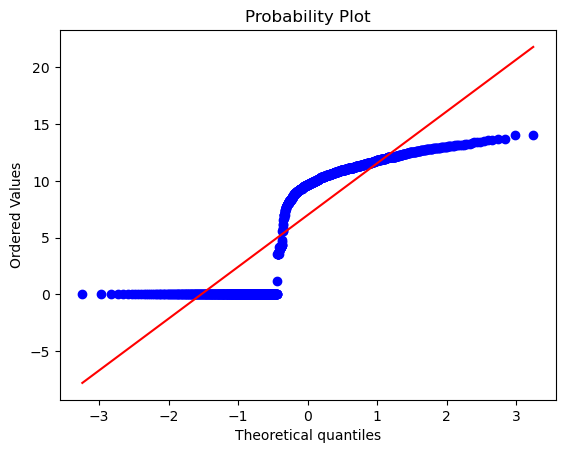

<Figure size 640x480 with 0 Axes>

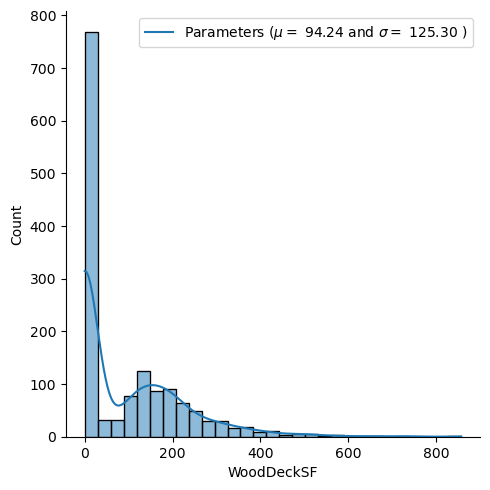

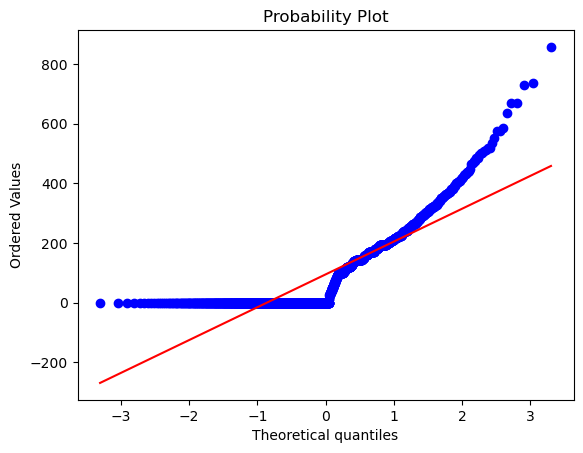

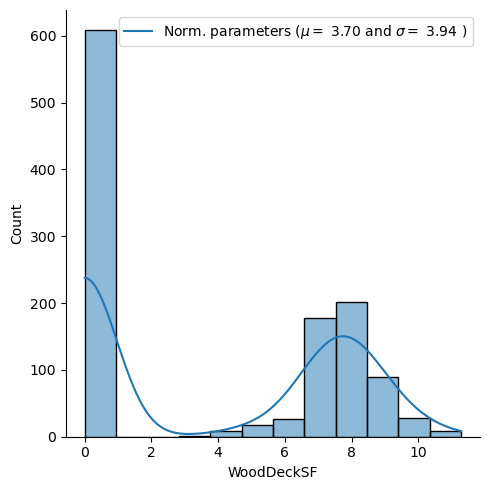

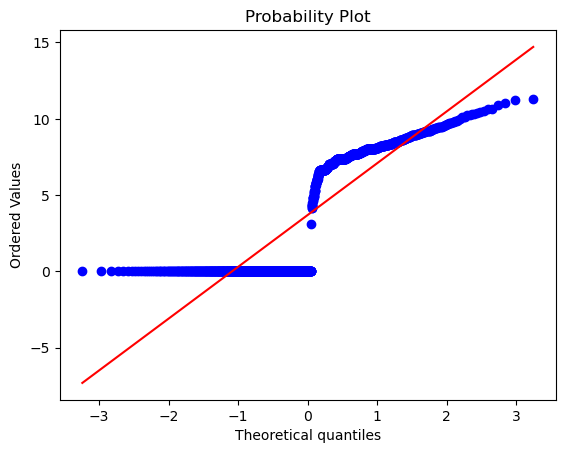

<Figure size 640x480 with 0 Axes>

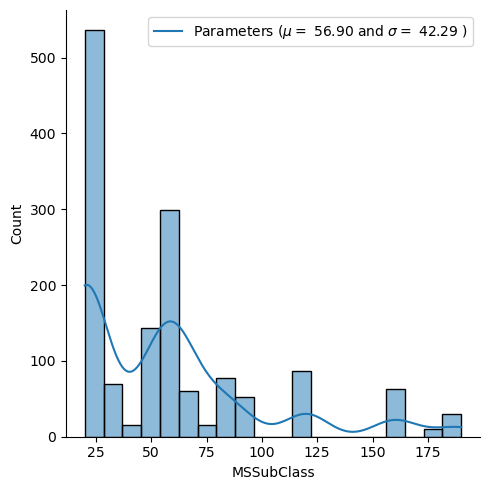

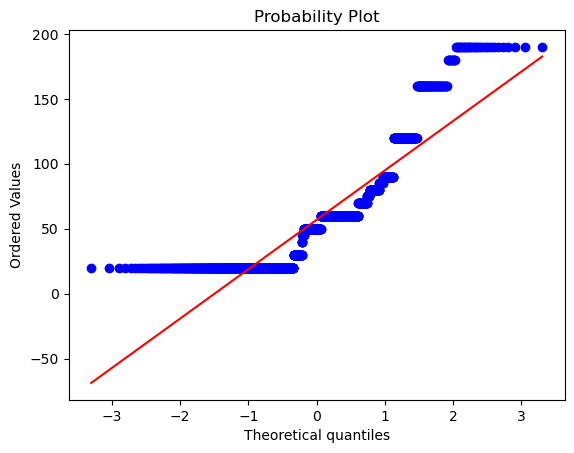

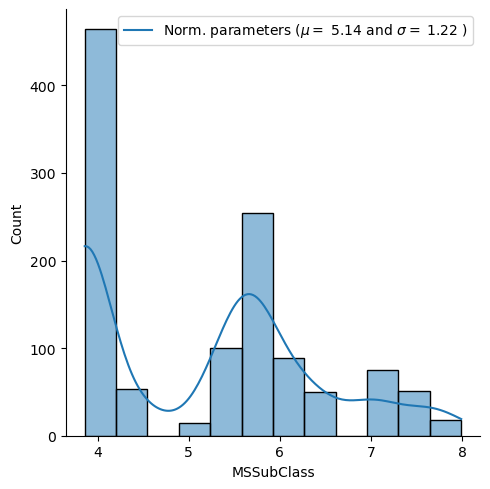

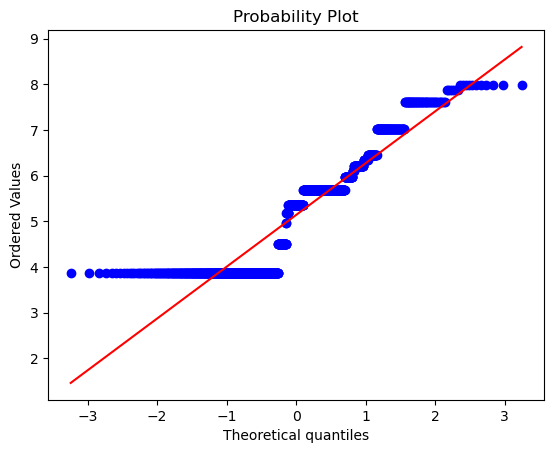

<Figure size 640x480 with 0 Axes>

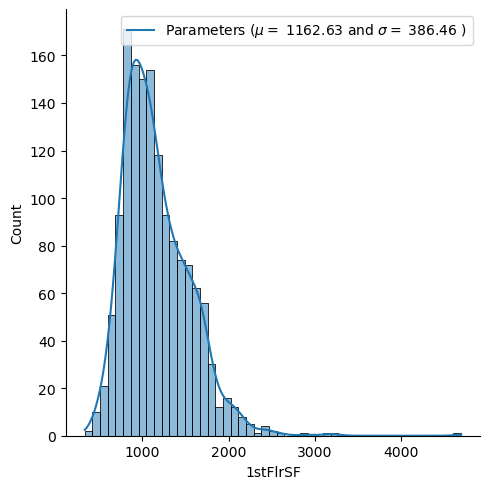

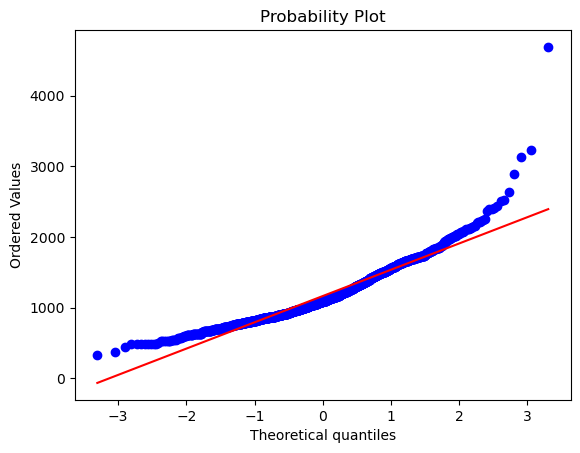

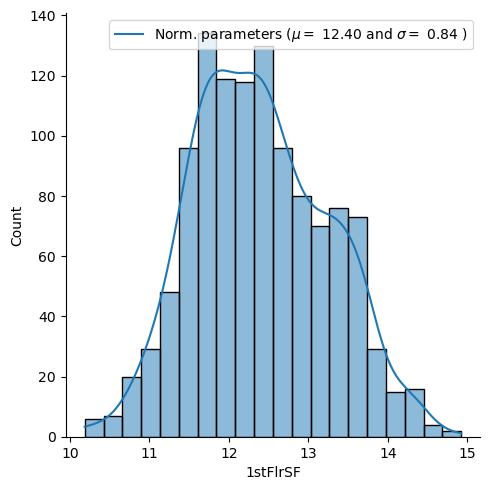

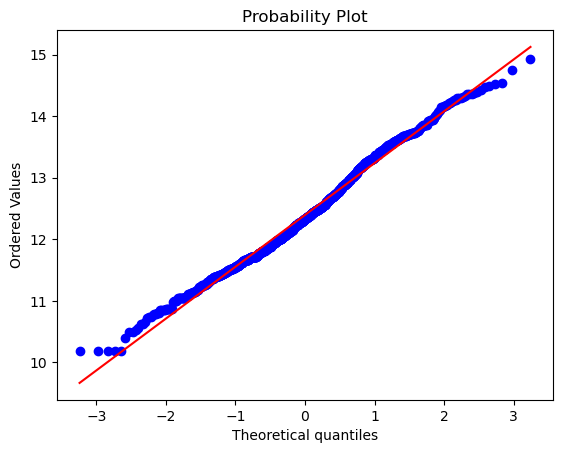

<Figure size 640x480 with 0 Axes>

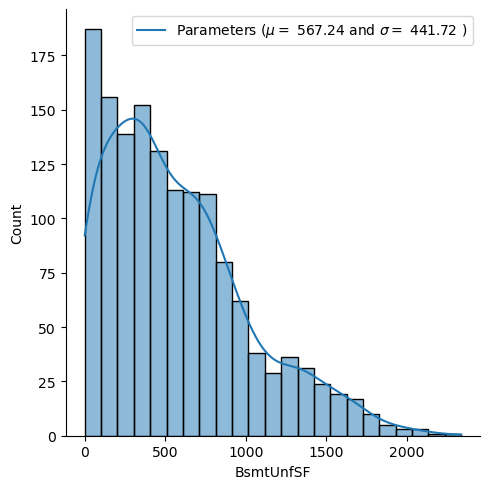

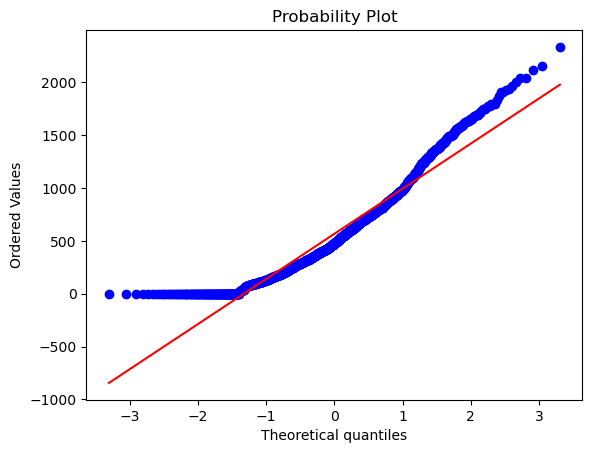

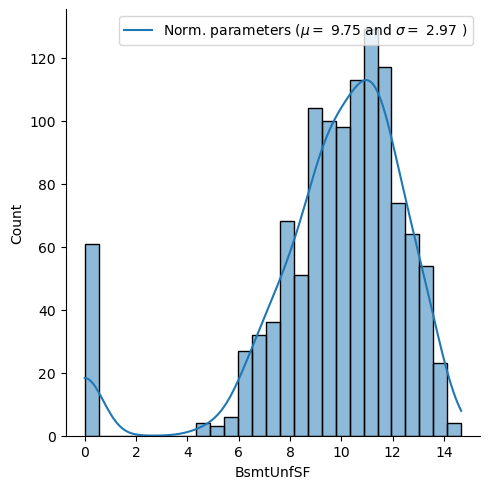

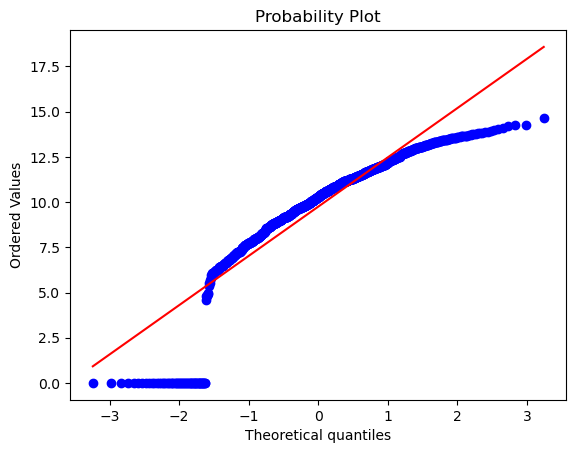

<Figure size 640x480 with 0 Axes>

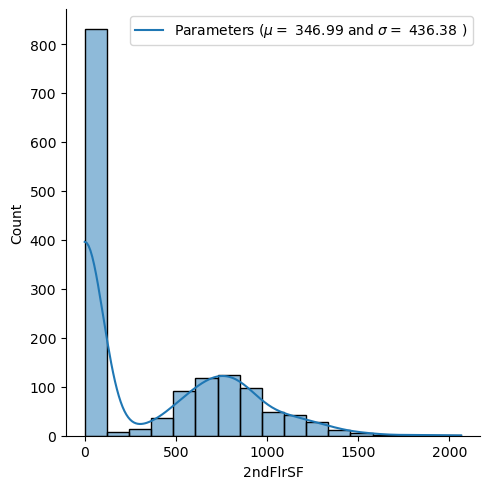

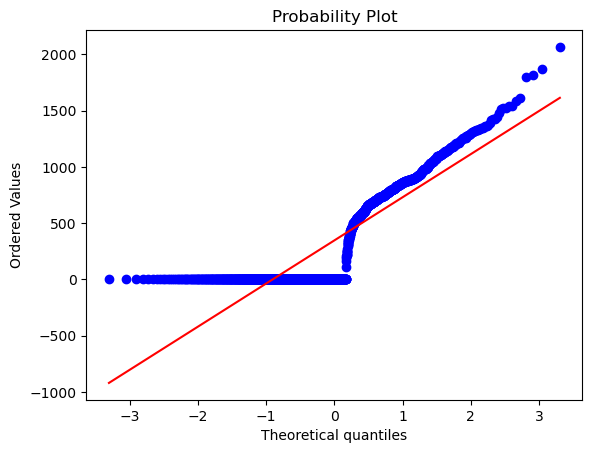

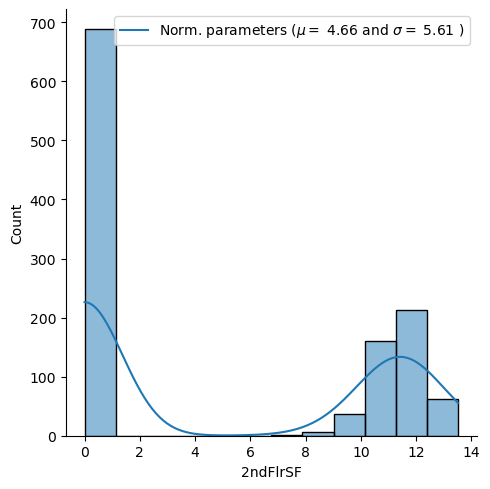

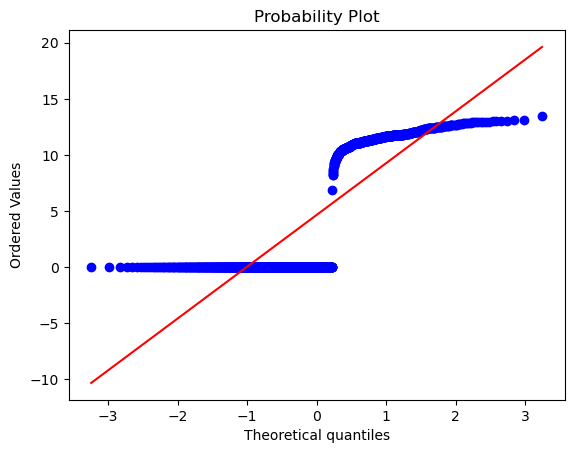

<Figure size 640x480 with 0 Axes>

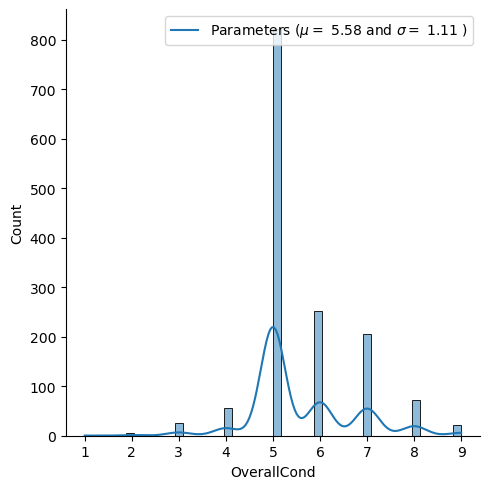

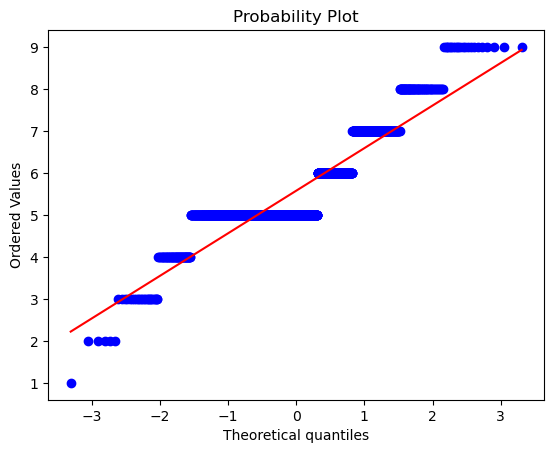

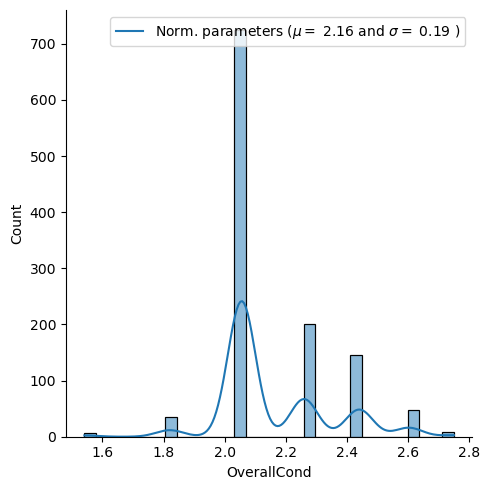

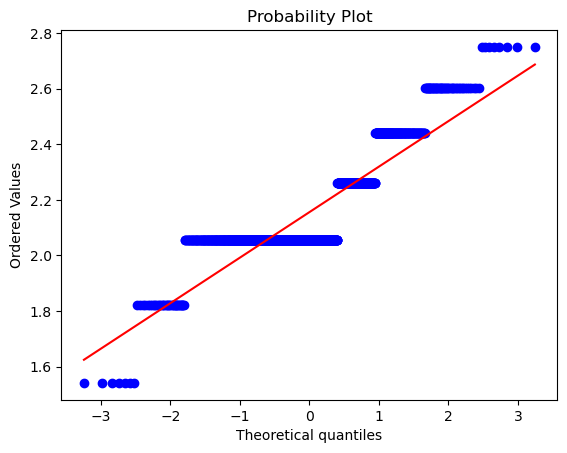

<Figure size 640x480 with 0 Axes>

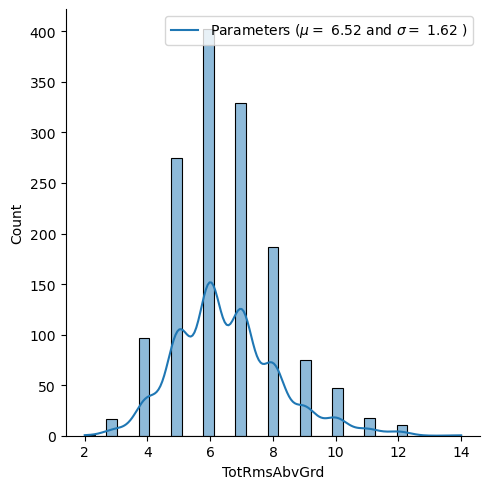

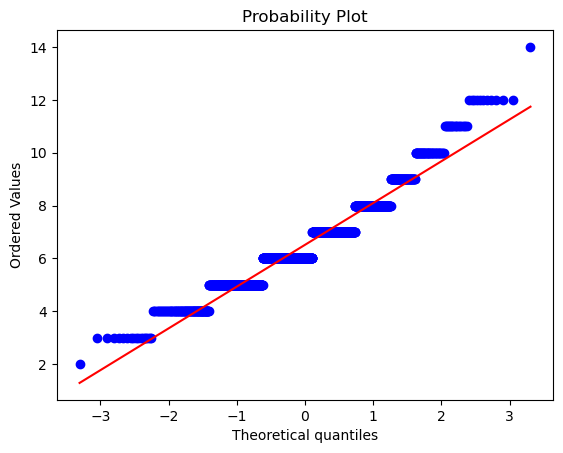

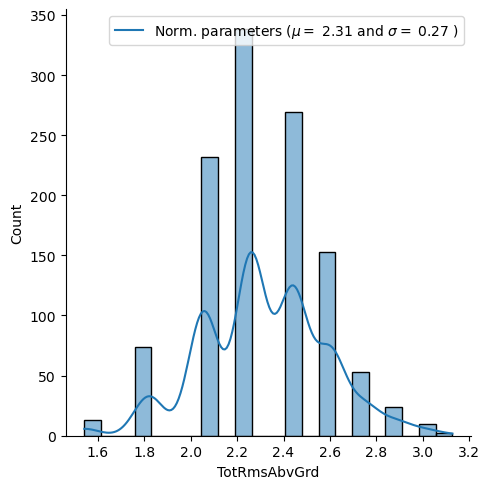

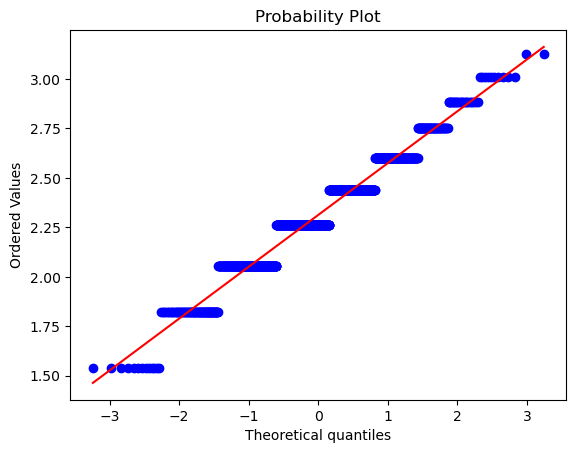

<Figure size 640x480 with 0 Axes>

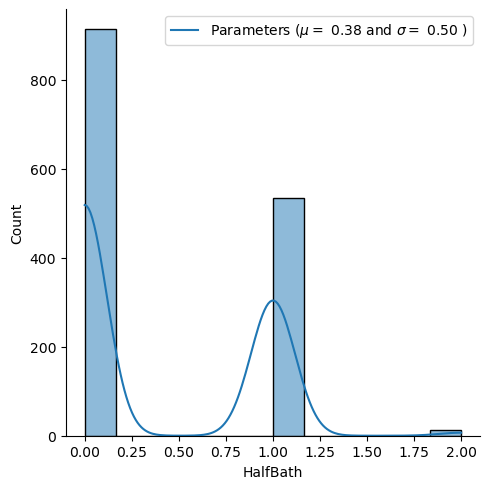

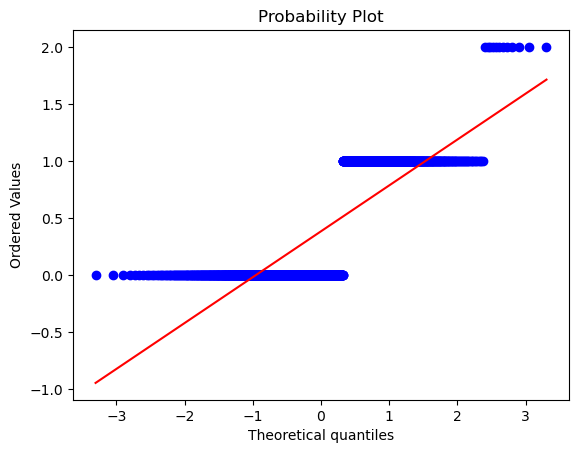

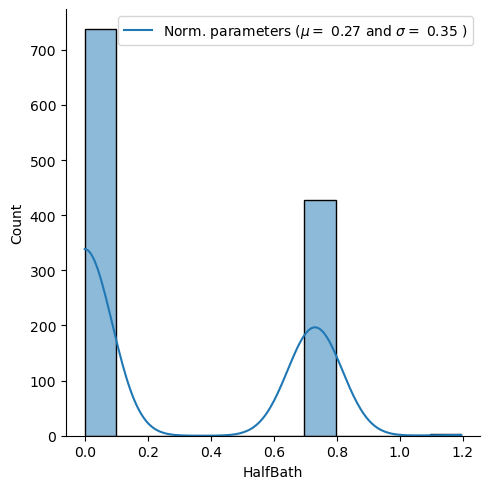

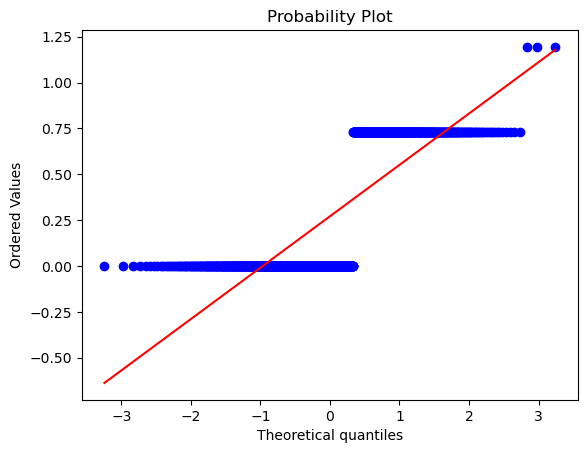

<Figure size 640x480 with 0 Axes>

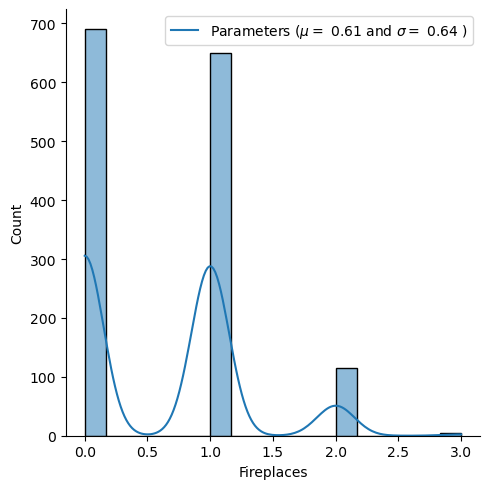

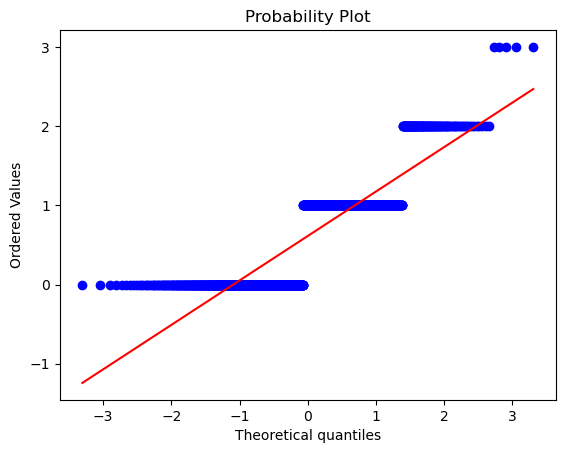

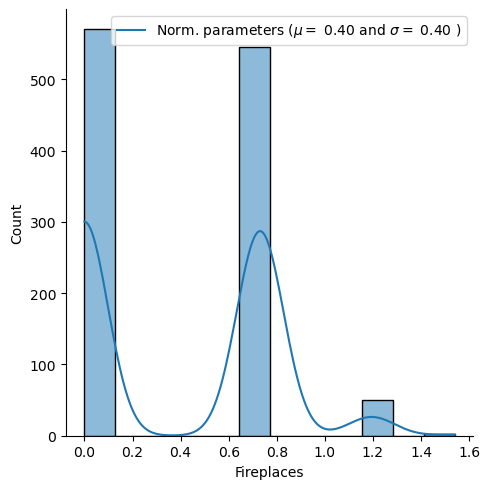

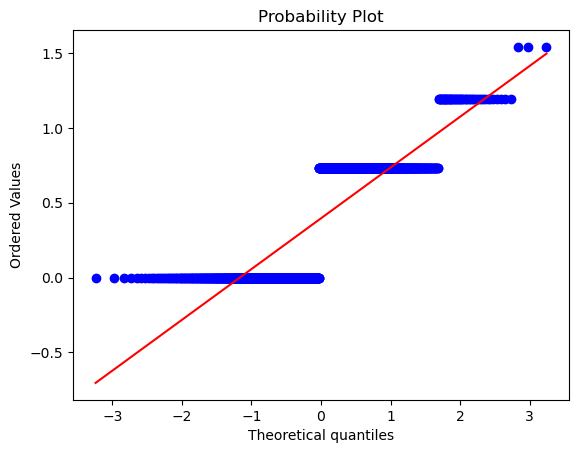

<Figure size 640x480 with 0 Axes>

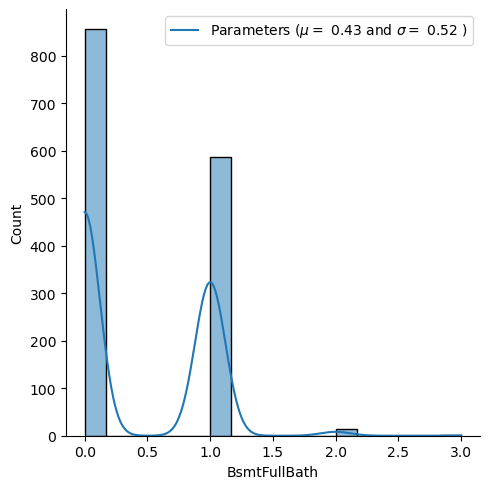

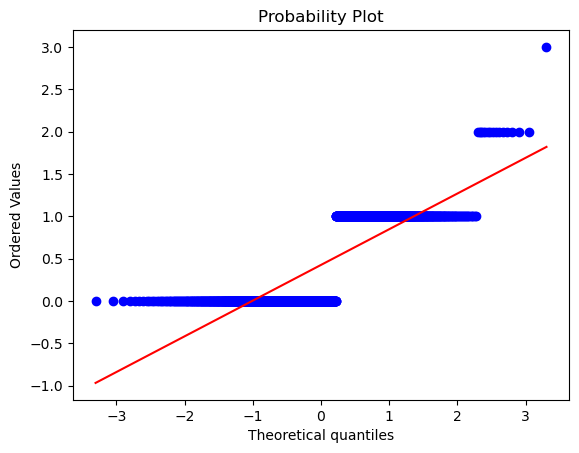

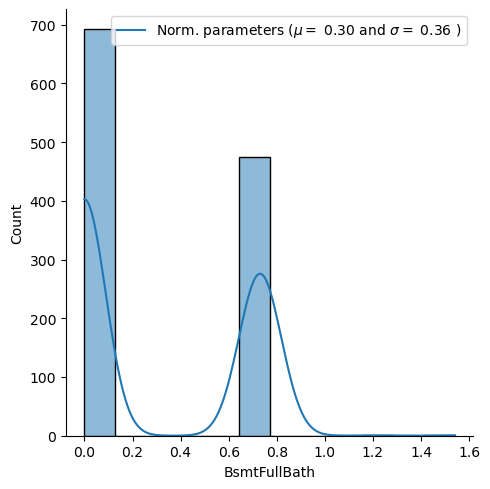

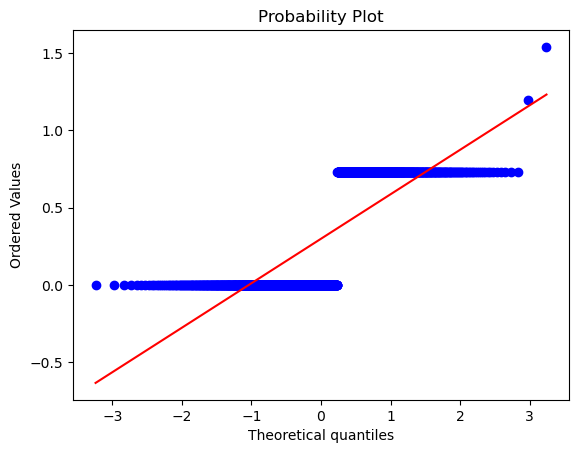

<Figure size 640x480 with 0 Axes>

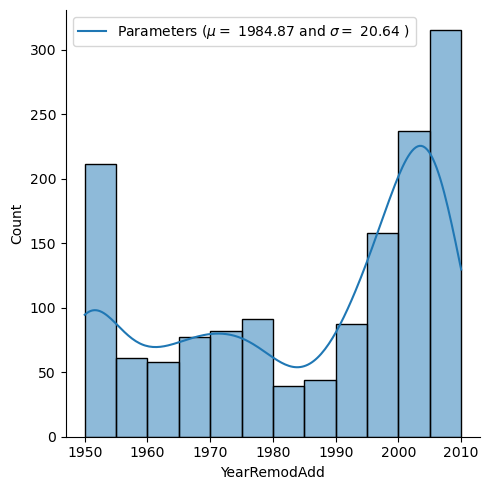

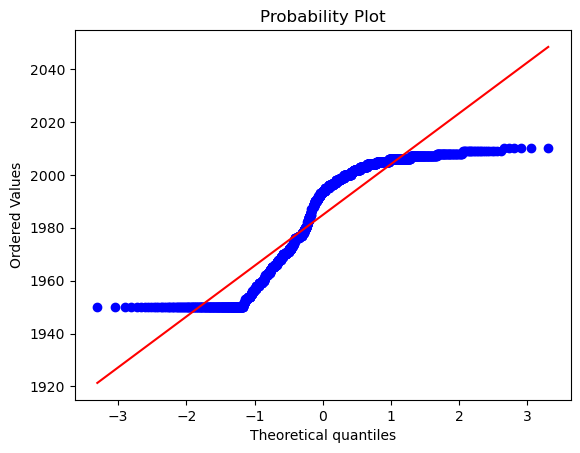

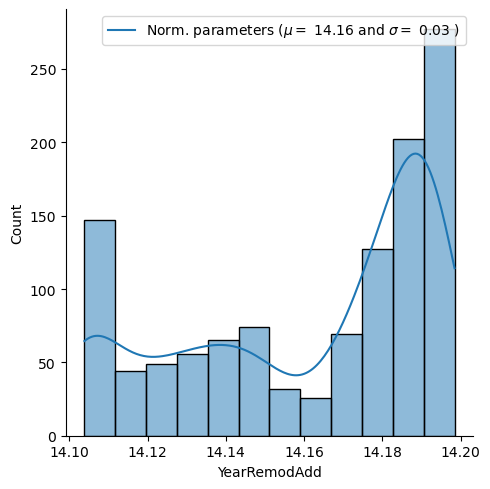

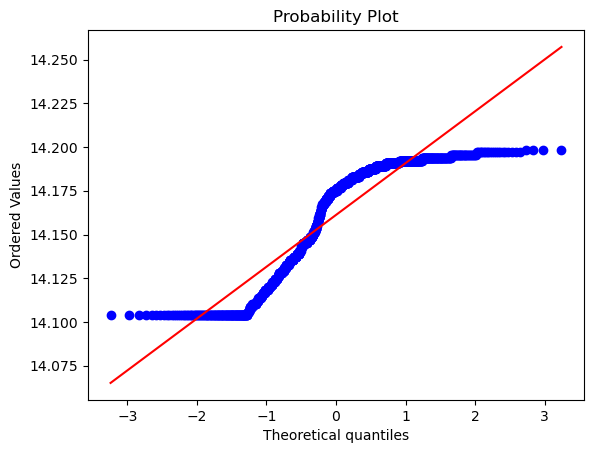

<Figure size 640x480 with 0 Axes>

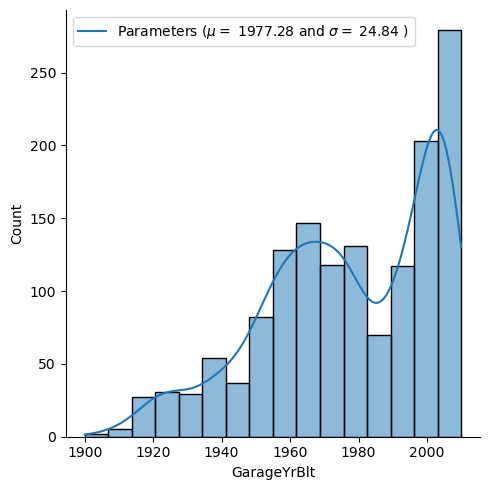

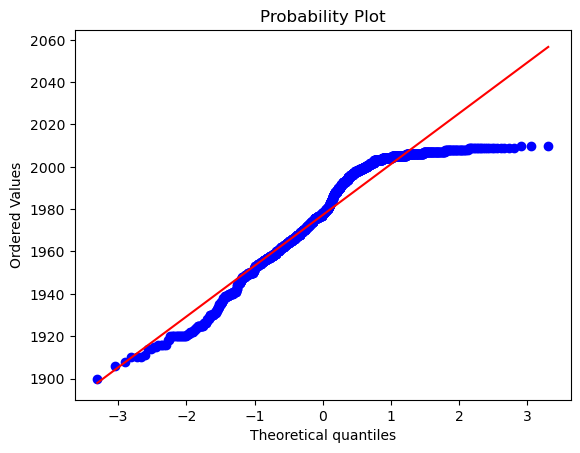

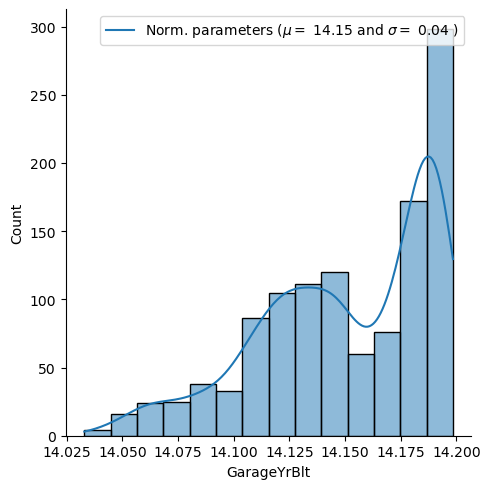

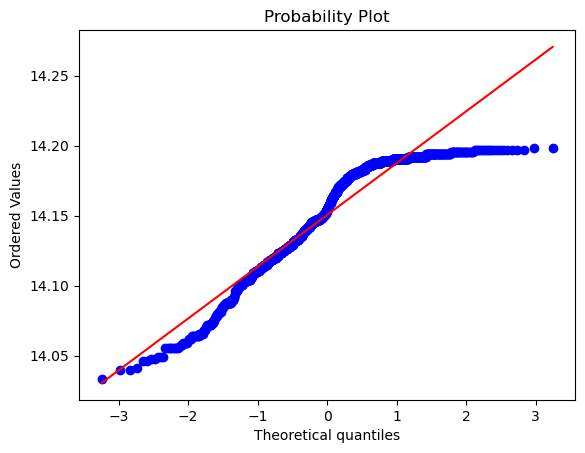

In [44]:
for i, col in enumerate(data_train[skewed_feats2_train].columns):
    plt.figure(i)
    sns.displot(data_train_before_box_cox[col], kde= True)
    (mu, sigma) = norm.fit(data_train_before_box_cox[col])
    plt.legend(['Parameters ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
    plt.show()
    plt.figure(i)
    stats.probplot(data_train_before_box_cox[col], plot=plt)
    plt.show()
    sns.displot(normal_data[col], kde= True)
    (mu, sigma) = norm.fit(normal_data[col])
    plt.legend(['Norm. parameters ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
    plt.show()
    stats.probplot(normal_data[col], plot=plt)
    plt.show()

#### PLOTTING QQ-PLOT OF FEATURES BEFORE AND AFTER BOX-COX TRANSFORMATION FOR TEST DATA

<Figure size 640x480 with 0 Axes>

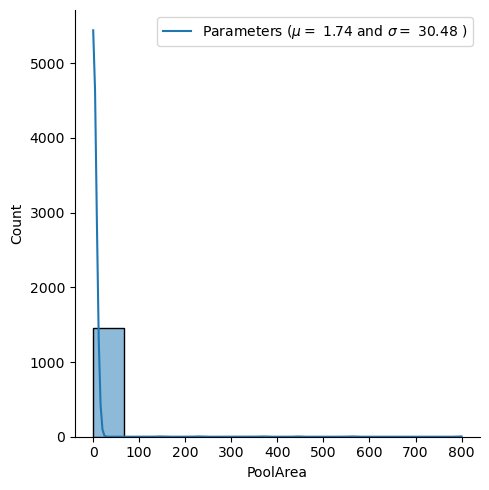

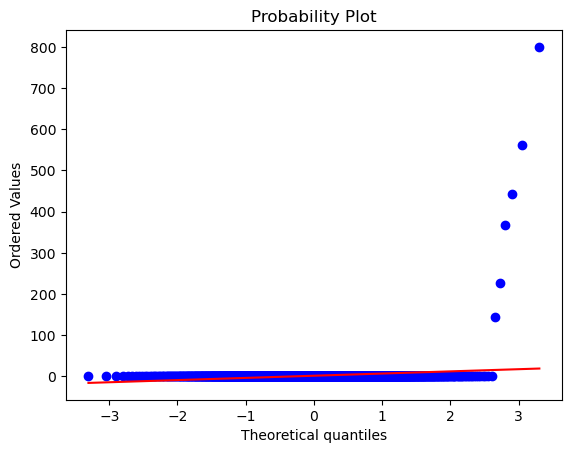

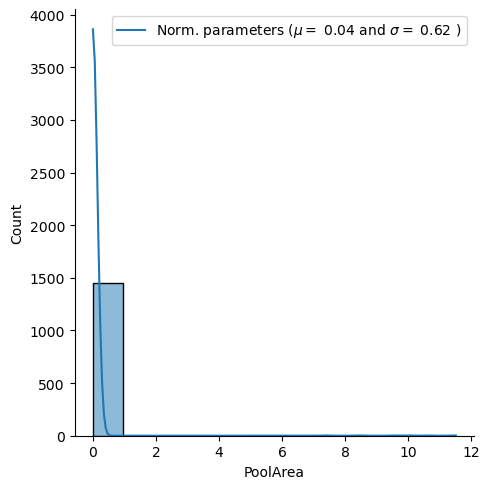

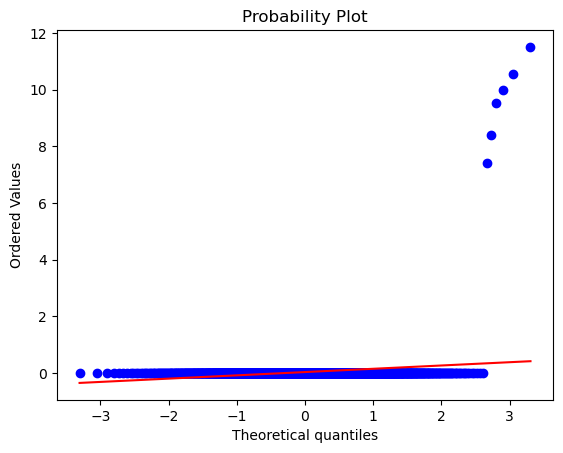

<Figure size 640x480 with 0 Axes>

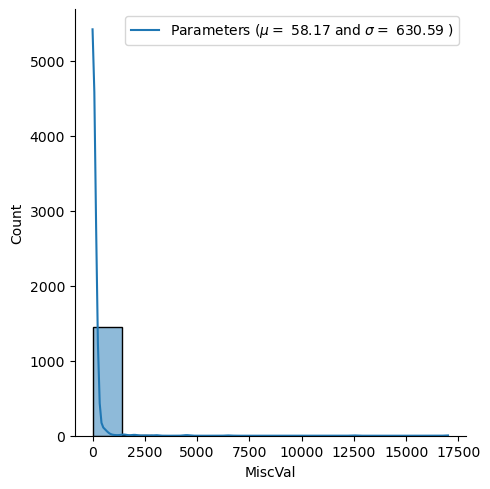

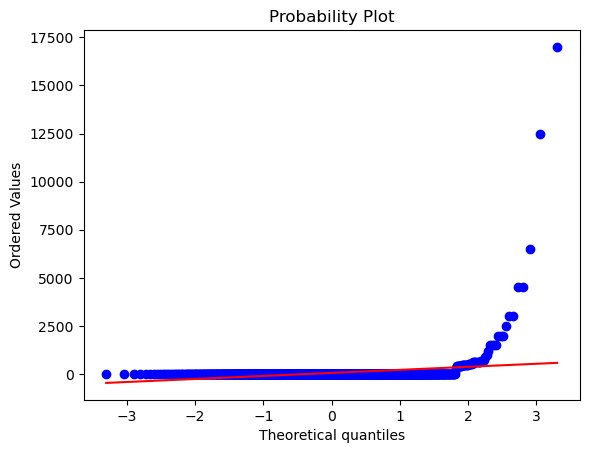

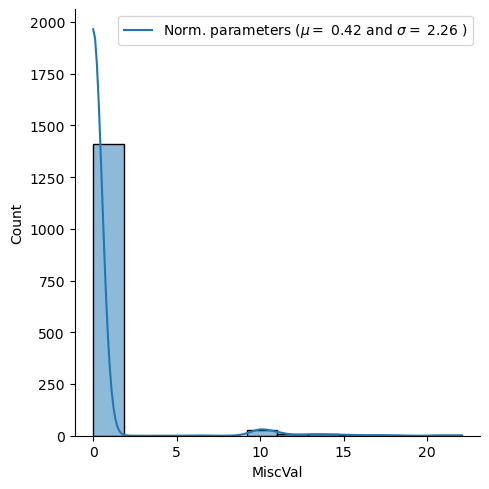

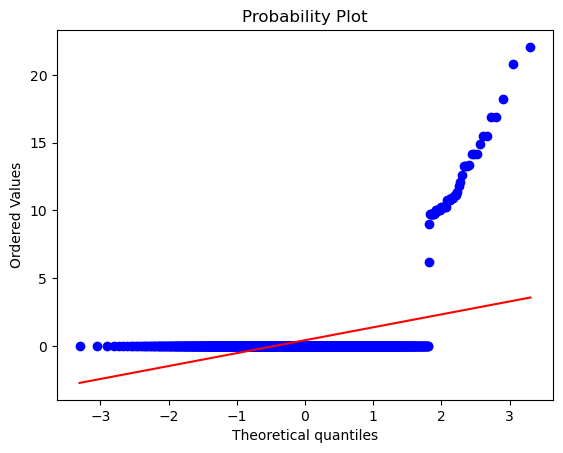

<Figure size 640x480 with 0 Axes>

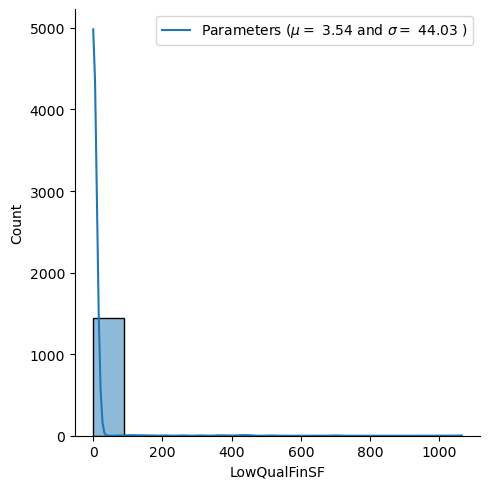

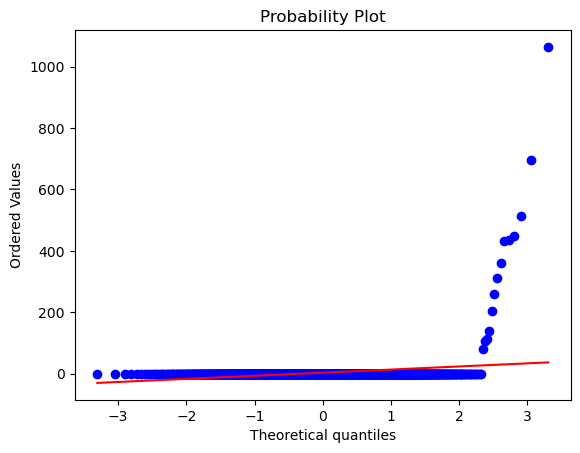

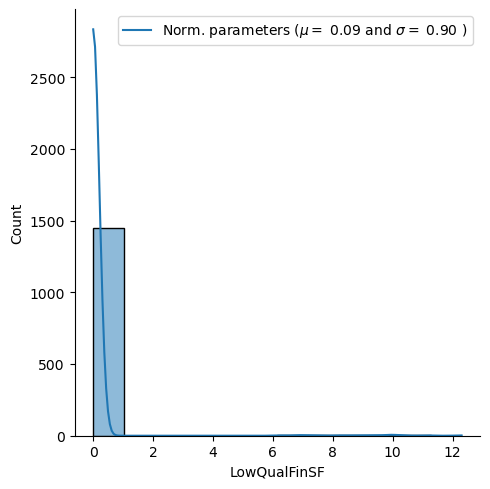

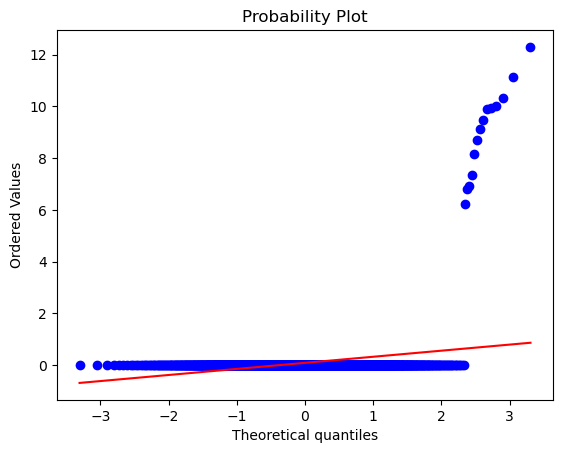

<Figure size 640x480 with 0 Axes>

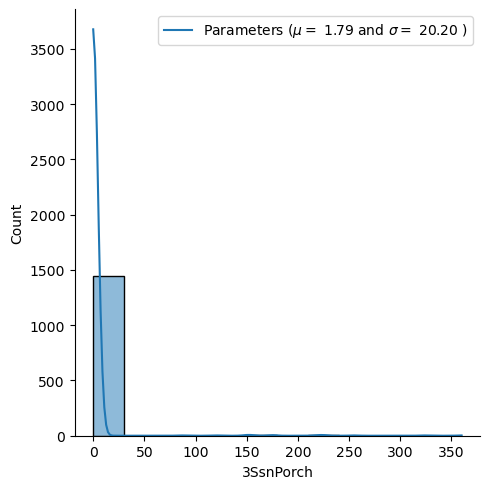

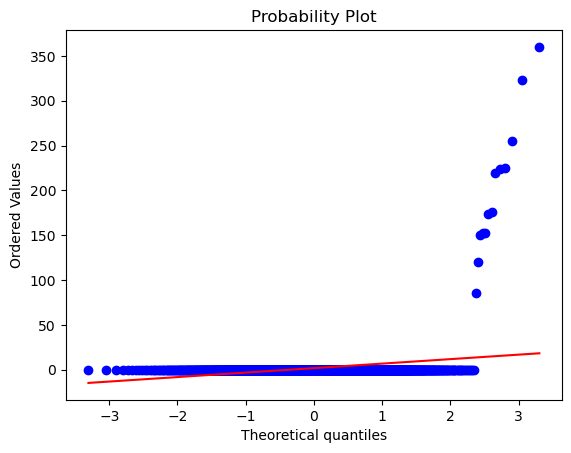

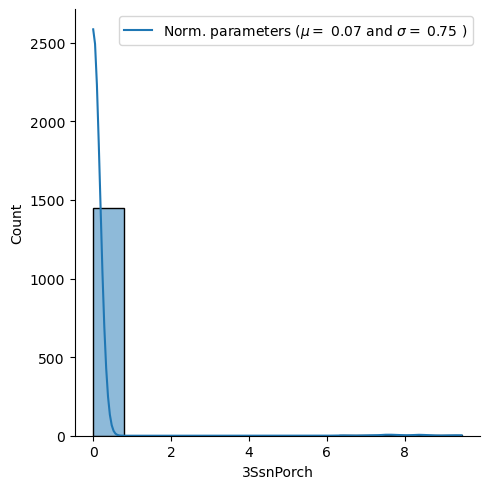

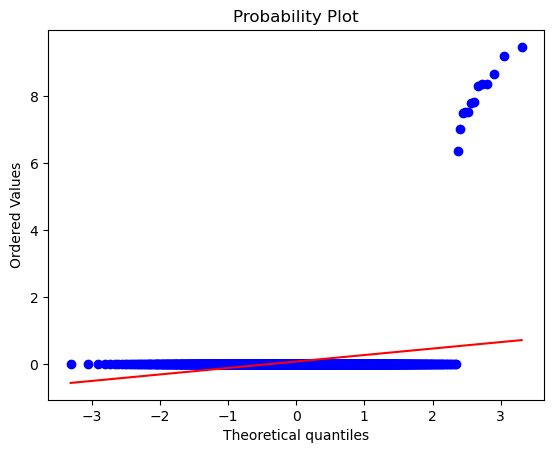

<Figure size 640x480 with 0 Axes>

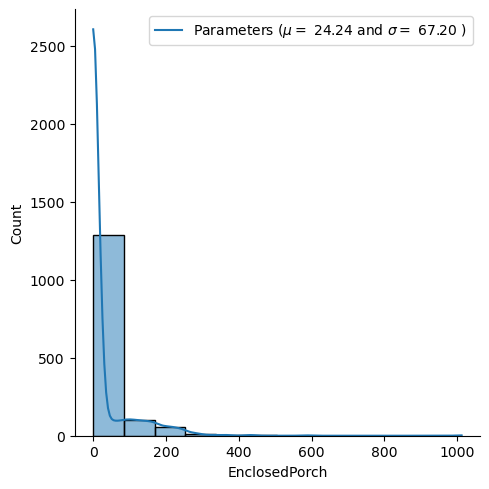

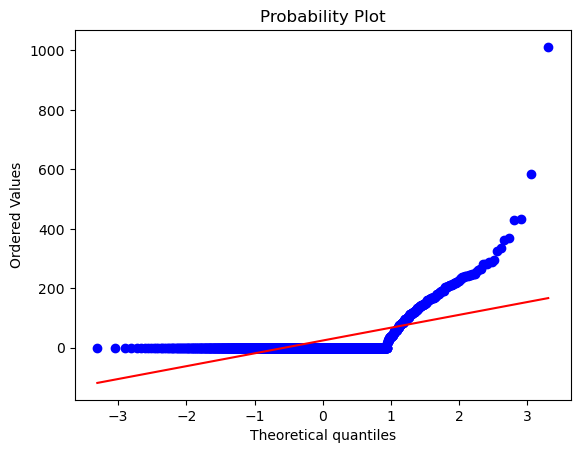

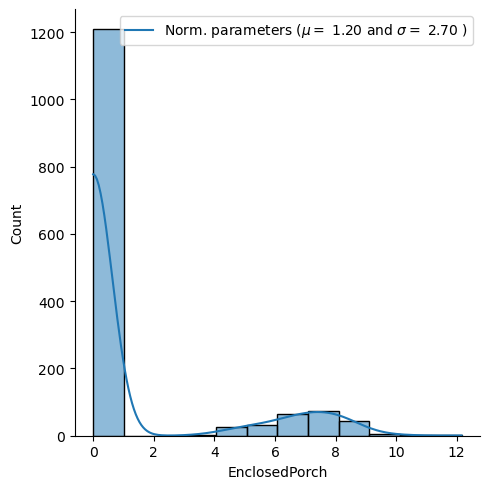

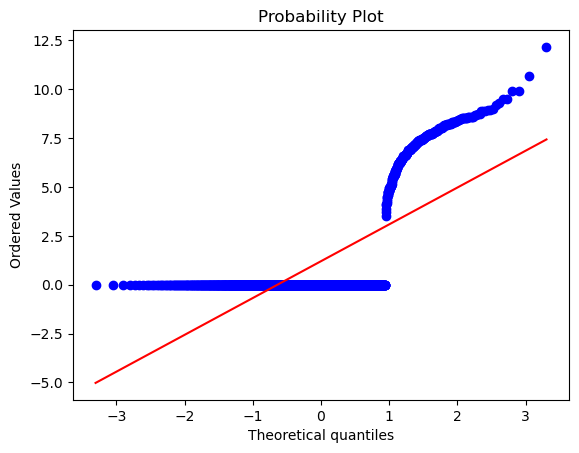

<Figure size 640x480 with 0 Axes>

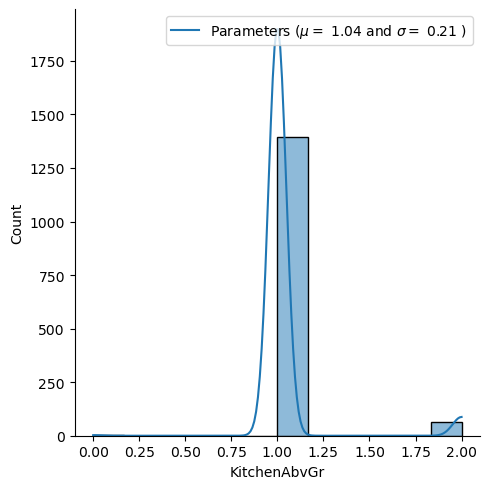

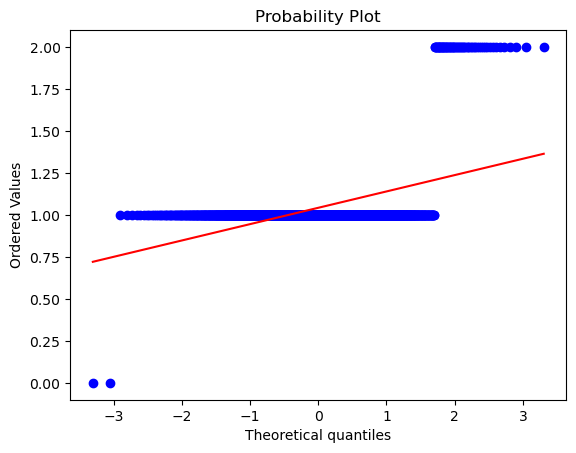

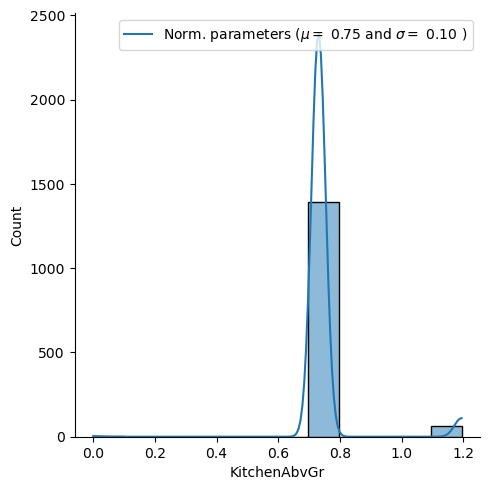

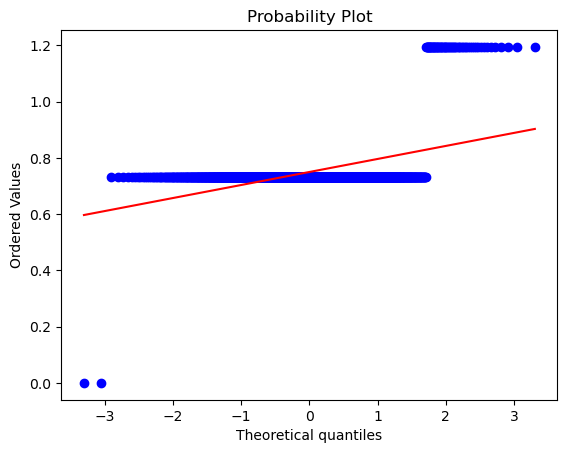

<Figure size 640x480 with 0 Axes>

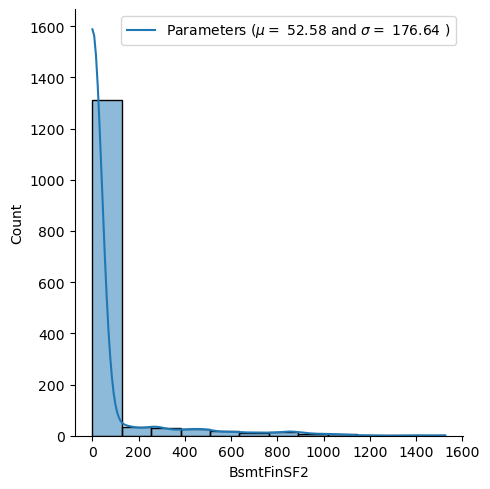

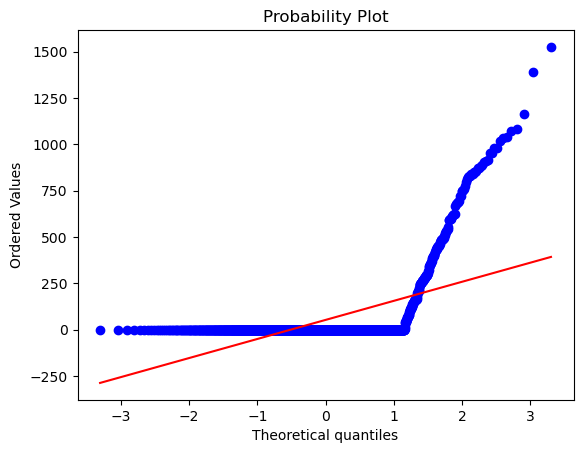

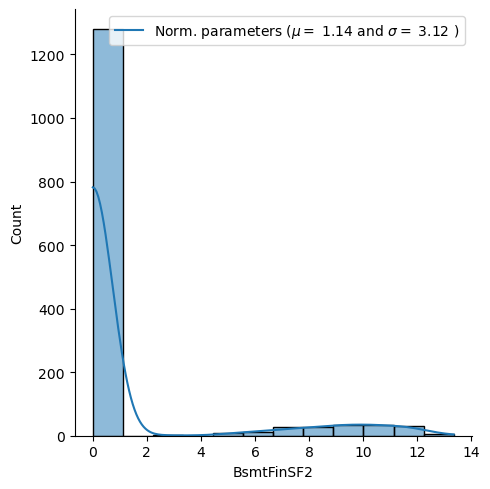

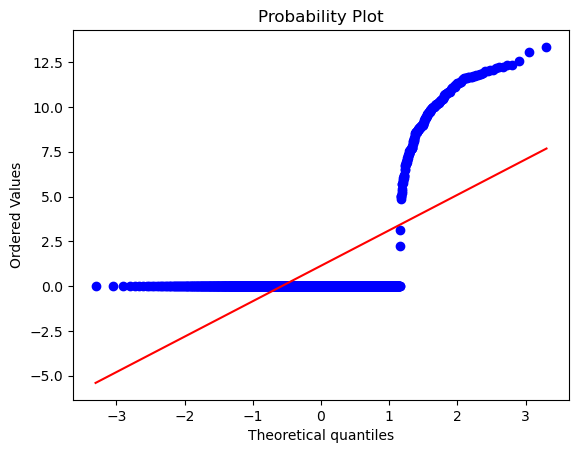

<Figure size 640x480 with 0 Axes>

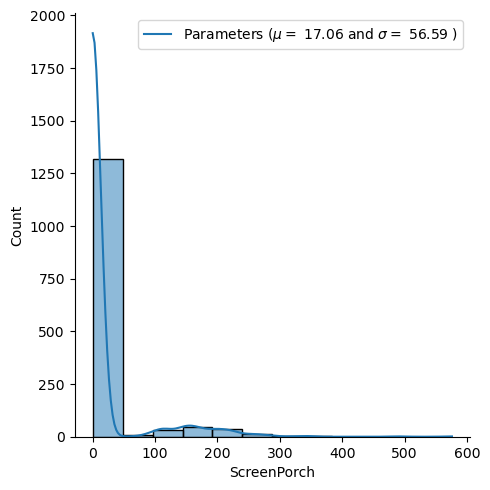

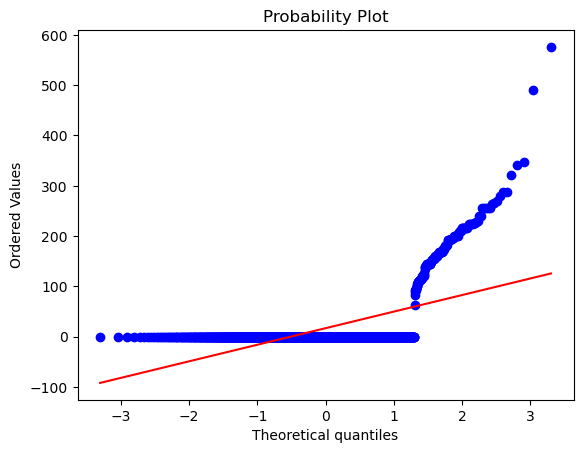

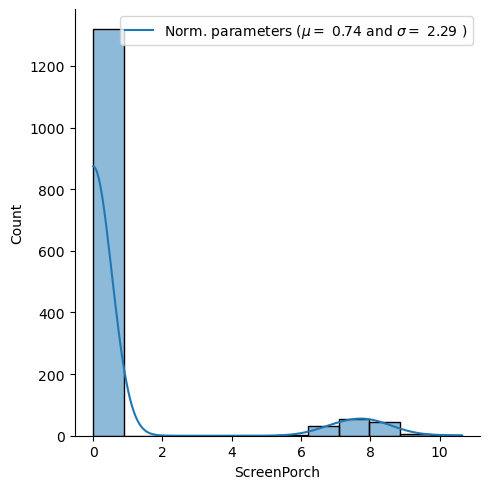

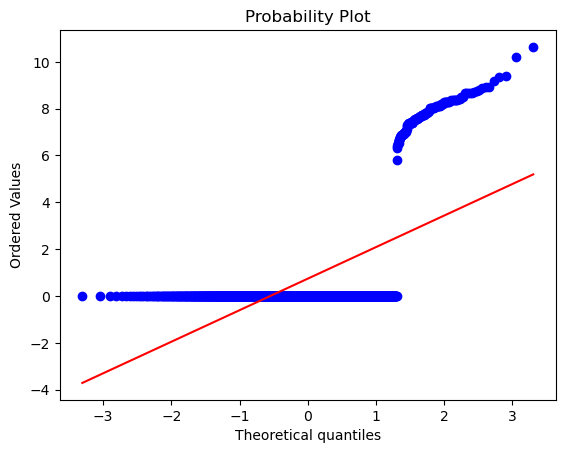

<Figure size 640x480 with 0 Axes>

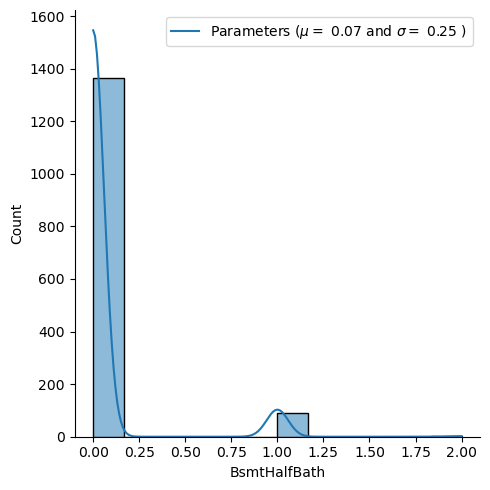

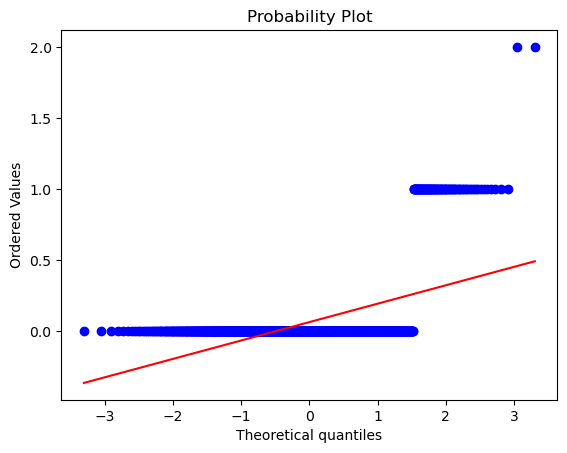

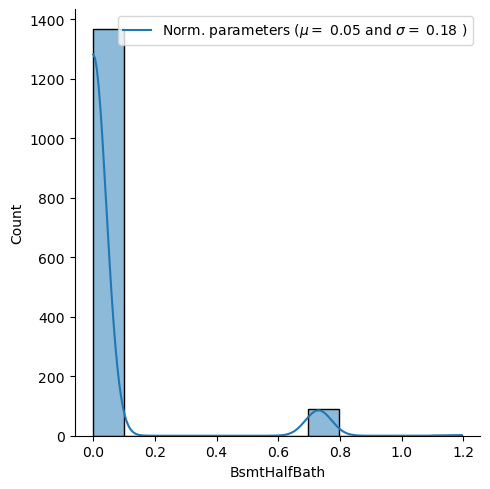

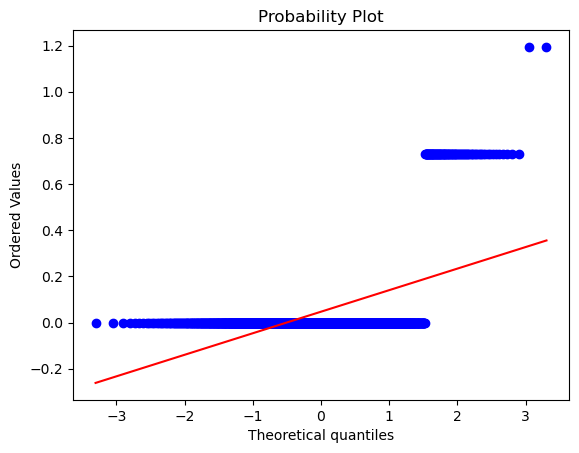

<Figure size 640x480 with 0 Axes>

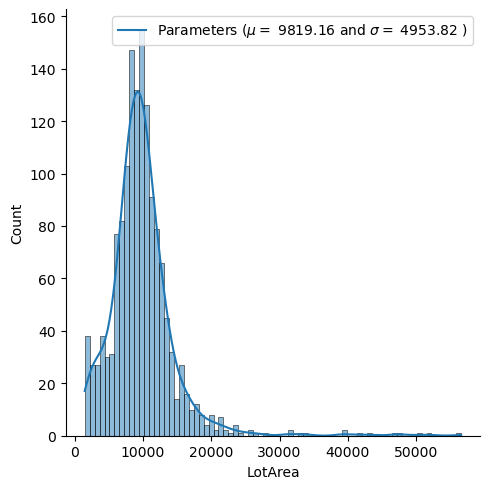

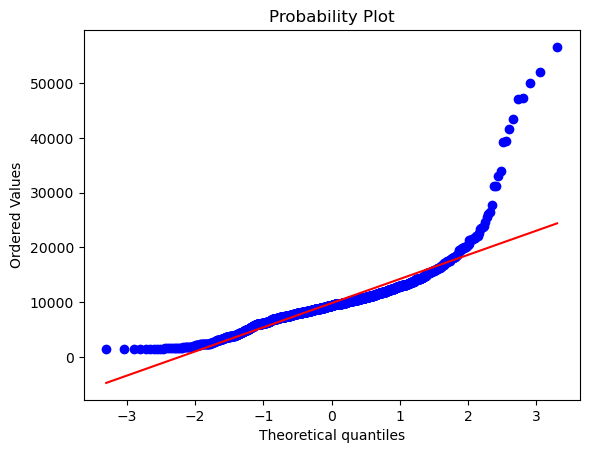

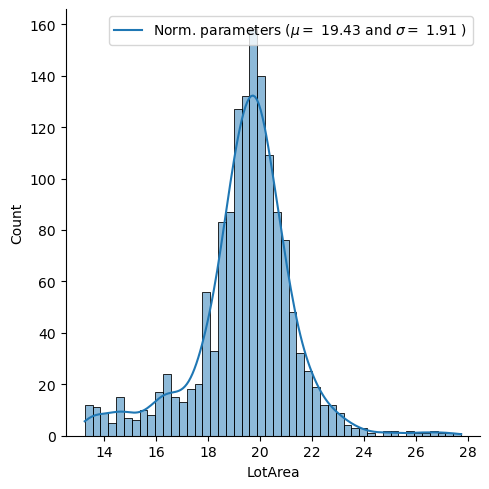

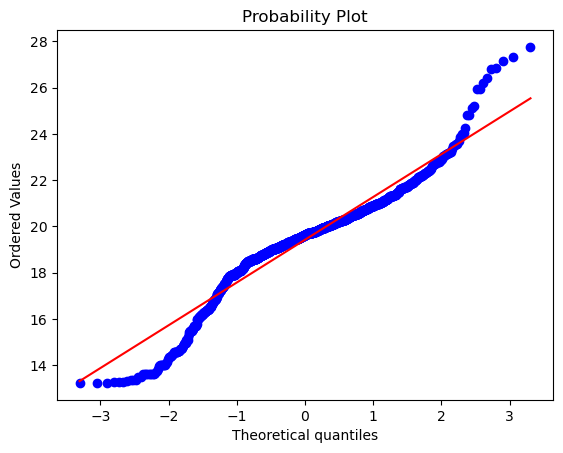

<Figure size 640x480 with 0 Axes>

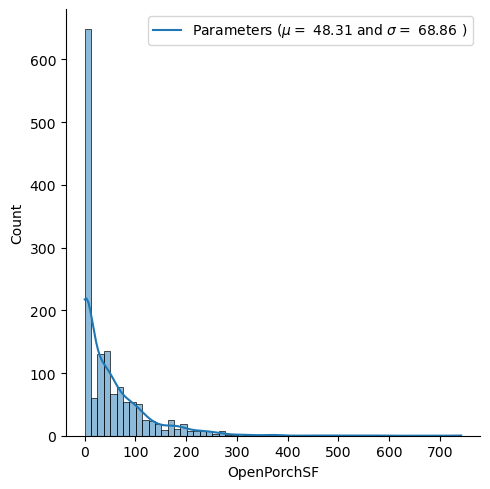

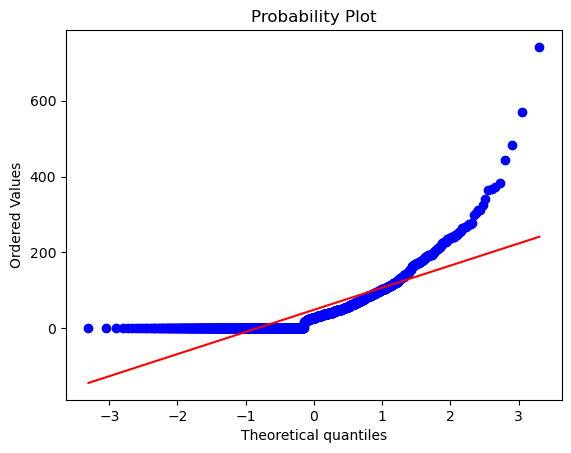

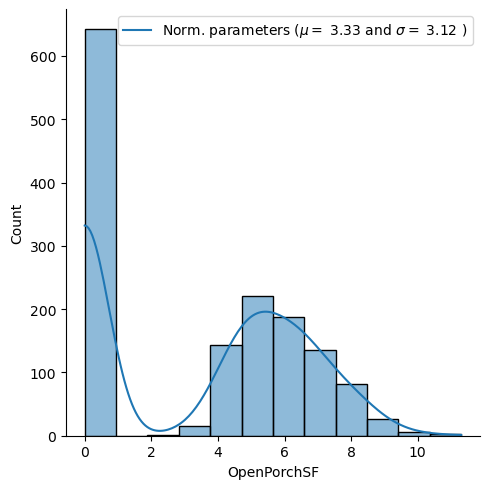

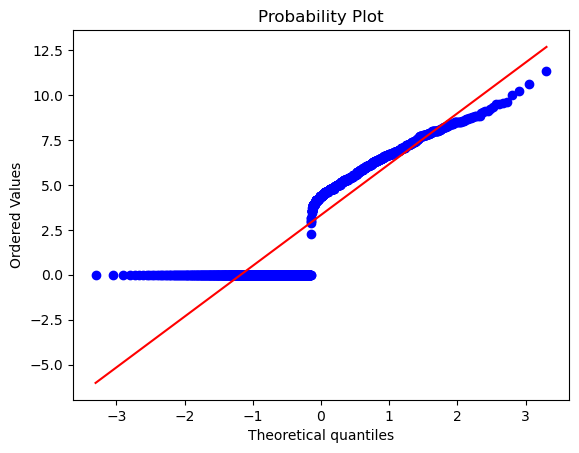

<Figure size 640x480 with 0 Axes>

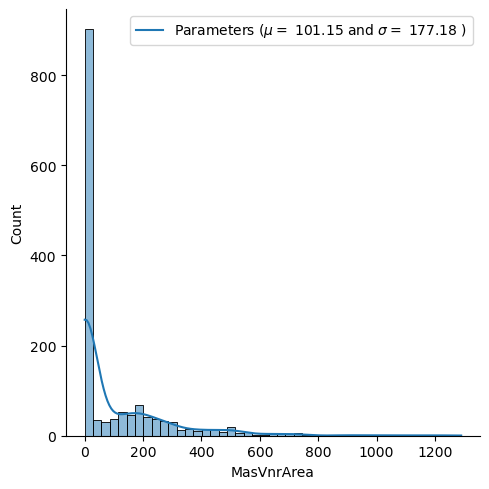

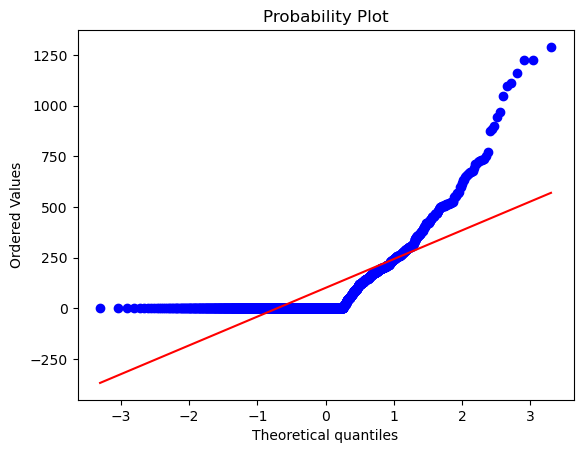

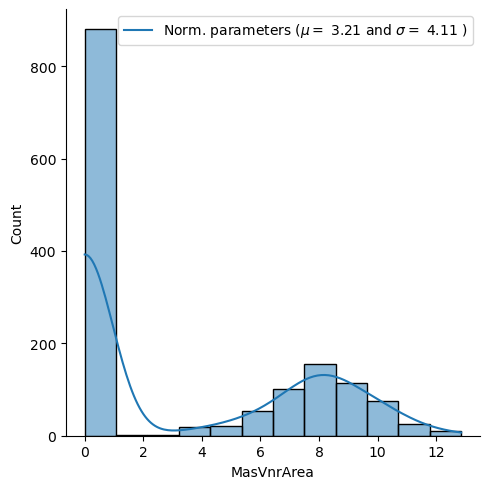

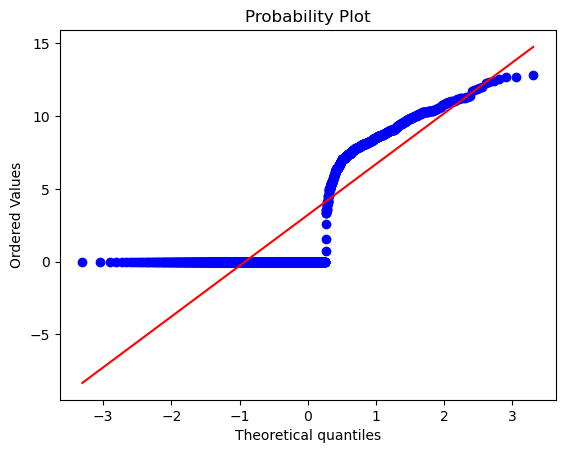

<Figure size 640x480 with 0 Axes>

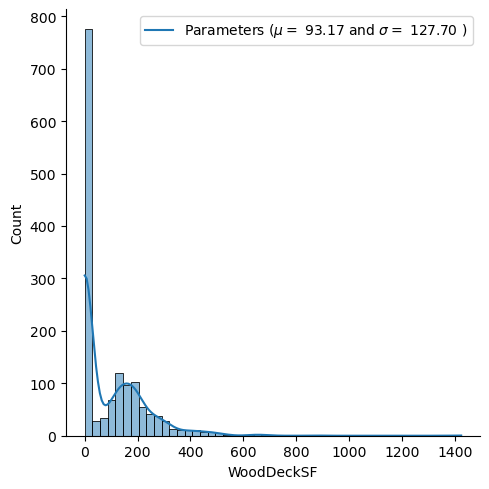

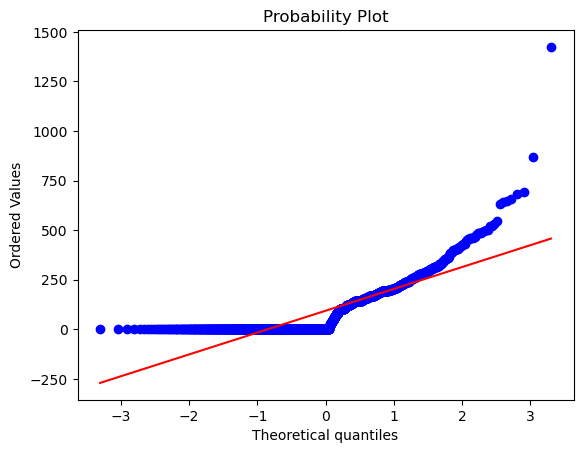

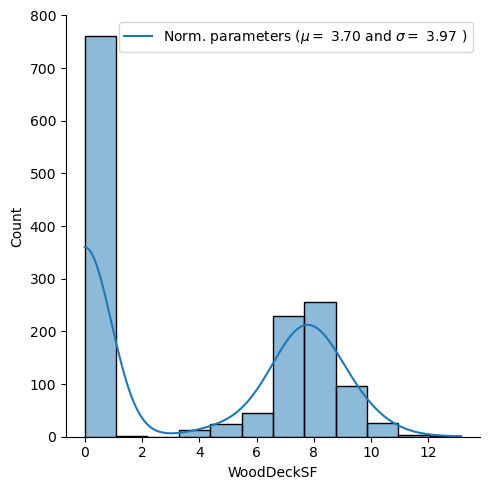

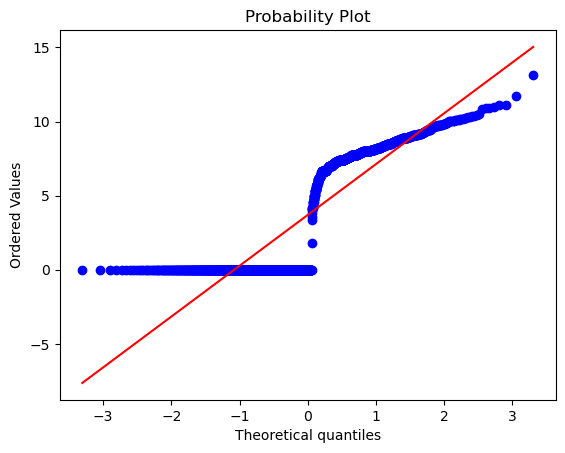

<Figure size 640x480 with 0 Axes>

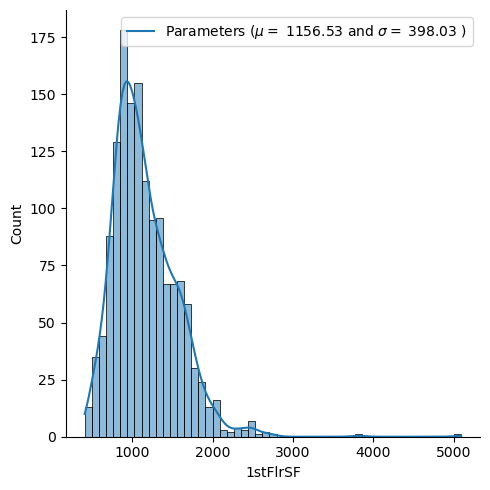

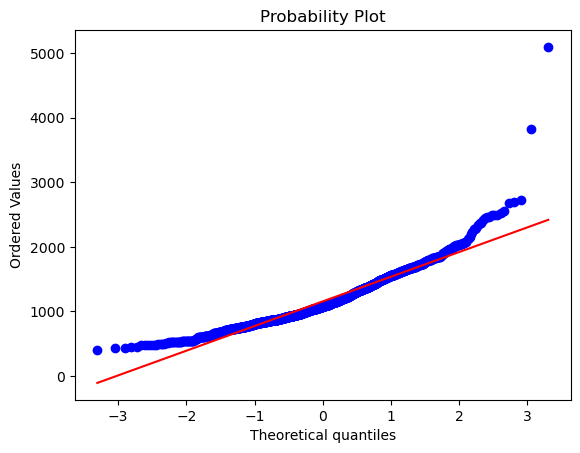

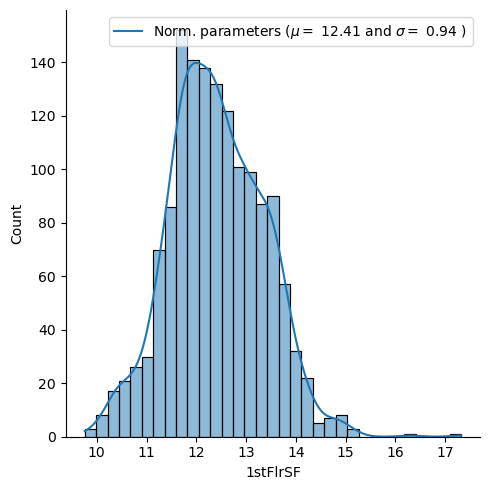

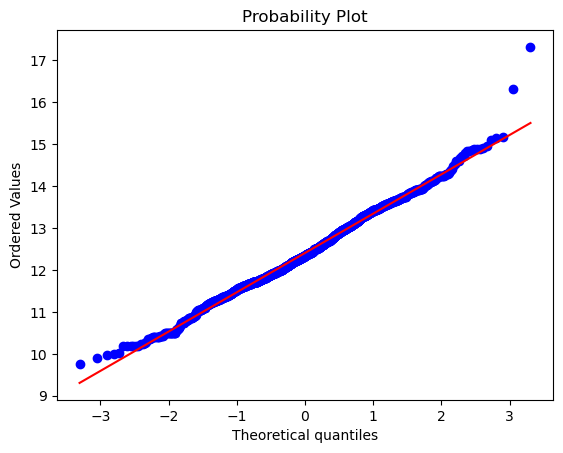

<Figure size 640x480 with 0 Axes>

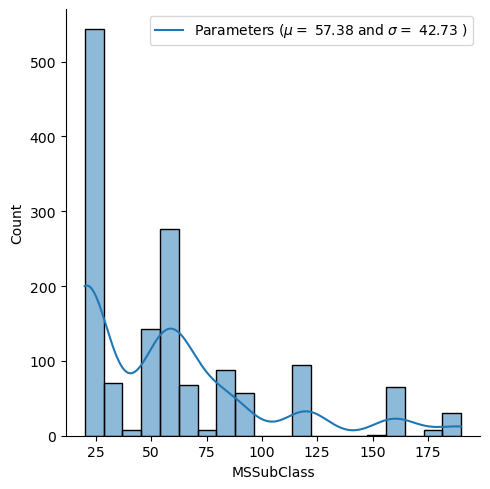

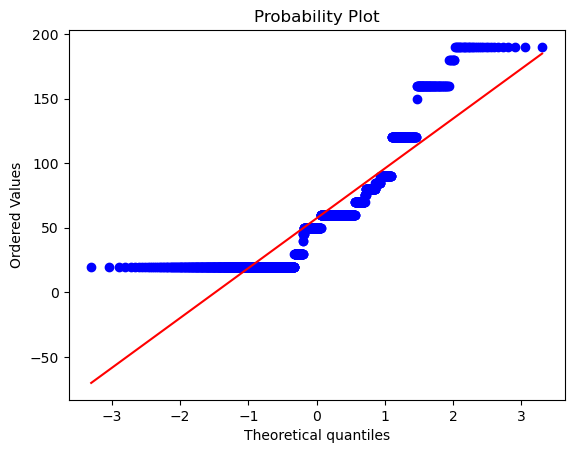

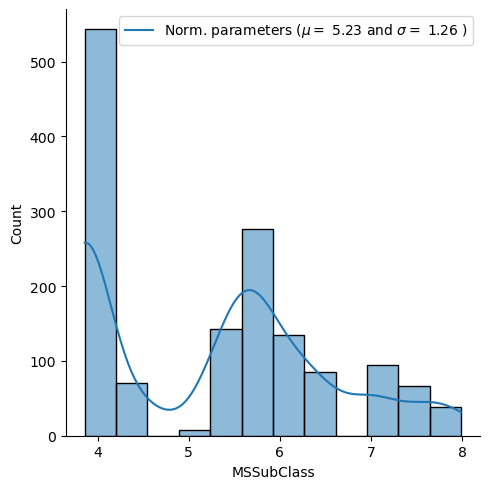

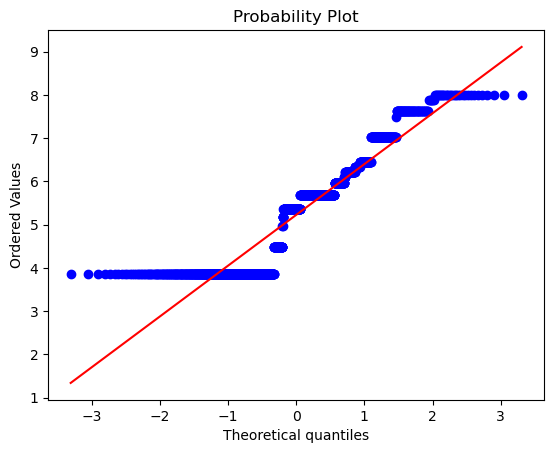

<Figure size 640x480 with 0 Axes>

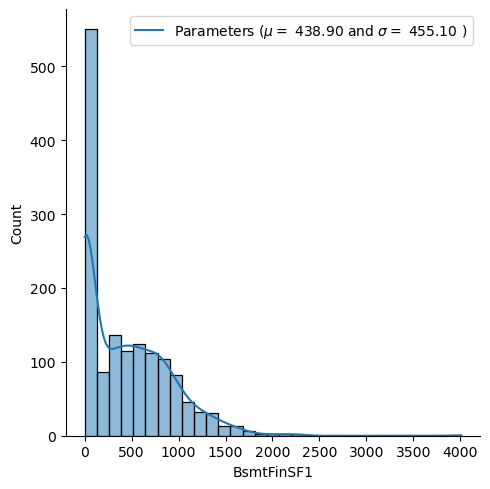

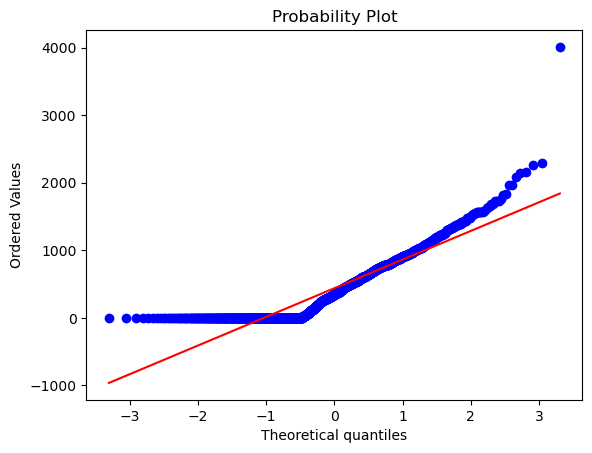

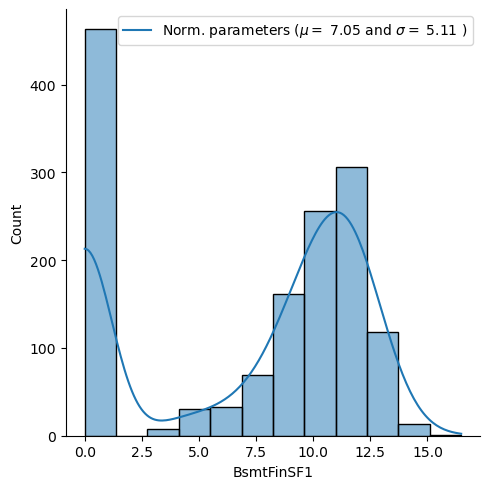

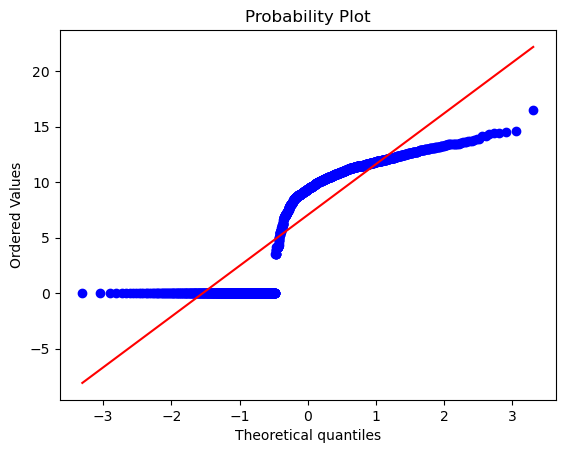

<Figure size 640x480 with 0 Axes>

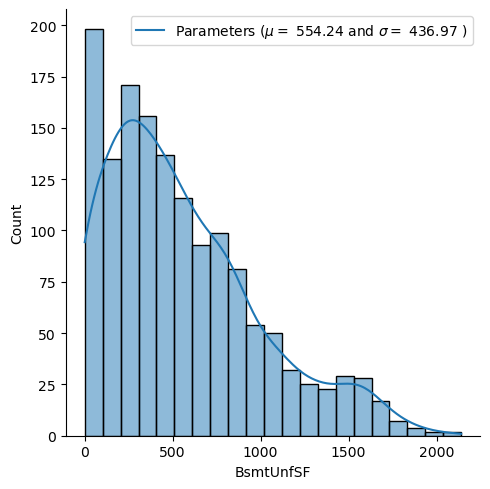

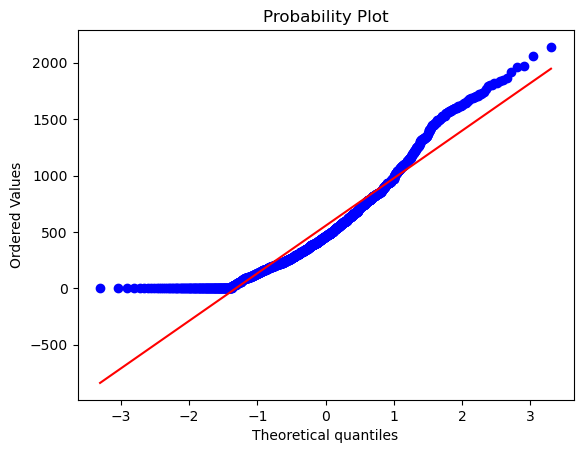

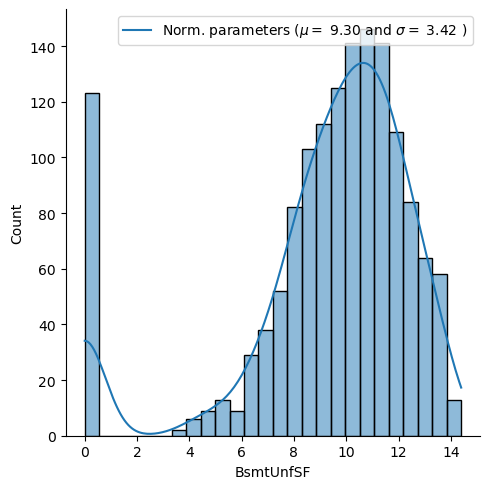

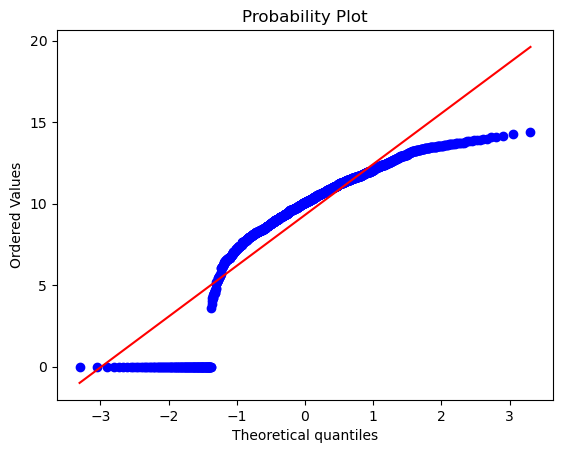

<Figure size 640x480 with 0 Axes>

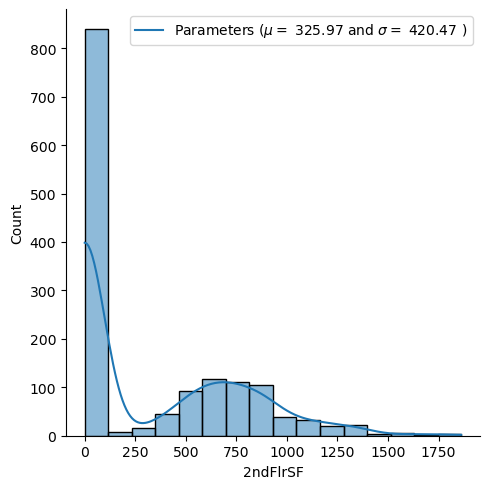

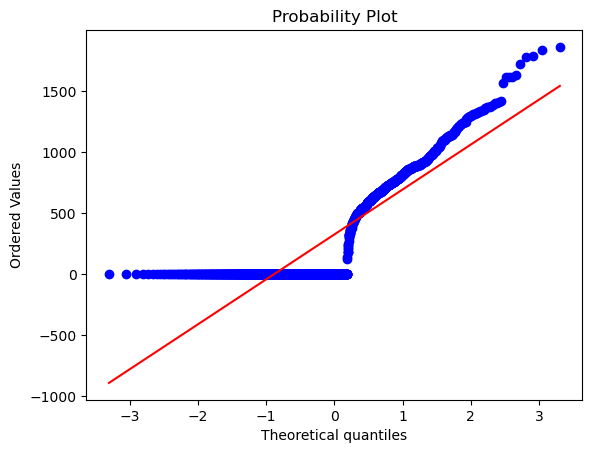

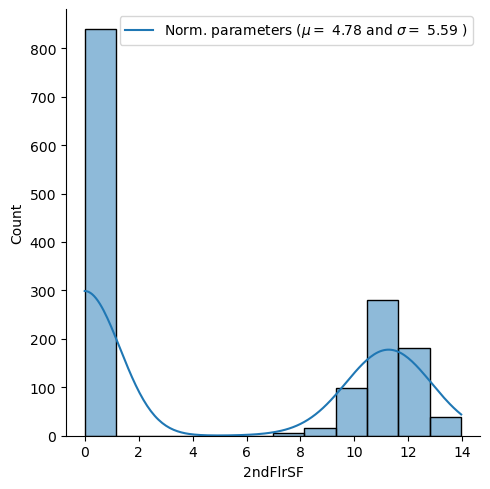

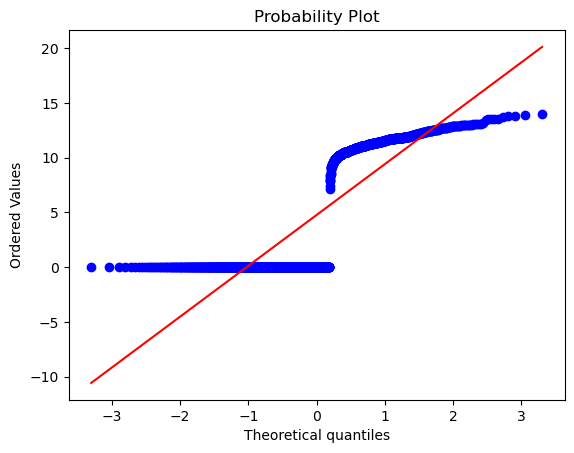

<Figure size 640x480 with 0 Axes>

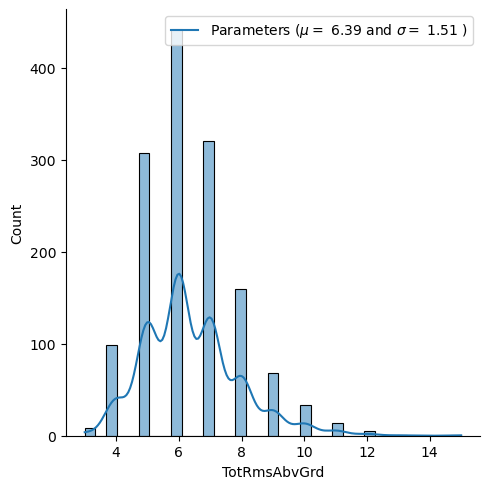

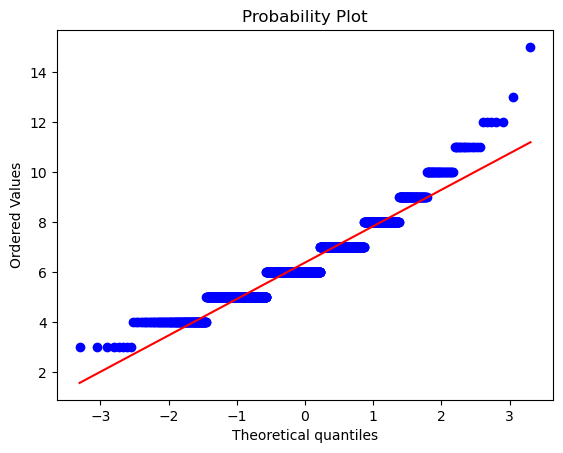

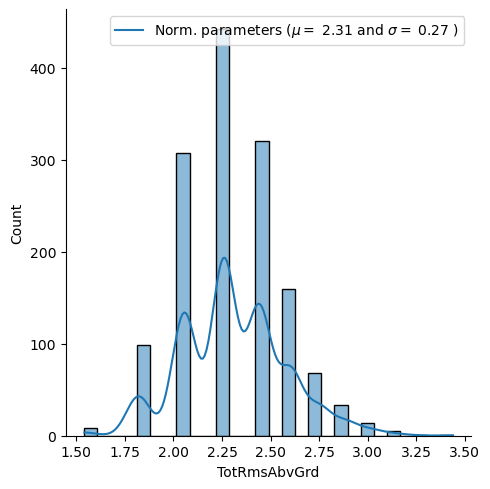

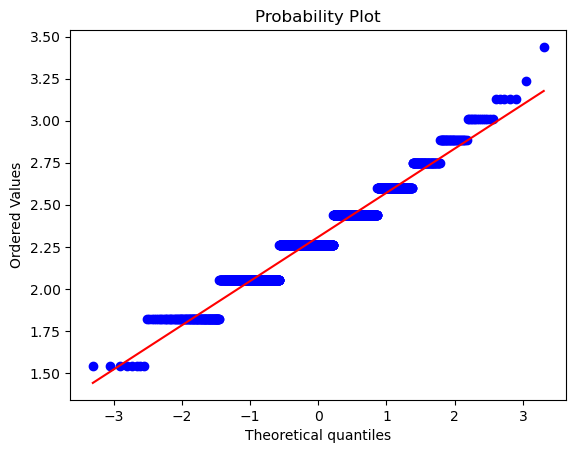

<Figure size 640x480 with 0 Axes>

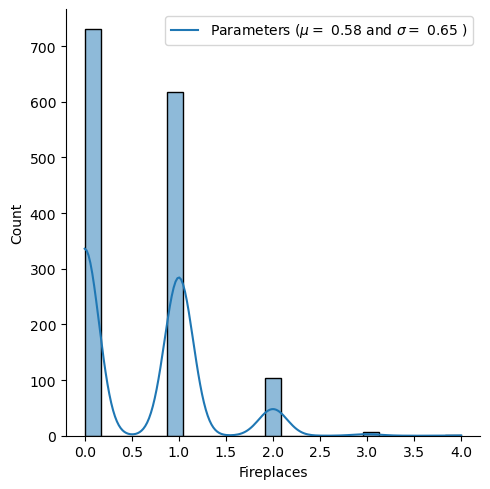

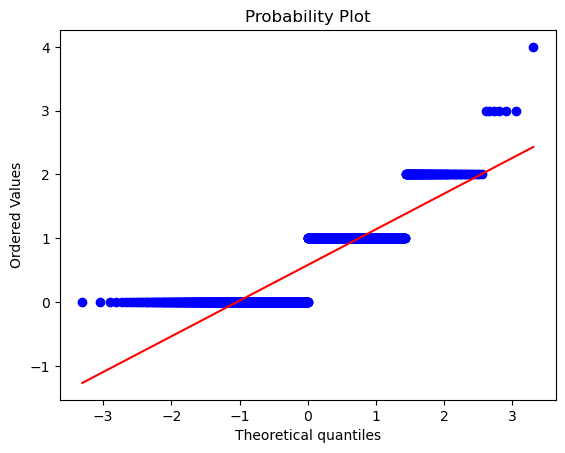

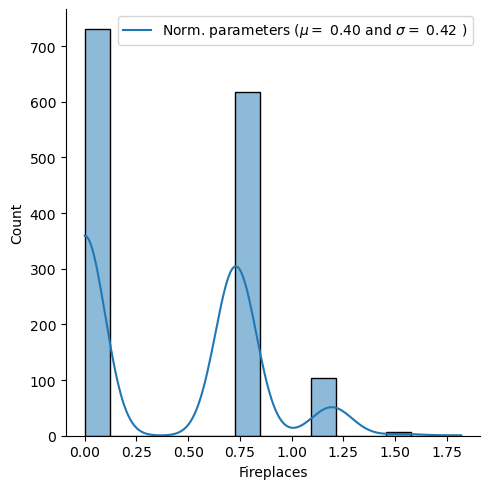

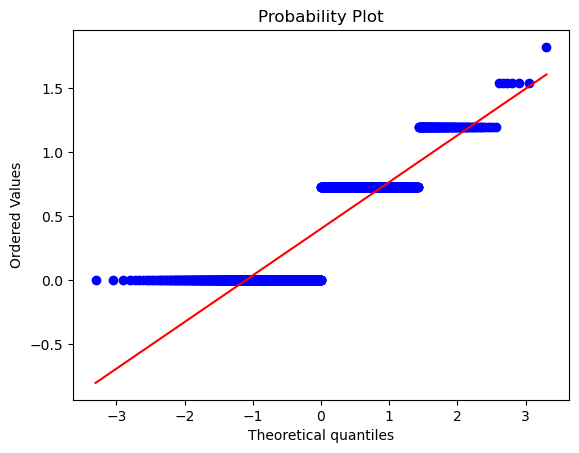

<Figure size 640x480 with 0 Axes>

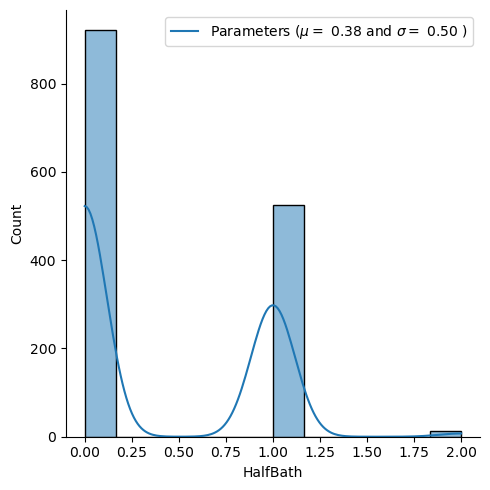

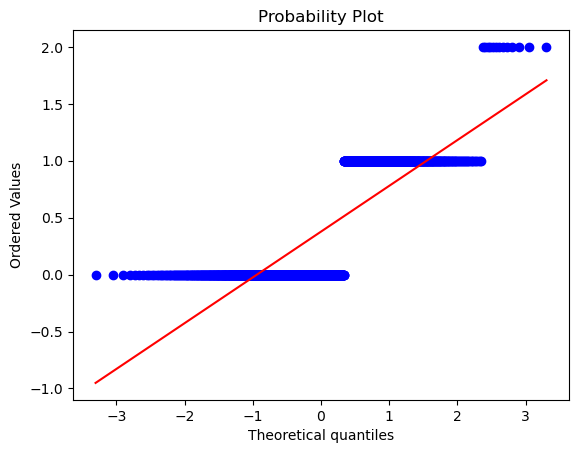

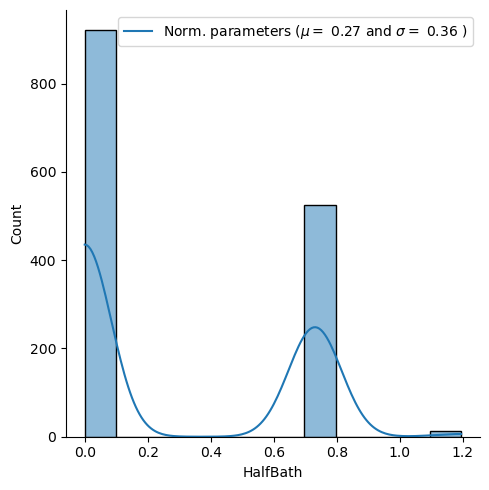

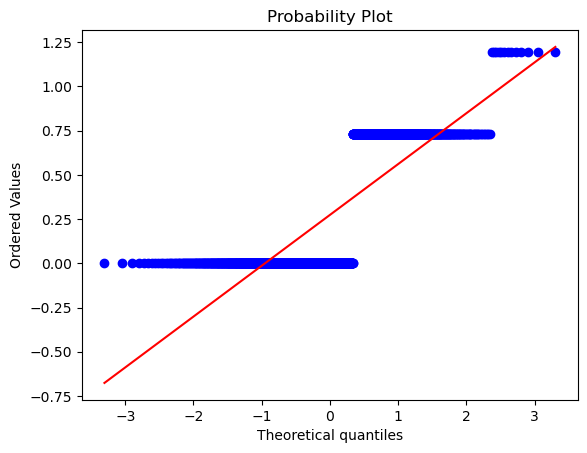

<Figure size 640x480 with 0 Axes>

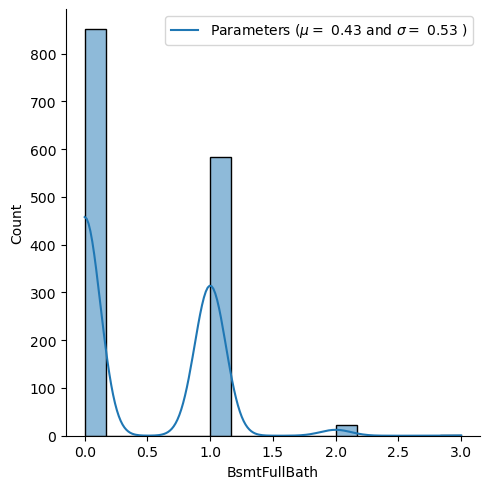

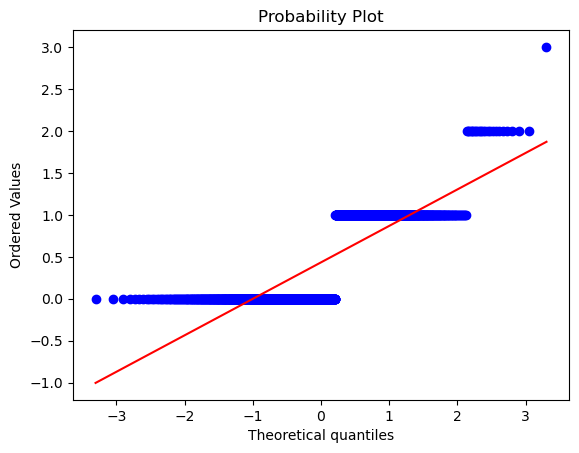

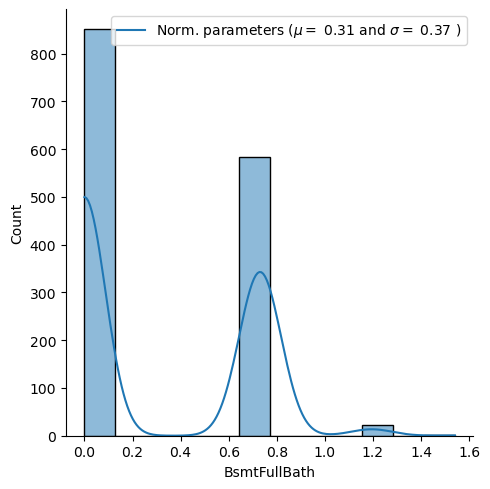

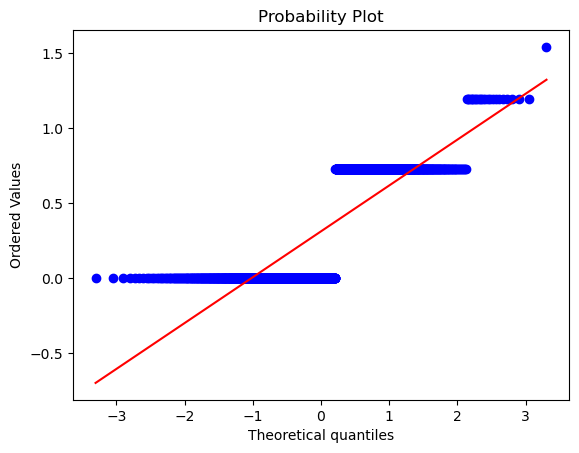

<Figure size 640x480 with 0 Axes>

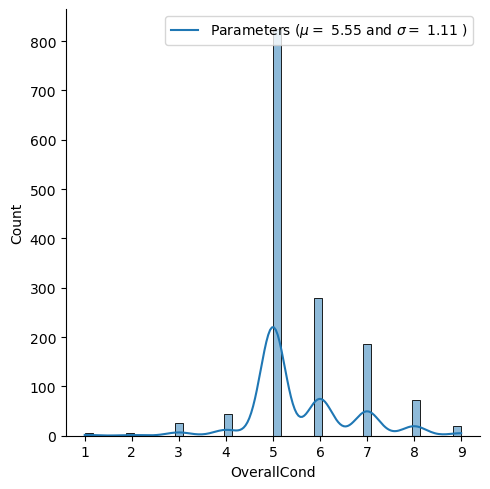

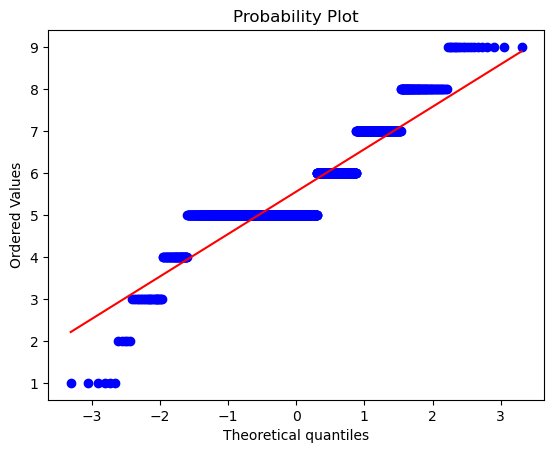

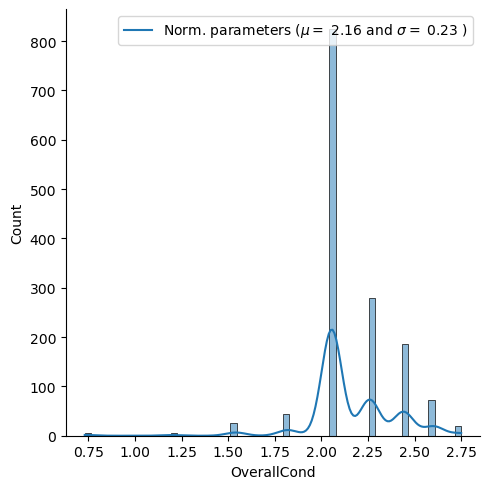

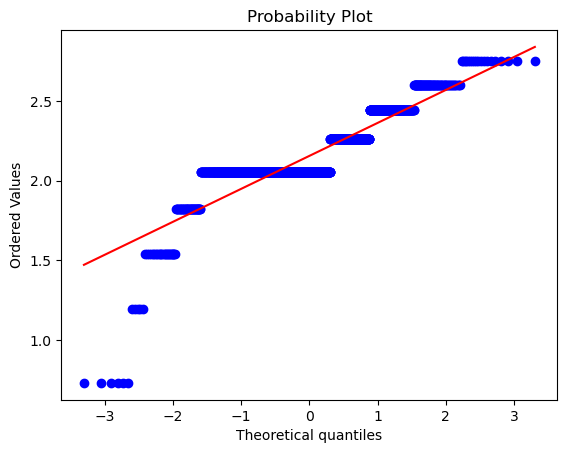

<Figure size 640x480 with 0 Axes>

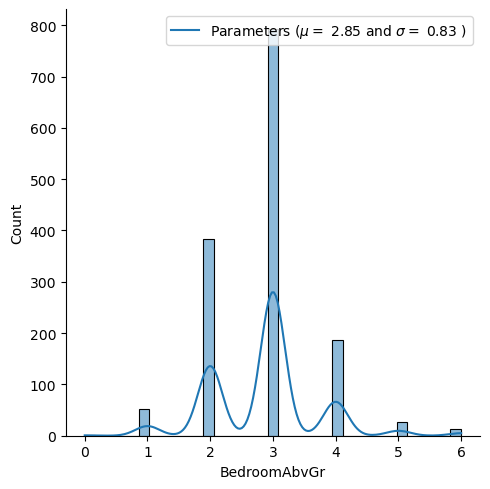

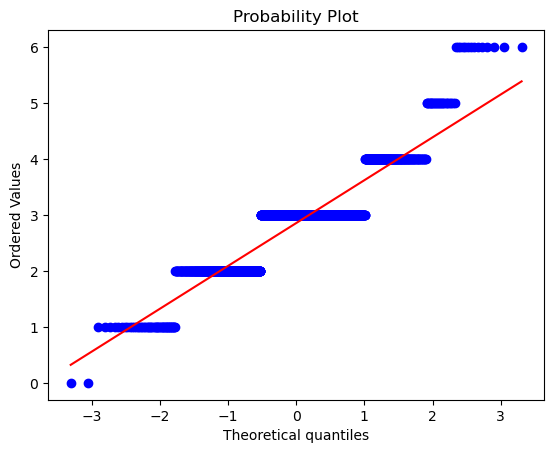

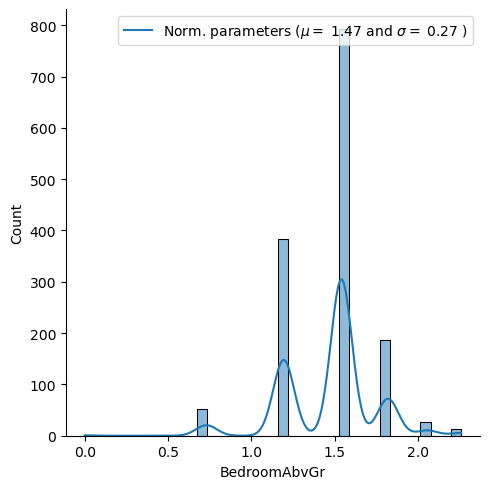

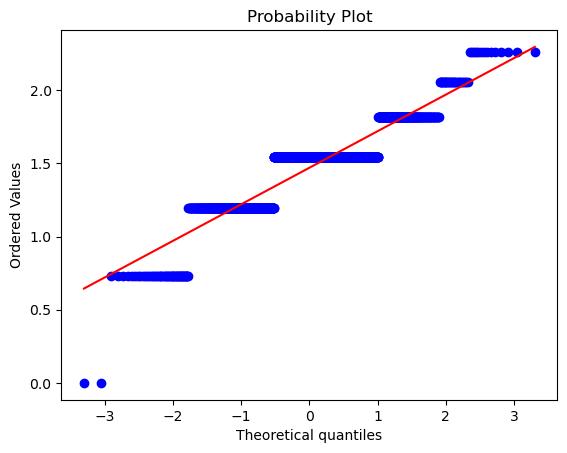

<Figure size 640x480 with 0 Axes>

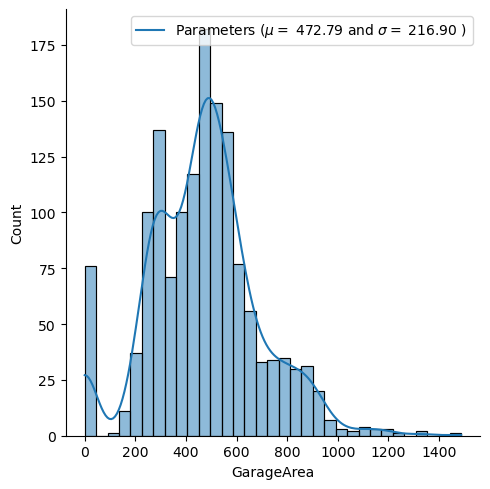

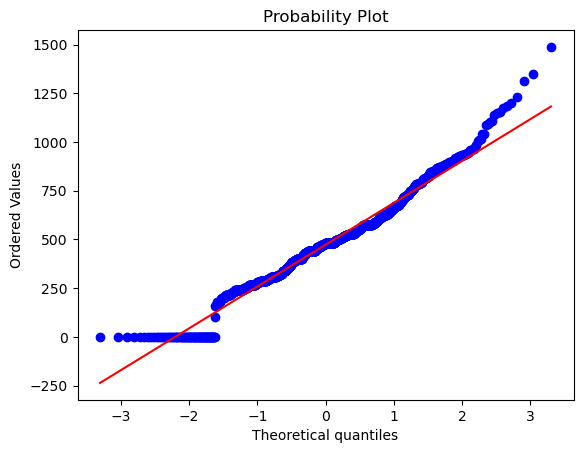

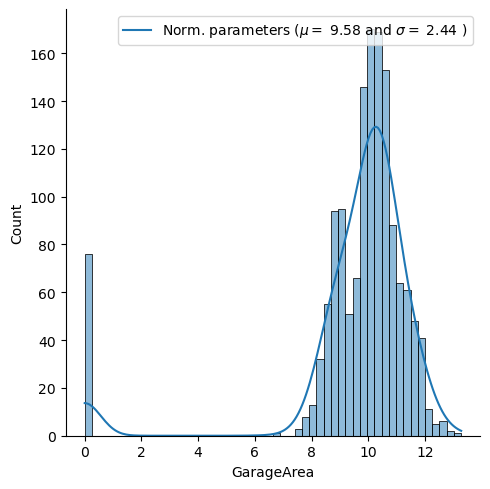

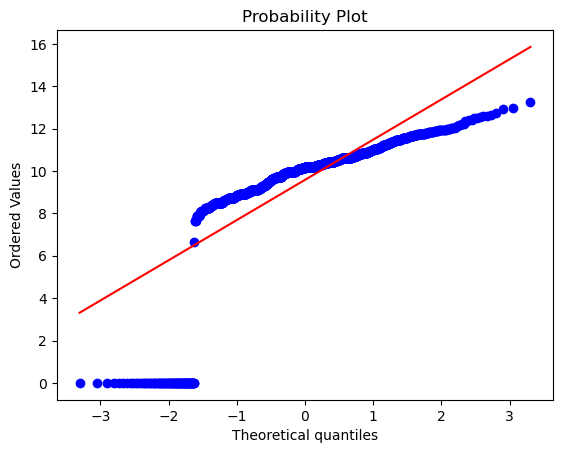

<Figure size 640x480 with 0 Axes>

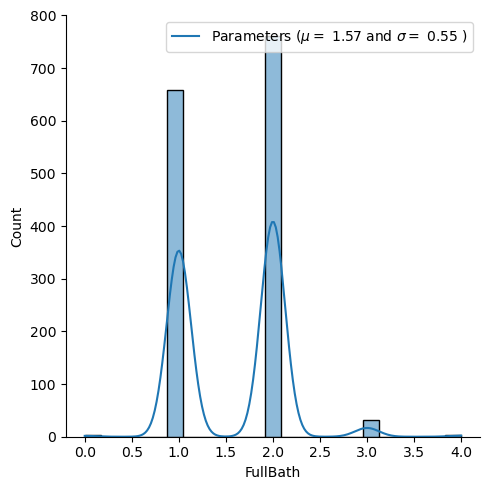

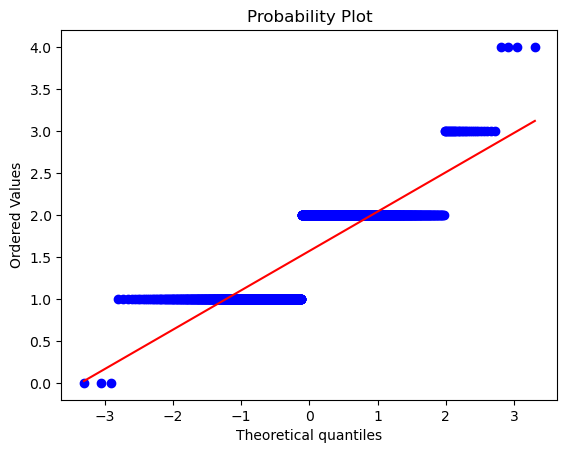

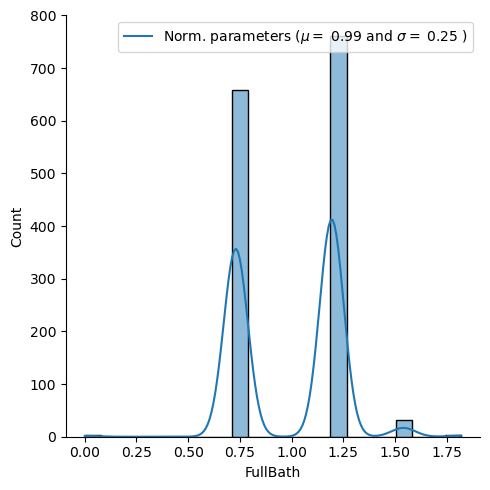

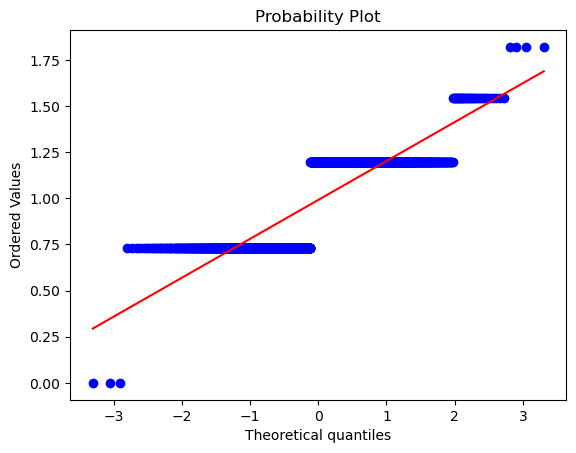

<Figure size 640x480 with 0 Axes>

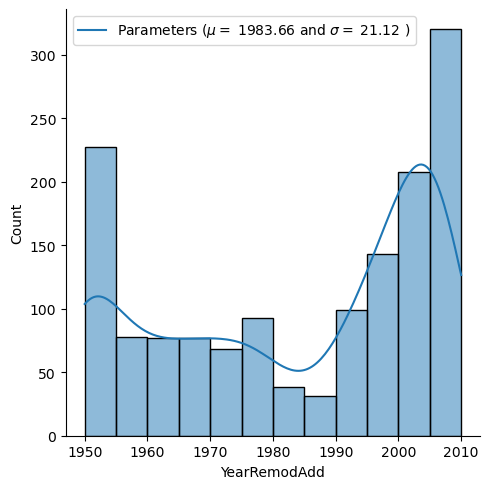

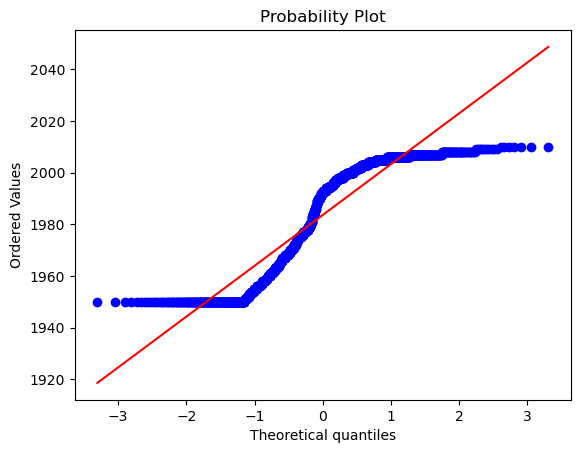

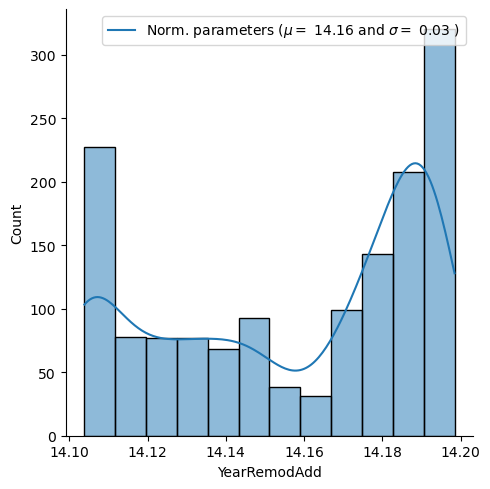

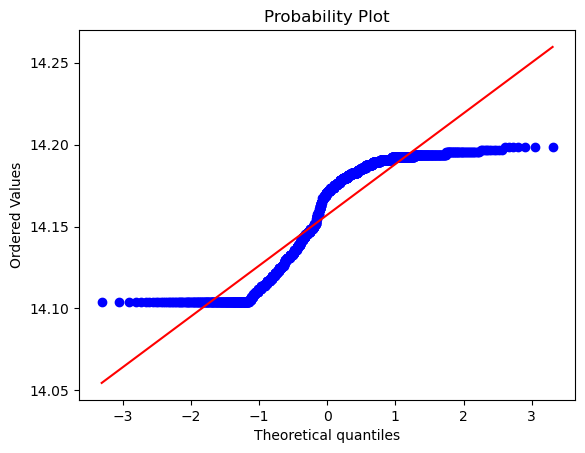

In [45]:
for i, col in enumerate(data_test[skewed_feats2_test].columns):
    plt.figure(i)
    sns.displot(data_test_before_box_cox[col], kde= True)
    (mu, sigma) = norm.fit(data_test_before_box_cox[col])
    plt.legend(['Parameters ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
    plt.show()
    plt.figure(i)
    stats.probplot(data_test_before_box_cox[col], plot=plt)
    plt.show()
    sns.displot(box_cox_transform_test[col], kde= True)
    (mu, sigma) = norm.fit(box_cox_transform_test[col])
    plt.legend(['Norm. parameters ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
    plt.show()
    stats.probplot(box_cox_transform_test[col], plot=plt)
    plt.show()

#### FINAL CHECK FOR NULL VALUES IN NORMAL DATA (TRAINING DATA WITH REMOVED OUTLIERS)

In [46]:
normal_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1168 entries, 0 to 1459
Data columns (total 70 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MiscVal        1168 non-null   float64
 1   PoolArea       1168 non-null   float64
 2   LotArea        1168 non-null   float64
 3   3SsnPorch      1168 non-null   float64
 4   LowQualFinSF   1168 non-null   float64
 5   KitchenAbvGr   1168 non-null   float64
 6   BsmtFinSF2     1168 non-null   float64
 7   ScreenPorch    1168 non-null   float64
 8   BsmtHalfBath   1168 non-null   float64
 9   EnclosedPorch  1168 non-null   float64
 10  MasVnrArea     1168 non-null   float64
 11  OpenPorchSF    1168 non-null   float64
 12  SalePrice      1168 non-null   float64
 13  BsmtFinSF1     1168 non-null   float64
 14  WoodDeckSF     1168 non-null   float64
 15  MSSubClass     1168 non-null   float64
 16  1stFlrSF       1168 non-null   float64
 17  BsmtUnfSF      1168 non-null   float64
 18  2ndFlrSF

#### DEFINING X_TRAIN, Y_TRAIN, X_TEST DATAFRAMES

In [47]:
X_train = normal_data.drop(['SalePrice', 'Outlier'], axis= 1)

y_train = normal_data['SalePrice']

X_test = data_test

#### PRINTING X_TRAIN DATAFRAME

In [48]:
X_train

,MiscVal,PoolArea,LotArea,3SsnPorch,LowQualFinSF,KitchenAbvGr,BsmtFinSF2,ScreenPorch,BsmtHalfBath,EnclosedPorch,...,GarageCond,PavedDrive,SaleType,SaleCondition,OverallQual,FullBath,BedroomAbvGr,GarageArea,MoSold,YrSold
0,0.0,0.0,19.212182,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,4.0,2.0,8.0,4.0,7.0,2.0,3.0,548.0,2.0,2008.0
1,0.0,0.0,19.712205,0.0,0.0,0.730463,0.000000,0.0,0.730463,0.000000,...,4.0,2.0,8.0,4.0,6.0,2.0,3.0,460.0,5.0,2007.0
2,0.0,0.0,20.347241,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,4.0,2.0,8.0,4.0,7.0,2.0,3.0,608.0,9.0,2008.0
3,0.0,0.0,19.691553,0.0,0.0,0.730463,0.000000,0.0,0.000000,8.797736,...,4.0,2.0,8.0,0.0,7.0,1.0,3.0,642.0,2.0,2006.0
4,0.0,0.0,21.325160,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,4.0,2.0,8.0,4.0,8.0,2.0,4.0,836.0,12.0,2008.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,0.0,0.0,22.127608,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,4.0,2.0,8.0,0.0,5.0,1.0,3.0,0.0,7.0,2006.0
1454,0.0,0.0,18.753396,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,4.0,2.0,8.0,4.0,7.0,2.0,2.0,400.0,10.0,2009.0
1455,0.0,0.0,18.960528,0.0,0.0,0.730463,0.000000,0.0,0.000000,0.000000,...,4.0,2.0,8.0,4.0,6.0,2.0,3.0,460.0,8.0,2007.0
1456,0.0,0.0,20.994868,0.0,0.0,0.730463,7.659675,0.0,0.000000,0.000000,...,4.0,2.0,8.0,4.0,6.0,2.0,3.0,500.0,2.0,2010.0


#### DEFINING CROSS-VALIDATION TO AVOID OVER-FITTING

In [49]:
seed=123
kfold = model_selection.KFold(n_splits=5, random_state=None)

#### DEFINING REGRESSION MODELS WITH HYPERPARAMETERS

In [50]:
models = [
    make_pipeline(RobustScaler(), ElasticNet(alpha=0.0005, 
                                             l1_ratio=.9, 
                                             random_state=3)), 
    make_pipeline(RobustScaler(), Lasso(alpha =0.0005, 
                                        random_state=1, 
                                        max_iter=1000000)),  
    make_pipeline(RobustScaler(), Ridge(alpha=0.0005, 
                                        random_state=1)),
    GradientBoostingRegressor(),
    xgb.XGBRegressor(),
    lgb.LGBMRegressor()
]

#### TRAINING ALL MODELS ON TRAIN DATA AND PRINTING RMSE SCORE FOR ALL MODELS

In [51]:
model_name = []
score_train = []
score_test = []

for model in models:
    model.fit(X_train.values,y_train.values)
    score = cross_validate(model, X_train.values, y_train.values, cv=kfold, scoring='neg_root_mean_squared_error', return_train_score=True)
    model_name.append(type(model).__name__)
    score_train.append(-score['train_score'].mean())
    score_test.append(-score['test_score'].mean())
    print(type(model).__name__)
    print(-score['train_score'].mean())
    print(-score['test_score'].mean())

Pipeline
0.6465654881475973
0.7059744104008427
Pipeline
0.6465681430910514
0.7060114410920055
Pipeline
0.646342494648598
0.7080265611920813
GradientBoostingRegressor
0.4438573665846759
0.7521047985698278
XGBRegressor
0.03150608623550792
0.8065747614272576
LGBMRegressor
0.20386299582754558
0.7426984983148885


#### PRINTING DATAFRAME WITH SCORES BEFORE AND AFTER OUTLIER REMOVAL FOR ALL MODELS

In [52]:
overview = pd.concat([pd.DataFrame(model_name).rename(columns={pd.DataFrame(model_name).columns[0]: 'Model name'}), 
                      pd.DataFrame(score_train).rename(columns={pd.DataFrame(score_train).columns[0]: 'RMSE score train'}),
                      pd.DataFrame(score_test).rename(columns={pd.DataFrame(score_test).columns[0]: 'RMSE score test'})], 
                      axis=1)

overview

,Model name,RMSE score train,RMSE score test
0,Pipeline,0.646565,0.705974
1,Pipeline,0.646568,0.706011
2,Pipeline,0.646342,0.708027
3,GradientBoostingRegressor,0.443857,0.752105
4,XGBRegressor,0.031506,0.806575
5,LGBMRegressor,0.203863,0.742698
